In [1]:
import numpy as np
from numpy import loadtxt
import pyreadr
import pandas as pd
import random

import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns

import rpy2.robjects as robjects
from rpy2.robjects import pandas2ri
pandas2ri.activate()

#import qgrid

import sklearn
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
import keras
from keras.models import Sequential
from keras.layers import Dense

#Dependencies
#import tensorflow
from keras.models import Sequential
from keras.layers import Dense



readRDS = robjects.r['readRDS']
pd.set_option("display.max_columns", None)
pd.set_option('precision', 3)
pd.set_option('display.max_colwidth', 0)
#pd.set_option('display.max_colwidth', None)


# evaluate a logistic regression model using repeated k-fold cross-validation
from numpy import mean
from numpy import std
from sklearn.datasets import make_classification
from sklearn.model_selection import RepeatedKFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn import svm


import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn_pandas import DataFrameMapper

import torch
import torchtuples as tt

from pycox.datasets import metabric
from pycox.models import CoxPH
from pycox.evaluation import EvalSurv

Using TensorFlow backend.


ImportError: Numba needs NumPy 1.20 or less

In [7]:

# data_yale_occ_og_path = r'/Users/alexandrabourdillon/Documents/Yale/Oto/NCDB_proj/analysis/data/yale_recurr_original_3.rds'
# data_yale_occ_og = readRDS(data_yale_occ_og_path)

data_yale_occ_og_path = r'/Users/alexandrabourdillon/Documents/Yale/Oto/NCDB_proj/analysis/data/yale_recurr_original_full.rds'
data_yale_occ_og = readRDS(data_yale_occ_og_path)

# 1.0 Preprocessing

In [ ]:
print(data_yale_occ_og.columns.values)
print(data_yale_occ_og)

data_recurr = data_yale_occ_og
data_recurr

In [5]:
np.shape(data_yale_occ_og)

(395, 30)

In [8]:
# -------------------------- One hot encoding
def oneHotEncode(df,colNames):
    for col in colNames:
        if( df[col].dtype == np.dtype('object')):
            dummies = pd.get_dummies(df[col],prefix=col)
            df = pd.concat([df,dummies],axis=1)

            #drop the encoded column
            df.drop([col],axis = 1 , inplace=True)
    return df
    

#data_yale_occ_og['SEX'] = data_yale_occ_og['SEX'].apply(str)
data_yale_occ_og['RACE'] = data_yale_occ_og['RACE'].apply(str)
data_yale_occ_og['CC_SCORE_REGROUPED'] = data_yale_occ_og['CC_SCORE_REGROUPED'].apply(str)
data_yale_occ_og['Tobacco_History'] = data_yale_occ_og['Tobacco_History'].apply(str)
data_yale_occ_og['Alcohol_History'] = data_yale_occ_og['Alcohol_History'].apply(str)


print('There were {} columns before encoding categorical features'.format(data_yale_occ_og.shape[1]))
data_encoded = oneHotEncode(data_yale_occ_og, ['RACE',  
                                               'Insurance_Status_Descrip',
                                               'PRIMARY_SITE_CONSOLIDATED',
                                               'CC_SCORE_REGROUPED',
                                               'Tobacco_History',
                                               'Alcohol_History',
                                              'ND_recode'])
print('There are {} columns after encoding categorical features'.format(data_encoded.shape[1]))

data_encoded



There were 30 columns before encoding categorical features
There are 49 columns after encoding categorical features


,AGE,SEX,YEAR_OF_DIAGNOSIS,BEST_STAGE_RECODED,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,recurr_code,recurr_recode_gradient,recurr_recode_gradient2,Time_Surg_Recurr,Maximum_Follow_up_from_Surg,LN_ratio,recurr_time_final,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic
1,65.0,0.0,2017.0,3.0,38.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,42.0,2.0,2.0,1.0,0.0,9.0,5.0,0,38.0,0.024,38.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0
2,40.0,1.0,2017.0,1.0,33.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,17.0,2.0,1.0,0.0,0.0,9.0,5.0,0,44.0,0.000,44.0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1
3,69.0,0.0,2017.0,1.0,27.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,9.0,5.0,0,40.0,0.000,40.0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,0
4,64.0,1.0,2017.0,4.0,9.0,1.0,1.0,1.0,0.0,1.0,0.0,4.0,29.0,2.0,1.0,2.0,1.0,2.0,1.0,6,40.0,0.138,6.0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,0,0,1
5,72.0,0.0,2017.0,2.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,30.0,1.0,2.0,0.0,0.0,9.0,5.0,0,41.0,0.000,41.0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,78.0,0.0,2013.0,4.0,13.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,3.0,4.0,1.0,1.0,1.0,1.0,2,35.0,0.250,2.0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,1,1,0,0,0,0,1
392,60.0,0.0,2016.0,1.0,28.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,9.0,5.0,0,40.0,0.000,40.0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0
393,51.0,0.0,2015.0,4.0,38.0,1.0,1.0,0.0,0.0,0.0,0.0,3.0,41.0,3.0,4.0,2.0,0.0,9.0,5.0,0,70.0,0.073,70.0,1,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1
394,66.0,1.0,2014.0,1.0,30.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,15.0,3.0,1.0,0.0,0.0,9.0,5.0,0,66.0,0.000,66.0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,0


## 1.1 Visualizing: KM plots 

### 1.1.1 KM plots: ENE

In [8]:
data_ene= data_recurr[data_recurr["ENE"] == 1 ]
data_not= data_recurr[data_recurr["ENE"] != 1 ]
print(data_ene.shape)
print(data_not.shape)

(39, 30)
(356, 30)


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          46.91 <0.005     36.97

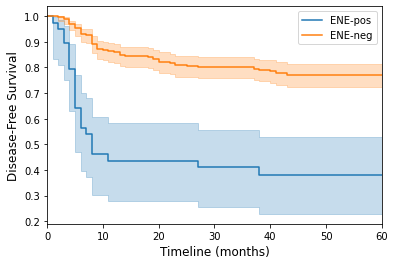

In [8]:
#KM
from lifelines import KaplanMeierFitter
kmf_ene = KaplanMeierFitter()
kmf_not = KaplanMeierFitter()

T_ene = data_ene["recurr_time_final"]
E_ene = data_ene["recurr_code"]

kmf_ene.fit(T_ene, event_observed=E_ene, label ="ENE-pos")
ax = kmf_ene.plot()
ax.set_xlabel('Timeline (months)',fontsize='large')
ax.set_ylabel('Disease-Free Survival',fontsize='large')


T_not = data_not["recurr_time_final"]
E_not = data_not["recurr_code"]

kmf_not.fit(T_not, event_observed=E_not,  label ="ENE-neg")
ax = kmf_not.plot()
ax.set_xlabel('Timeline (months)',fontsize='large')
ax.set_ylabel('Disease-Free Survival',fontsize='large')

plt.xlim([0, 60])
#plt.savefig('km_dfs.png')




from lifelines.statistics import logrank_test
results = logrank_test(T_ene, T_not, event_observed_A = E_ene, event_observed_B = E_not)
results.print_summary()

### 1.1.2 Cumulative Hazard: ENE

In [9]:
kmf_not.survival_function_

,ENE-neg
timeline,
0.0,1.000
2.0,0.997
3.0,0.989
4.0,0.969
5.0,0.952
...,...
103.0,0.772
104.0,0.772
106.0,0.772


,ENE-pos,ENE-neg
timeline,,
0.0,1.000,1.000
2.0,0.949,0.997
3.0,0.897,0.989
4.0,0.795,0.969
5.0,0.641,0.952
6.0,0.564,0.930
7.0,0.538,0.927
8.0,0.462,0.893
11.0,0.436,0.862


<AxesSubplot:xlabel='timeline'>

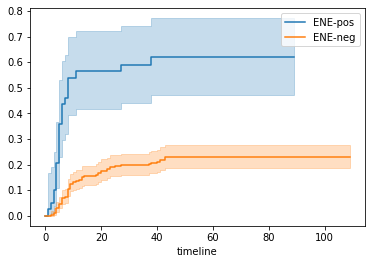

In [10]:
surviv_df_ene = pd.merge(kmf_ene.survival_function_, kmf_not.survival_function_, how ='inner', on = 'timeline')
display(surviv_df_ene)

kmf_ene.plot_cumulative_density()
kmf_not.plot_cumulative_density()

In [583]:
## median survival time:
from lifelines.utils import median_survival_times

#print(median_survival_times(kmf.confidence_interval_)
                            
#print("median survival, ene: " , kmf_ene.median_survival_time)
print("median survival, ene: " , median_survival_times((kmf_ene.confidence_interval_)))
print("median survival, ene: " , median_survival_times((kmf_not.confidence_interval_)))

median survival, ene:       ENE-pos_lower_0.95  ENE-pos_upper_0.95
0.5  5.0                 inf               
median survival, ene:       ENE-neg_lower_0.95  ENE-neg_upper_0.95
0.5  inf                 inf               


,ENE-pos,ENE-neg
timeline,,
0.0,0.000,0.000
2.0,0.052,0.003
3.0,0.107,0.011
4.0,0.226,0.031
5.0,0.438,0.049
6.0,0.563,0.073
7.0,0.608,0.076
8.0,0.758,0.113
11.0,0.814,0.148


<AxesSubplot:xlabel='timeline'>

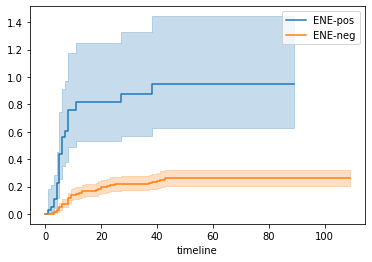

In [214]:
### hazard function
# https://www.kdnuggets.com/2020/07/guide-survival-analysis-python-part-3.html

from lifelines import NelsonAalenFitter

naf_ene = NelsonAalenFitter()
naf_not = NelsonAalenFitter()

naf_ene.fit(T_ene, event_observed=E_ene, label ="ENE-pos")
naf_not.fit(T_not, event_observed=E_not, label ="ENE-neg")

hazard_df_ene = pd.merge(naf_ene.cumulative_hazard_, naf_not.cumulative_hazard_, how ='inner', on = 'timeline')
display(hazard_df_ene)

naf_ene.plot_cumulative_hazard()
naf_not.plot_cumulative_hazard()

###  1.1.3 KM: T staging

In [12]:
data_stage1= data_recurr[data_recurr["t_recode_n"] == 1 ]
data_stage2= data_recurr[data_recurr["t_recode_n"] == 2 ]
data_stage3= data_recurr[data_recurr["t_recode_n"] == 3 ]
data_stage4= data_recurr[data_recurr["t_recode_n"] == 4 ]

print(data_stage1.shape)
print(data_stage2.shape)
print(data_stage3.shape)
print(data_stage4.shape)



(175, 30)
(100, 30)
(45, 30)
(75, 30)


(0.0, 60.0)

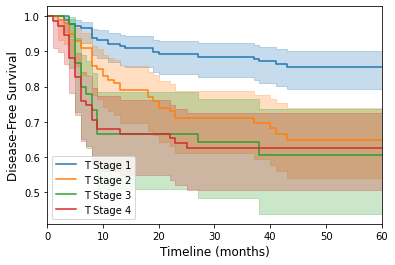

In [13]:
#KM
from lifelines import KaplanMeierFitter
kmf = KaplanMeierFitter()

T_1 = data_stage1["recurr_time_final"]
E_1 = data_stage1["recurr_code"]

T_2 = data_stage2["recurr_time_final"]
E_2 = data_stage2["recurr_code"]

T_3 = data_stage3["recurr_time_final"]
E_3 = data_stage3["recurr_code"]

T_4 = data_stage4["recurr_time_final"]
E_4 = data_stage4["recurr_code"]



kmf.fit(T_1, event_observed=E_1, label ="T Stage 1")
ax = kmf.plot()
ax.set_xlabel('Timeline (months)',fontsize='large')
ax.set_ylabel('Disease-Free Survival',fontsize='large')

kmf.fit(T_2, event_observed=E_2, label ="T Stage 2")
ax = kmf.plot()
ax.set_xlabel('Timeline (months)',fontsize='large')
ax.set_ylabel('Disease-Free Survival',fontsize='large')

kmf.fit(T_3, event_observed=E_3, label ="T Stage 3")
ax = kmf.plot()
ax.set_xlabel('Timeline (months)',fontsize='large')
ax.set_ylabel('Disease-Free Survival',fontsize='large')

kmf.fit(T_4, event_observed=E_4, label ="T Stage 4")
ax = kmf.plot()
ax.set_xlabel('Timeline (months)',fontsize='large')
ax.set_ylabel('Disease-Free Survival',fontsize='large')

plt.xlim([0, 60])
#plt.savefig('km_dfs.png')


In [86]:
from lifelines.statistics import logrank_test

print("--------------1 vs 2 --------------")
results = logrank_test(T_1, T_2, event_observed_A = E_1, event_observed_B = E_2)
results.print_summary()

print("--------------2 vs 3 --------------")
results = logrank_test(T_2, T_3, event_observed_A = E_2, event_observed_B = E_3)
results.print_summary()

print("--------------2 vs 4 --------------")
results = logrank_test(T_2, T_4, event_observed_A = E_2, event_observed_B = E_4)
results.print_summary()


print("--------------1 vs 3 --------------")

results = logrank_test(T_1, T_3, event_observed_A = E_1, event_observed_B = E_3)
results.print_summary()

print("--------------3 vs 4 --------------")
results = logrank_test(T_3, T_4, event_observed_A = E_3, event_observed_B = E_4)
results.print_summary()

print("--------------1 vs 4 --------------")
results = logrank_test(T_1, T_4, event_observed_A = E_1, event_observed_B = E_4)
results.print_summary()


--------------1 vs 2 --------------


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          15.52 <0.005     13.58

--------------2 vs 3 --------------


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.69 0.41      1.30

--------------2 vs 4 --------------


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.89 0.35      1.53

--------------1 vs 3 --------------


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          17.17 <0.005     14.84

--------------3 vs 4 --------------


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic    p  -log2(p)
           0.01 0.91      0.14

--------------1 vs 4 --------------


<lifelines.StatisticalResult: logrank_test>
               t_0 = -1
 null_distribution = chi squared
degrees_of_freedom = 1
         test_name = logrank_test

---
 test_statistic      p  -log2(p)
          21.42 <0.005     18.05

## 1.2 X and y datasets

In [8]:
data_encoded.columns.values

array(['AGE', 'SEX', 'YEAR_OF_DIAGNOSIS', 'BEST_STAGE_RECODED',
       'DX_DEFSURG_STARTED_DAYS', 'RT_Y_N', 'chemo_binary', 'ENE', 'PNI',
       'LVI', 'POS_SURG_MARGINS', 'Positive_LNs', 'LN_yield',
       'GRADE_recode', 't_recode_n', 'n_recode_n', 'recurr_code',
       'recurr_recode_gradient', 'recurr_recode_gradient2',
       'Time_Surg_Recurr', 'Maximum_Follow_up_from_Surg', 'LN_ratio',
       'recurr_time_final', 'RACE_1.0', 'RACE_2.0', 'RACE_3.0',
       'RACE_4.0', 'RACE_5.0', 'Insurance_Status_Descrip_Medicaid',
       'Insurance_Status_Descrip_Medicare',
       'Insurance_Status_Descrip_Not Insured',
       'Insurance_Status_Descrip_Private/Managed',
       'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
       'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
       'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
       'PRIMARY_SITE_CONSOLIDATED_Tongue', 'CC_SCORE_REGROUPED_0.0',
       'CC_SCORE_REGROUPED_1.0', 'CC_SCORE_REGROUPED_2.0',
       'Tobacco_History_

In [9]:
X = data_encoded.drop('recurr_code', axis = 1).copy()
#X = data_yale_occ_og.drop('recurr_code', axis = 1).copy()

X = X.drop('LN_ratio', axis = 1)
X = X.drop('BEST_STAGE_RECODED', axis = 1)
#X = X.drop('MSKCC_Nomo_Appropriate', axis = 1)
#X = X.drop('GRADE_recode', axis = 1)
X = X.drop('recurr_recode_gradient', axis = 1)
X = X.drop('recurr_recode_gradient2', axis = 1)

cols_to_norm = [
    'AGE',
    'YEAR_OF_DIAGNOSIS', 
    #'BEST_STAGE_RECODED',
    'DX_DEFSURG_STARTED_DAYS',
    'Positive_LNs', 'LN_yield',
    #'LN_ratio',
    'GRADE_recode', 
    't_recode_n', 'n_recode_n',
    
    'RACE_1.0', 'RACE_2.0', 'RACE_3.0',
    'RACE_4.0', 'RACE_5.0', 
    'Insurance_Status_Descrip_Medicaid',
    'Insurance_Status_Descrip_Medicare',
    'Insurance_Status_Descrip_Not Insured',
    'Insurance_Status_Descrip_Private/Managed',
    'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
    'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
    'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
    'PRIMARY_SITE_CONSOLIDATED_Tongue', 
    'CC_SCORE_REGROUPED_0.0',
    'CC_SCORE_REGROUPED_1.0', 
    'CC_SCORE_REGROUPED_2.0',
    'Tobacco_History_0.0', 'Tobacco_History_1.0',
    'Tobacco_History_2.0', 'Alcohol_History_0.0',
    'Alcohol_History_1.0', 'Alcohol_History_2.0', 'ND_recode_Elective',
    'ND_recode_No Neck Dissection', 'ND_recode_Therapeutic'
    ]
X[cols_to_norm] = X[cols_to_norm].apply(lambda x: (x - x.min()) / (x.max() - x.min()))



y = data_yale_occ_og['recurr_code'].copy()

data_encoded_2 = pd.concat([X,y], axis = 1)

In [10]:
data_encoded_2

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,Time_Surg_Recurr,Maximum_Follow_up_from_Surg,recurr_time_final,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0,38.0,38.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,0,44.0,44.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,0,40.0,40.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,6,40.0,6.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,0,41.0,41.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,2,35.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,0,40.0,40.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,0,70.0,70.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,0,66.0,66.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0


In [11]:
y

1      0.0
2      0.0
3      0.0
4      1.0
5      0.0
      ... 
391    1.0
392    0.0
393    0.0
394    0.0
395    0.0
Name: recurr_code, Length: 395, dtype: float64

## 1.3 correlation matrix

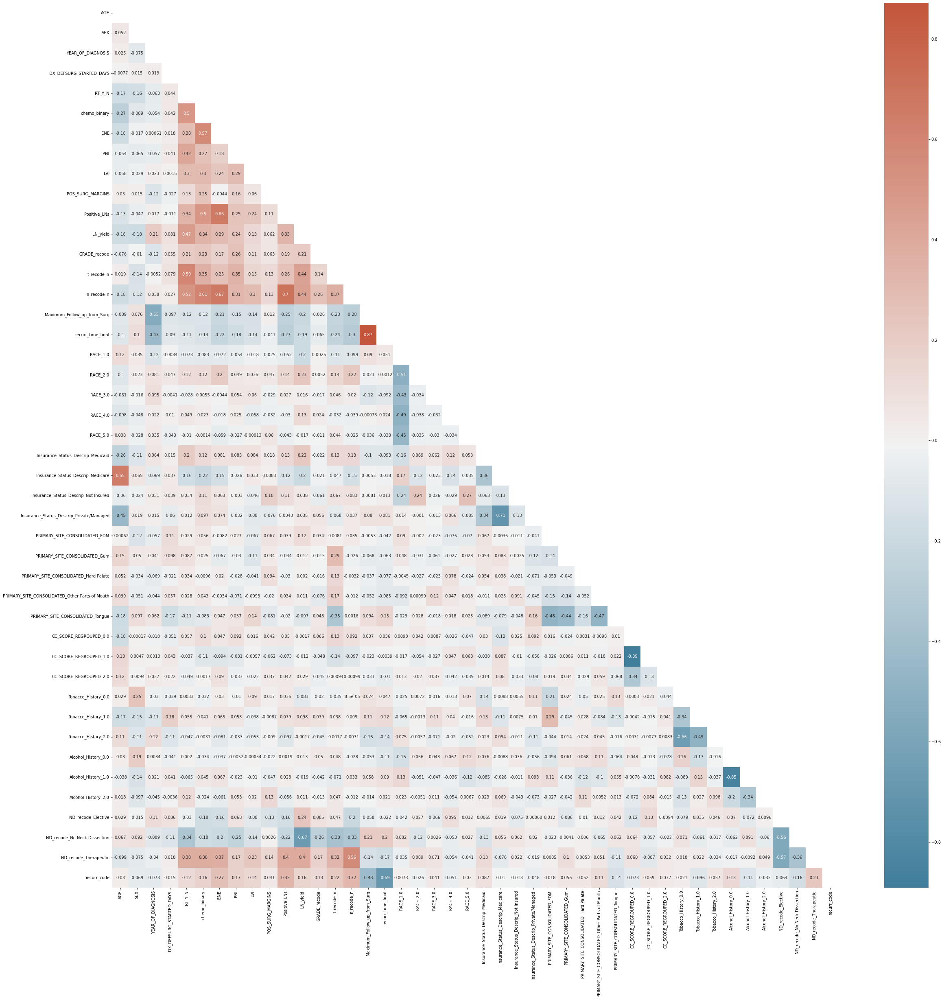

In [12]:
df_full_data = pd.concat([X, y], axis = 1)
df_full_data

relation = df_full_data.corr()
relation_index=relation.index
fig, ax = plt.subplots(figsize=(40,40))

# Generate a mask for upper triangle
mask = np.triu(np.ones_like(relation_index, dtype=bool))
# Configure a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)
#
g = sns.heatmap(df_full_data[relation_index].corr(),annot=True, mask = mask, cmap=cmap)




## 1.4 split into training + testing  (70:30)

In [10]:
X_hazard = data_encoded_2[[
    'AGE', 'SEX', 
    'YEAR_OF_DIAGNOSIS', 
    ######### 'BEST_STAGE_RECODED',
    'DX_DEFSURG_STARTED_DAYS', 'RT_Y_N', 'chemo_binary', 
    'ENE', 'PNI',
    'LVI', 'POS_SURG_MARGINS',
    'Positive_LNs', 'LN_yield',
    'GRADE_recode',
    't_recode_n', 'n_recode_n', 
    ########'recurr_recode_gradient', 'recurr_recode_gradient2',
    ######### 'Time_Surg_Recurr', 'Maximum_Follow_up_from_Surg', 'LN_ratio',
    'RACE_1.0', 'RACE_2.0', 'RACE_3.0',
    'RACE_4.0', 'RACE_5.0', 
    'Insurance_Status_Descrip_Medicaid',
    'Insurance_Status_Descrip_Medicare',
    'Insurance_Status_Descrip_Not Insured',
    'Insurance_Status_Descrip_Private/Managed',
    'PRIMARY_SITE_CONSOLIDATED_FOM', 
    'PRIMARY_SITE_CONSOLIDATED_Gum',
    'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
    'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
    'PRIMARY_SITE_CONSOLIDATED_Tongue',
    'CC_SCORE_REGROUPED_0.0',
    'CC_SCORE_REGROUPED_1.0', 
    'CC_SCORE_REGROUPED_2.0',
    'Tobacco_History_0.0', 
    'Tobacco_History_1.0',
    'Tobacco_History_2.0', 
    'Alcohol_History_0.0',
    'Alcohol_History_1.0', 
    'Alcohol_History_2.0',
    'ND_recode_Elective',
    'ND_recode_No Neck Dissection', 
    'ND_recode_Therapeutic',
    'recurr_code',
    'recurr_time_final'
    ]] 

In [11]:
X_hazard

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,66.0


In [16]:
from sksurv.util import Surv

X = X_hazard.drop(['recurr_code'], axis = 1).copy()
X = X.drop(['recurr_time_final'], axis = 1)
X
y_format = pd.concat([X_hazard['recurr_code'], X_hazard['recurr_time_final']], axis = 1)
y_format['recurr_code_bool'] = y_format['recurr_code'].astype('bool')
y_format = y_format.drop(['recurr_code'], axis =1)
y_format = y_format[['recurr_code_bool', 'recurr_time_final']]
y_format.dtypes
y_format
y_format_2 = Surv.from_arrays(
    event = y_format['recurr_code_bool'],
    time = y_format['recurr_time_final'])
y_format_2.dtype

dtype([('event', '?'), ('time', '<f8')])

In [24]:
np.shape(X)

(395, 41)

In [25]:
tmp_train,tmp_test = train_test_split(data_encoded,test_size = 0.3, 
                                                 stratify = y_format_2['event'], 
                                                 random_state = 3)


In [26]:
tmp_train

,AGE,SEX,YEAR_OF_DIAGNOSIS,BEST_STAGE_RECODED,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,recurr_code,recurr_recode_gradient,recurr_recode_gradient2,Time_Surg_Recurr,Maximum_Follow_up_from_Surg,LN_ratio,recurr_time_final,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic
325,52.0,0.0,2014.0,4.0,22.0,1.0,0.0,0.0,0.0,0.0,0.0,4.0,36.0,2.0,2.0,2.0,0.0,9.0,5.0,0,67.0,0.111,67.0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,1
100,70.0,0.0,2018.0,1.0,26.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,9.0,5.0,0,34.0,0.000,34.0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,1,0
222,66.0,1.0,2016.0,4.0,48.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,19.0,1.0,4.0,0.0,0.0,9.0,5.0,0,53.0,0.000,53.0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,1,0,0,1,0,0
365,59.0,1.0,2012.0,1.0,25.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,3.0,1.0,0.0,1.0,1.0,1.0,4,18.0,0.000,4.0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0,1,0,0
6,57.0,0.0,2018.0,2.0,62.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,42.0,2.0,2.0,0.0,0.0,9.0,5.0,0,23.0,0.000,23.0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,75.0,0.0,2014.0,1.0,20.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,13.0,2.0,1.0,0.0,0.0,9.0,5.0,0,49.0,0.000,49.0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,1,0,1,0,0
162,59.0,1.0,2017.0,2.0,78.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,16.0,2.0,2.0,0.0,1.0,1.0,1.0,2,40.0,0.000,2.0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,1,0,0,1,0,0
238,58.0,0.0,2013.0,1.0,11.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,49.0,2.0,1.0,0.0,0.0,9.0,5.0,0,95.0,0.000,95.0,1,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,0,1
195,60.0,0.0,2018.0,3.0,40.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,112.0,2.0,1.0,1.0,0.0,9.0,5.0,0,30.0,0.009,30.0,1,0,0,0,0,1,0,0,0,1,0,0,0,0,1,0,0,0,0,1,0,1,0,1,0,0


In [23]:
tmp_train.to_excel('occ_deepsurv_train.xlsx')
tmp_test.to_excel('occ_deepsurv_test.xlsx')

In [17]:
#random.seed(10)
from sklearn.model_selection import train_test_split


X_train,X_test,y_train,y_test = train_test_split(X,y_format_2,test_size = 0.3, 
                                                 stratify = y_format_2['event'], 
                                                 random_state = 3)

print(np.shape(X_train))
print(np.shape(X_test))
print(np.shape(y_train))
print(np.shape(y_test))


# print(X_train.isnull().sum().sum())
# print(X_train.isnull().sum())

print("-----------counts: ")
print("Train, 0: ", np.bincount(y_train['event'])[0])
print("Train, 1: ", np.bincount(y_train['event'])[1])
print("Test, 0: ", np.bincount(y_test['event'])[0])
print("Test, 1: ", np.bincount(y_test['event'])[1])

print("-----------last date: ")
print(np.max(pd.DataFrame(y_train)))
print(np.max(pd.DataFrame(y_test)))


(276, 41)
(119, 41)
(276,)
(119,)
-----------counts: 
Train, 0:  205
Train, 1:  71
Test, 0:  88
Test, 1:  31
-----------last date: 
event    True 
time     109.0
dtype: object
event    True 
time     106.0
dtype: object


In [18]:
X_train

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic
325,0.394,0.0,0.286,0.050,1.0,0.0,0.0,0.0,0.0,0.0,0.211,0.321,0.5,0.333,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
100,0.648,0.0,0.857,0.059,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
222,0.592,1.0,0.571,0.108,1.0,0.0,0.0,0.0,0.0,0.0,0.000,0.170,0.0,1.000,0.000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
365,0.493,1.0,0.000,0.056,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.045,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
6,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
93,0.718,0.0,0.286,0.045,0.0,0.0,0.0,1.0,1.0,0.0,0.000,0.116,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0
162,0.493,1.0,0.714,0.176,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.143,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
238,0.479,0.0,0.143,0.025,1.0,0.0,0.0,1.0,0.0,0.0,0.000,0.438,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
195,0.507,0.0,0.857,0.090,1.0,1.0,0.0,0.0,0.0,0.0,0.053,1.000,0.5,0.000,0.333,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0


In [1]:
print(np.mean(pd.DataFrame(y_train)))
print(np.std(pd.DataFrame(y_train)))


print(np.mean(pd.DataFrame(y_test)))
print(np.std(pd.DataFrame(y_test)))



NameError: name 'y_train' is not defined

In [61]:
y_train_pd = pd.DataFrame(y_train)
y_train_pd

y_test_pd = pd.DataFrame(y_test)
y_test_pd

# display(X_train)
# display(y_train_pd)


# X_train_reset =  X_train.reset_index(drop=True)
# display(X_train_reset)

full_train = pd.concat([X_train.reset_index(drop=True), pd.DataFrame(y_train_pd)], axis =1)
# display(full_train)

full_test = pd.concat([X_test.reset_index(drop=True), pd.DataFrame(y_test_pd)], axis =1)
# display(full_test)

### full_train

In [20]:

import pandas_profiling
pandas_profiling.ProfileReport(full_train)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### full test

In [21]:
pandas_profiling.ProfileReport(full_test)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### three variations of inputs

In [17]:
full_train.columns.values

array(['AGE', 'SEX', 'YEAR_OF_DIAGNOSIS', 'DX_DEFSURG_STARTED_DAYS',
       'RT_Y_N', 'chemo_binary', 'ENE', 'PNI', 'LVI', 'POS_SURG_MARGINS',
       'Positive_LNs', 'LN_yield', 'GRADE_recode', 't_recode_n',
       'n_recode_n', 'RACE_1.0', 'RACE_2.0', 'RACE_3.0', 'RACE_4.0',
       'RACE_5.0', 'Insurance_Status_Descrip_Medicaid',
       'Insurance_Status_Descrip_Medicare',
       'Insurance_Status_Descrip_Not Insured',
       'Insurance_Status_Descrip_Private/Managed',
       'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
       'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
       'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
       'PRIMARY_SITE_CONSOLIDATED_Tongue', 'CC_SCORE_REGROUPED_0.0',
       'CC_SCORE_REGROUPED_1.0', 'CC_SCORE_REGROUPED_2.0',
       'Tobacco_History_0.0', 'Tobacco_History_1.0',
       'Tobacco_History_2.0', 'Alcohol_History_0.0',
       'Alcohol_History_1.0', 'Alcohol_History_2.0', 'ND_recode_Elective',
       'ND_recode_No Neck Dissection',

In [62]:
y_train_comp = get_target(full_train_comp)
y_train_comp

KeyError: 'recurr_time_final'

In [47]:
############## worked dec 8 before 4pm####################
#########################################################

# cols_stand = []
# cols_leave_comp = [
#     'AGE', 'SEX', 
#     'YEAR_OF_DIAGNOSIS', 'DX_DEFSURG_STARTED_DAYS',
#     'RT_Y_N', 'chemo_binary', 'ENE', 'PNI', 'LVI', 'POS_SURG_MARGINS',
#     'Positive_LNs', 'LN_yield', 'GRADE_recode', 't_recode_n',
#     'n_recode_n', 'RACE_1.0', 'RACE_2.0', 'RACE_3.0', 'RACE_4.0',
#     'RACE_5.0', 'Insurance_Status_Descrip_Medicaid',
#     'Insurance_Status_Descrip_Medicare',
#     'Insurance_Status_Descrip_Not Insured',
#     'Insurance_Status_Descrip_Private/Managed',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue', 'CC_SCORE_REGROUPED_0.0',
#     'CC_SCORE_REGROUPED_1.0', 'CC_SCORE_REGROUPED_2.0',
#     'Tobacco_History_0.0', 'Tobacco_History_1.0',
#     'Tobacco_History_2.0', 'Alcohol_History_0.0',
#     'Alcohol_History_1.0', 'Alcohol_History_2.0', 'ND_recode_Elective',
#     'ND_recode_No Neck Dissection', 'ND_recode_Therapeutic']

# cols_leave_select = [
#     't_recode_n',
#     'n_recode_n',
#     'chemo_binary', 
#     'ENE', 'PNI', 'LVI',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue',
#     'CC_SCORE_REGROUPED_0.0',
#     'CC_SCORE_REGROUPED_1.0', 
#     'CC_SCORE_REGROUPED_2.0',
#     #'BEST_STAGE_RECODED',
#     'LN_yield',
#     'Positive_LNs',
#     'ND_recode_Elective', 
#     #'ND_recode_No Neck Dissection',
#     'ND_recode_Therapeutic',
#      'RT_Y_N',
#     #'Alcohol_History_9.0'
#     'Alcohol_History_0.0', 
#     'Alcohol_History_1.0',
#     'Alcohol_History_2.0']

# cols_leave_nomo = [
#     'SEX', 'AGE', 
#     'Tobacco_History_0.0',
#     'Tobacco_History_1.0', 
#     'Tobacco_History_2.0',
#     'POS_SURG_MARGINS', 
#     't_recode_n', 
#     'n_recode_n',
#     #'GRADE_recode',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 
#     'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue']


# ## x mapper
# standardize = [([col], None) for col in cols_stand]
# leave_comp = [(col, None) for col in cols_leave_comp]
# leave_select = [(col, None) for col in cols_leave_select]
# leave_nomo = [(col, None) for col in cols_leave_nomo]

# x_mapper_comp = DataFrameMapper(standardize + leave_comp)
# x_mapper_select = DataFrameMapper(standardize + leave_select)
# x_mapper_nomo = DataFrameMapper(standardize + leave_nomo)

# ## y labels
# get_target = lambda df: (df['time'].values, df['event'].values)


# print("----- Comprehensive shape")
# full_train_comp = full_train
# full_test_comp = full_test

# X_train_comp = x_mapper_comp.fit_transform(full_train_comp).astype('float32')
# y_train_comp = full_train_comp[['time', 'event']].copy()
# X_test_comp = x_mapper_comp.fit_transform(full_test_comp).astype('float32')
# y_test_comp = full_test_comp[['time', 'event']].copy()

# print("X_train_comp: ", X_train_comp.shape)
# print("y_train_comp: ", y_train_comp.shape)
# print("X_test_comp: ", X_test_comp.shape)
# print("y_test_comp: ", y_test_comp.shape)

# print("----- Select shape")
# full_train_select = full_train[[
#      't_recode_n',
#     'n_recode_n',
#     'chemo_binary', 
#     'ENE', 'PNI', 'LVI',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue',
#     'CC_SCORE_REGROUPED_0.0',
#     'CC_SCORE_REGROUPED_1.0', 
#     'CC_SCORE_REGROUPED_2.0',
#     #'BEST_STAGE_RECODED',
#     'LN_yield',
#     'Positive_LNs',
#     'ND_recode_Elective', 
#     #'ND_recode_No Neck Dissection',
#     'ND_recode_Therapeutic',
#      'RT_Y_N',
#     #'Alcohol_History_9.0'
#     'Alcohol_History_0.0', 
#     'Alcohol_History_1.0',
#     'Alcohol_History_2.0',
#     'event', 'time']].copy()
# full_test_select = full_test[[
#      't_recode_n',
#     'n_recode_n',
#     'chemo_binary', 
#     'ENE', 'PNI', 'LVI',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue',
#     'CC_SCORE_REGROUPED_0.0',
#     'CC_SCORE_REGROUPED_1.0', 
#     'CC_SCORE_REGROUPED_2.0',
#     #'BEST_STAGE_RECODED',
#     'LN_yield',
#     'Positive_LNs',
#     'ND_recode_Elective', 
#     #'ND_recode_No Neck Dissection',
#     'ND_recode_Therapeutic',
#      'RT_Y_N',
#     #'Alcohol_History_9.0'
#     'Alcohol_History_0.0', 
#     'Alcohol_History_1.0',
#     'Alcohol_History_2.0',
#     'event', 'time']].copy()

# X_train_select = x_mapper_select.fit_transform(full_train_select).astype('float32')
# y_train_select = full_train_select[['time', 'event']].copy()
# X_test_select = x_mapper_select.fit_transform(full_test_select).astype('float32')
# y_test_select = full_test_select[['time', 'event']].copy()

# print("X_train_select: ", X_train_select.shape)
# print("y_train_select: ", y_train_select.shape)
# print("X_test_select: ", X_test_select.shape)
# print("y_test_select: ", y_test_select.shape)


# print("----- Nomo shape")
# full_train_nomo = full_train[[
#     'SEX', 'AGE', 
#     'Tobacco_History_0.0',
#     'Tobacco_History_1.0', 
#     'Tobacco_History_2.0',
#     'POS_SURG_MARGINS', 
#     't_recode_n', 
#     'n_recode_n',
#     #'GRADE_recode',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 
#     'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue',
#     'event', 'time']].copy()
# full_test_nomo = full_test[[
#     'SEX', 'AGE', 
#     'Tobacco_History_0.0',
#     'Tobacco_History_1.0', 
#     'Tobacco_History_2.0',
#     'POS_SURG_MARGINS', 
#     't_recode_n', 
#     'n_recode_n',
#     #'GRADE_recode',
#     'PRIMARY_SITE_CONSOLIDATED_FOM', 
#     'PRIMARY_SITE_CONSOLIDATED_Gum',
#     'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
#     'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
#     'PRIMARY_SITE_CONSOLIDATED_Tongue',
#     'event', 'time']].copy()
    
# X_train_nomo = x_mapper_nomo.fit_transform(full_train_nomo).astype('float32')
# y_train_nomo = full_train_nomo[['time', 'event']].copy()
# X_test_nomo = x_mapper_nomo.fit_transform(full_test_nomo).astype('float32')
# y_test_nomo = full_test_nomo[['time', 'event']].copy()

# print("X_train_nomo: ", X_train_nomo.shape)
# print("y_train_nomo: ", y_train_nomo.shape)
# print("X_test_nomo: ", X_test_nomo.shape)
# print("y_test_nomo: ", y_test_nomo.shape)


----- Comprehensive shape
X_train_comp:  (276, 41)
y_train_comp:  (276, 2)
X_test_comp:  (119, 41)
y_test_comp:  (119, 2)
----- Select shape
X_train_select:  (276, 22)
y_train_select:  (276, 2)
X_test_select:  (119, 22)
y_test_select:  (119, 2)
----- Nomo shape
X_train_nomo:  (276, 13)
y_train_nomo:  (276, 2)
X_test_nomo:  (119, 13)
y_test_nomo:  (119, 2)


In [63]:
cols_stand = []
cols_leave_comp = [
    'AGE', 'SEX', 
    'YEAR_OF_DIAGNOSIS', 'DX_DEFSURG_STARTED_DAYS',
    'RT_Y_N', 'chemo_binary', 'ENE', 'PNI', 'LVI', 'POS_SURG_MARGINS',
    'Positive_LNs', 'LN_yield', 'GRADE_recode', 't_recode_n',
    'n_recode_n', 'RACE_1.0', 'RACE_2.0', 'RACE_3.0', 'RACE_4.0',
    'RACE_5.0', 'Insurance_Status_Descrip_Medicaid',
    'Insurance_Status_Descrip_Medicare',
    'Insurance_Status_Descrip_Not Insured',
    'Insurance_Status_Descrip_Private/Managed',
    'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
    'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
    'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
    'PRIMARY_SITE_CONSOLIDATED_Tongue', 'CC_SCORE_REGROUPED_0.0',
    'CC_SCORE_REGROUPED_1.0', 'CC_SCORE_REGROUPED_2.0',
    'Tobacco_History_0.0', 'Tobacco_History_1.0',
    'Tobacco_History_2.0', 'Alcohol_History_0.0',
    'Alcohol_History_1.0', 'Alcohol_History_2.0', 'ND_recode_Elective',
    'ND_recode_No Neck Dissection', 'ND_recode_Therapeutic']

cols_leave_select = [
    't_recode_n',
    'n_recode_n',
    'chemo_binary', 
    'ENE', 'PNI', 'LVI',
    'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
    'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
    'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
    'PRIMARY_SITE_CONSOLIDATED_Tongue',
    'CC_SCORE_REGROUPED_0.0',
    'CC_SCORE_REGROUPED_1.0', 
    'CC_SCORE_REGROUPED_2.0',
    #'BEST_STAGE_RECODED',
    'LN_yield',
    'Positive_LNs',
    'ND_recode_Elective', 
    #'ND_recode_No Neck Dissection',
    'ND_recode_Therapeutic',
     'RT_Y_N',
    #'Alcohol_History_9.0'
    'Alcohol_History_0.0', 
    'Alcohol_History_1.0',
    'Alcohol_History_2.0']

cols_leave_nomo = [
    'SEX', 'AGE', 
    'Tobacco_History_0.0',
    'Tobacco_History_1.0', 
    'Tobacco_History_2.0',
    'POS_SURG_MARGINS', 
    't_recode_n', 
    'n_recode_n',
    #'GRADE_recode',
    'PRIMARY_SITE_CONSOLIDATED_FOM', 
    'PRIMARY_SITE_CONSOLIDATED_Gum',
    'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
    'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
    'PRIMARY_SITE_CONSOLIDATED_Tongue']


## x mapper
standardize = [([col], None) for col in cols_stand]
leave_comp = [(col, None) for col in cols_leave_comp]
leave_select = [(col, None) for col in cols_leave_select]
leave_nomo = [(col, None) for col in cols_leave_nomo]

x_mapper_comp = DataFrameMapper(standardize + leave_comp)
x_mapper_select = DataFrameMapper(standardize + leave_select)
x_mapper_nomo = DataFrameMapper(standardize + leave_nomo)

## y labels
get_target = lambda df: (df['time'].values, df['event'].values)


print("----- Comprehensive shape")
full_train_comp = full_train
full_test_comp = full_test

X_train_comp = x_mapper_comp.fit_transform(full_train_comp).astype('float32')
y_train_comp = full_train_comp[['time', 'event']].copy()
X_test_comp = x_mapper_comp.fit_transform(full_test_comp).astype('float32')
y_test_comp = full_test_comp[['time', 'event']].copy()

print("X_train_comp: ", X_train_comp.shape)
print("y_train_comp: ", y_train_comp.shape)
print("X_test_comp: ", X_test_comp.shape)
print("y_test_comp: ", y_test_comp.shape)

print("----- Select shape")
full_train_select = full_train[cols_leave_select + ['event', 'time']].copy()
full_test_select = full_test[cols_leave_select + ['event', 'time']].copy() 

X_train_select = x_mapper_select.fit_transform(full_train_select).astype('float32')
y_train_select = full_train_select[['time', 'event']].copy()
X_test_select = x_mapper_select.fit_transform(full_test_select).astype('float32')
y_test_select = full_test_select[['time', 'event']].copy()

print("X_train_select: ", X_train_select.shape)
print("y_train_select: ", y_train_select.shape)
print("X_test_select: ", X_test_select.shape)
print("y_test_select: ", y_test_select.shape)


print("----- Nomo shape")
full_train_nomo = full_train[cols_leave_nomo + ['event', 'time']].copy()
full_test_nomo = full_test[cols_leave_nomo + ['event', 'time']].copy() 
    
X_train_nomo = x_mapper_nomo.fit_transform(full_train_nomo).astype('float32')
y_train_nomo = full_train_nomo[['time', 'event']].copy()
X_test_nomo = x_mapper_nomo.fit_transform(full_test_nomo).astype('float32')
y_test_nomo = full_test_nomo[['time', 'event']].copy()

print("X_train_nomo: ", X_train_nomo.shape)
print("y_train_nomo: ", y_train_nomo.shape)
print("X_test_nomo: ", X_test_nomo.shape)
print("y_test_nomo: ", y_test_nomo.shape)


----- Comprehensive shape
X_train_comp:  (276, 41)
y_train_comp:  (276, 2)
X_test_comp:  (119, 41)
y_test_comp:  (119, 2)
----- Select shape
X_train_select:  (276, 22)
y_train_select:  (276, 2)
X_test_select:  (119, 22)
y_test_select:  (119, 2)
----- Nomo shape
X_train_nomo:  (276, 13)
y_train_nomo:  (276, 2)
X_test_nomo:  (119, 13)
y_test_nomo:  (119, 2)


In [95]:
display(y_train_comp)
display(y_train_nomo)

,time,event
0,67.0,False
1,34.0,False
2,53.0,False
3,4.0,True
4,23.0,False
...,...,...
271,49.0,False
272,2.0,True
273,95.0,False
274,30.0,False


,time,event
0,67.0,False
1,34.0,False
2,53.0,False
3,4.0,True
4,23.0,False
...,...,...
271,49.0,False
272,2.0,True
273,95.0,False
274,30.0,False


# 2.1 CoxPH Regression

In [26]:
from lifelines import CoxPHFitter
import matplotlib as plt
import matplotlib.pyplot as plt


# interpretation: https://scikit-survival.readthedocs.io/en/stable/user_guide/coxnet.html
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

from sksurv.datasets import load_breast_cancer
from sksurv.linear_model import CoxPHSurvivalAnalysis, CoxnetSurvivalAnalysis
from sksurv.preprocessing import OneHotEncoder

from sklearn.model_selection import GridSearchCV, KFold
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

def plot_coefficients(coefs, n_highlight):
    _, ax = plt.subplots(figsize=(9, 6))
    n_features = coefs.shape[0]
    alphas = coefs.columns
    for row in coefs.itertuples():
        ax.semilogx(alphas, row[1:], ".-", label=row.Index)

    alpha_min = alphas.min()
    top_coefs = coefs.loc[:, alpha_min].map(abs).sort_values().tail(n_highlight)
    for name in top_coefs.index:
        coef = coefs.loc[name, alpha_min]
        plt.text(
            alpha_min, coef, name + "   ",
            horizontalalignment="right",
            verticalalignment="center"
        )

    ax.yaxis.set_label_position("right")
    ax.yaxis.tick_right()
    ax.grid(True)
    ax.set_xlabel("alpha")
    ax.set_ylabel("coefficient")
    
    
# https://colab.research.google.com/github/alonsosilvaallende/Random-Survival-Forest-GBCSG2/blob/master/Cox_PH_and_RSF_colab.ipynb#scrollTo=77YbwMKvAFHQ


from sklearn.pipeline import make_pipeline
from sksurv.linear_model import CoxPHSurvivalAnalysis
from sksurv.metrics import concordance_index_censored

# https://colab.research.google.com/github/alonsosilvaallende/Random-Survival-Forest-GBCSG2/blob/master/Cox_PH_and_RSF_colab.ipynb#scrollTo=77YbwMKvAFHQ

from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV, KFold
from hypopt import GridSearch

import sksurv
from sksurv import metrics
from sksurv.metrics import concordance_index_ipcw





In [28]:
cph_optim = make_pipeline(CoxPHSurvivalAnalysis(alpha = 0))


In [64]:
y_test
y_test_comp

display(y_train)
display(y_test)

array([(False,  67.), (False,  34.), (False,  53.), ( True,   4.),
       (False,  23.), (False,  78.), (False,  25.), (False,  41.),
       (False,  55.), (False,  28.), ( True,   8.), (False,  74.),
       (False,  37.), ( True,   4.), (False,  29.), (False,  50.),
       ( True,  22.), (False,  46.), (False,  93.), (False,  87.),
       (False,  60.), (False,  55.), (False,  44.), ( True,  41.),
       (False,  32.), (False,  28.), (False,  74.), (False,  33.),
       ( True,   5.), (False,  35.), (False,  34.), (False,  60.),
       (False,  33.), (False,  59.), ( True,   4.), (False,  32.),
       (False,  51.), (False,  99.), (False, 103.), ( True,   4.),
       (False,  56.), (False, 109.), (False,  61.), (False,  46.),
       (False,  95.), (False,  91.), (False,  60.), (False,  31.),
       ( True,   9.), (False,  63.), (False,  31.), (False,  29.),
       (False,  70.), (False,  55.), (False,  92.), (False,  94.),
       ( True,  18.), ( True,   8.), (False,  64.), (False,  5

array([(False,  31.), (False,  42.), (False,  59.), (False, 106.),
       (False,  65.), (False,  59.), ( True,   3.), (False,  84.),
       (False,  50.), ( True,   6.), ( True,   7.), (False,  95.),
       ( True,  20.), (False,  33.), (False, 104.), (False,  54.),
       ( True,   8.), (False,  35.), (False,  29.), (False,  31.),
       (False,  44.), ( True,   4.), (False,  81.), (False,  38.),
       (False,  28.), (False,  40.), (False,  31.), (False,  43.),
       ( True,   9.), (False,  59.), ( True,  23.), (False,  71.),
       (False,  42.), ( True,   4.), (False, 104.), ( True,  14.),
       (False,  70.), (False,  32.), (False,  38.), (False,  68.),
       (False,  86.), (False,  94.), (False,  83.), (False,  44.),
       ( True,   8.), (False, 101.), (False,  53.), ( True,   6.),
       (False,  70.), (False,  66.), (False,  39.), (False,  80.),
       ( True,   8.), (False,  28.), (False,  38.), (False, 100.),
       ( True,   7.), ( True,  41.), ( True,   5.), ( True,   

#-------------------------  0  ----------------------#
########################### Grid search
Best parameters set found on development set:

{'coxphsurvivalanalysis__alpha': 3.8000000000000003}

Grid scores on train set:
Mean:  0.7818748394368726
Stdev:  0.015453201390326549

Grid scores on val set:
Mean:  0.6644450312622963
Stdev:  0.03461484022472012

TRAIN: The c-index of Cox using a GridSearchCV is 0.777
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
TEST: The c-index of Cox using a GridSearchCV is 0.725
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
CI-IPCW
(0.7105602413040938, 2210, 837, 0, 9)
CIC
(0.7253035772891369, 2210, 837, 0, 9)
CD-AUC
Brier Score
[0.97820012]
(array([0.78623853, 0.78141026, 0.79815456, 0.78181818, 0.77038425,
       0.77038425, 0.77038425, 0.77038425, 0.76856884, 0.73464912,
       0.73464912, 0.73464912, 0.73464912, 0.73464912, 0.73464912,
       0.74443314, 0.74443314, 0.74443314,

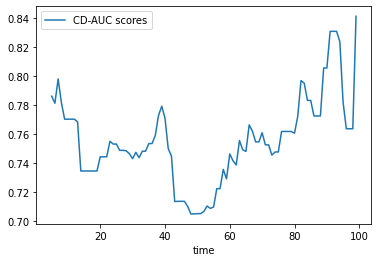

#-------------------------  1  ----------------------#
########################### Grid search
Best parameters set found on development set:

{'coxphsurvivalanalysis__alpha': 3.8000000000000003}

Grid scores on train set:
Mean:  0.7618625912706705
Stdev:  0.009421826657063936

Grid scores on val set:
Mean:  0.6743097213583785
Stdev:  0.035054909337007244

TRAIN: The c-index of Cox using a GridSearchCV is 0.756
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
TEST: The c-index of Cox using a GridSearchCV is 0.693
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
CI-IPCW
(0.6757642066663558, 2111, 936, 0, 9)
CIC
(0.692812602559895, 2111, 936, 0, 9)
CD-AUC
Brier Score
[0.65459209]
(array([0.76513761, 0.75897436, 0.78835063, 0.76414141, 0.7502343 ,
       0.7502343 , 0.7502343 , 0.7502343 , 0.73550725, 0.70263158,
       0.70263158, 0.70263158, 0.70263158, 0.70263158, 0.70263158,
       0.70553752, 0.70553752, 0.70553752,

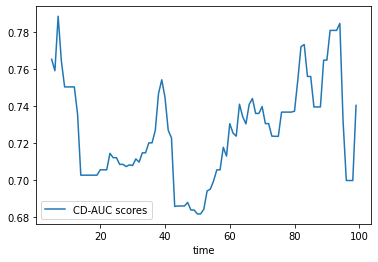

#-------------------------  2  ----------------------#
########################### Grid search
Best parameters set found on development set:

{'coxphsurvivalanalysis__alpha': 3.8000000000000003}

Grid scores on train set:
Mean:  0.7082110608054976
Stdev:  0.012535980394969323

Grid scores on val set:
Mean:  0.6459632988402516
Stdev:  0.03059461408718631

TRAIN: The c-index of Cox using a GridSearchCV is 0.706
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
TEST: The c-index of Cox using a GridSearchCV is 0.761
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
CI-IPCW
(0.7542533776595148, 2318, 728, 1, 9)
CIC
(0.7609123728257302, 2318, 728, 1, 9)
CD-AUC
Brier Score
[1.54844593]
(array([0.84266055, 0.85128205, 0.85986159, 0.85707071, 0.86644799,
       0.86644799, 0.86644799, 0.86644799, 0.86684783, 0.82982456,
       0.82982456, 0.82982456, 0.82982456, 0.82982456, 0.82982456,
       0.79473301, 0.79473301, 0.79473301,

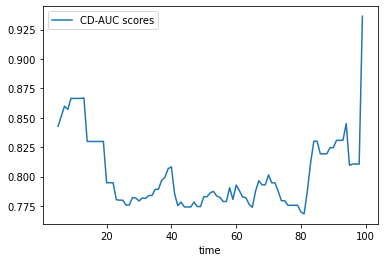

In [71]:
import warnings
#warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')

cv = KFold(n_splits=5, random_state=1, shuffle=True)

param_distributions = {
    'coxphsurvivalanalysis__alpha': reciprocal(0.1, 1000),
    
}

params = {
    'coxphsurvivalanalysis__alpha': np.arange(0, 4, 0.1),
}

get_target = lambda df: (df['duration'].values, df['event'].values)
# y_train = labtrans.fit_transform(*get_target(df_train))
# y_val = labtrans.transform(*get_target(df_val))


model_random_search = RandomizedSearchCV(
    #as_concordance_index_ipcw_scorer(CoxPHSurvivalAnalysis(alpha = 0)),
    cph_optim,
    error_score = 0.5,
    param_distributions=param_distributions,
    return_train_score=True,
    n_iter=1000, cv=cv)

model_grid_search = GridSearchCV(
        #CoxPHSurvivalAnalysis(alpha = 0),
        cph_optim, 
        error_score = 0.5,
        param_grid=params,
        return_train_score=True,
        cv=cv)


for i in range(3):
    print("#------------------------- ", i, " ----------------------#" )
    X_input_train = []
    X_input_test = []
    if (i==0):
        X_input_train = X_train_comp
        X_input_test = X_test_comp
    elif (i==1):
        X_input_train = X_train_select
        X_input_test = X_test_select
    elif (i==2):
        X_input_train = X_train_nomo
        X_input_test = X_test_nomo
        
        
#     print("########################### Random search")
#     model_random_search.fit(X_input_train, y_train)

#     print("Best parameters set found on development set:")
#     print()
#     print(model_random_search.best_params_)
#     print()
#     print("Grid scores on train set:")
#     print("Mean: ", model_random_search.cv_results_['mean_train_score'][model_random_search.best_index_])
#     print("Stdev: ", model_random_search.cv_results_['std_train_score'][model_random_search.best_index_])
#     print()
#     print("Grid scores on validation set:")
#     print("Mean: ", model_random_search.cv_results_['mean_test_score'][model_random_search.best_index_])
#     print("Stdev: ", model_random_search.cv_results_['std_test_score'][model_random_search.best_index_])
#     print()
    
#     print(
#         f"TRAIN: The c-index of Cox using a {model_random_search.__class__.__name__} is "
#         f"{model_random_search.score(X_input_train, y_train):.3f}")
#     print(
#         f"The best set of parameters is: {model_random_search.best_params_}"
#     )

#     print(
#         f"TEST: The c-index of Cox using a {model_random_search.__class__.__name__} is "
#         f"{model_random_search.score(X_input_test, y_test):.3f}")
#     print(
#         f"The best set of parameters is: {model_random_search.best_params_}"
#     )
    
#     preds = model_random_search.best_estimator_.predict(X_input_test)
    
    
    print("########################### Grid search")

    
    model_grid_search.fit(X_input_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(model_grid_search.best_params_)
    print()
    print("Grid scores on train set:")
    print("Mean: ", model_grid_search.cv_results_['mean_train_score'][model_grid_search.best_index_])
    print("Stdev: ", model_grid_search.cv_results_['std_train_score'][model_grid_search.best_index_])
    print()
    print("Grid scores on val set:")
    print("Mean: ", model_grid_search.cv_results_['mean_test_score'][model_grid_search.best_index_])
    print("Stdev: ", model_grid_search.cv_results_['std_test_score'][model_grid_search.best_index_])
    print()

    print(
        f"TRAIN: The c-index of Cox using a {model_grid_search.__class__.__name__} is "
        f"{model_grid_search.score(X_input_train, y_train):.3f}")
    print(
        f"The best set of parameters is: {model_grid_search.best_params_}"
    )

    print(
        f"TEST: The c-index of Cox using a {model_grid_search.__class__.__name__} is "
        f"{model_grid_search.score(X_input_test, y_test):.3f}")
    print(
        f"The best set of parameters is: {model_grid_search.best_params_}"
    )
    
    
    preds = model_grid_search.best_estimator_.predict(X_input_test)
    #print(preds)

    print("CI-IPCW")
    print(
        sksurv.metrics.concordance_index_ipcw(
           y_train,
           y_test,
          preds,
            tau=100 # within 100 days
        )
    )

    print("CIC")
    print(
        sksurv.metrics.concordance_index_censored(
            y_test['event'],
            y_test['time'],
          preds,
        )
    )


    print("CD-AUC")
    auc_scores = sksurv.metrics.cumulative_dynamic_auc(
           y_train,
            y_test,
          preds,
            np.arange(5,100)
        )


    print("Brier Score")

    times, score = sksurv.metrics.brier_score(
    y_train, y_test, preds, y_test['time'].max() - 1
    )
    print(score)


    print(auc_scores)
    auc_df = pd.concat([
        pd.DataFrame(np.arange(5,100)),
        pd.DataFrame(auc_scores[0] )
    ], axis = 1)
    auc_df.columns=['time', 'CD-AUC scores']
    #display(auc_df)
    auc_df.plot('time', 'CD-AUC scores')
    plt.show()
    
    

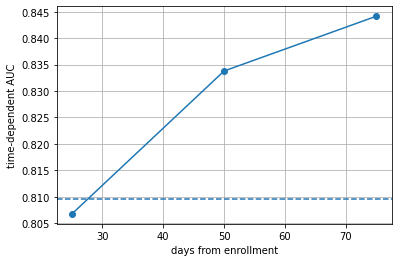

In [110]:
from sksurv.metrics import (
    concordance_index_censored,
    concordance_index_ipcw,
    cumulative_dynamic_auc,
    integrated_brier_score,
)

my_times = np.arange(25,100, 25)
grid_test_scores = model_grid_search.best_estimator_.predict(X_test)
grid_auc, grid_mean_auc = cumulative_dynamic_auc(
    y_train, y_test, grid_test_scores, my_times
)


plt.plot(my_times, grid_auc, marker="o")
plt.axhline(grid_mean_auc, linestyle="--")
plt.xlabel("days from enrollment")
plt.ylabel("time-dependent AUC")
plt.grid(True)

In [86]:
#dir(model_grid_search.best_estimator_)
gcv = model_grid_search

results = pd.DataFrame(gcv.cv_results_).sort_values(by='mean_test_score', ascending=False)
results.loc[:, ~results.columns.str.endswith("_time")]

,param_coxphsurvivalanalysis__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
79,3.9,{'coxphsurvivalanalysis__alpha': 3.9000000000000075},0.666,0.684,0.650,0.632,0.600,0.647,0.029,1
78,3.8,{'coxphsurvivalanalysis__alpha': 3.800000000000007},0.668,0.680,0.650,0.634,0.600,0.647,0.028,2
77,3.7,{'coxphsurvivalanalysis__alpha': 3.7000000000000064},0.668,0.680,0.650,0.632,0.600,0.646,0.028,3
75,3.5,{'coxphsurvivalanalysis__alpha': 3.500000000000007},0.668,0.677,0.650,0.634,0.602,0.646,0.027,4
74,3.4,{'coxphsurvivalanalysis__alpha': 3.4000000000000066},0.670,0.677,0.649,0.634,0.599,0.646,0.028,5
...,...,...,...,...,...,...,...,...,...,...
36,-0.4,{'coxphsurvivalanalysis__alpha': -0.3999999999999968},NaN,NaN,NaN,NaN,NaN,NaN,NaN,63
37,-0.3,{'coxphsurvivalanalysis__alpha': -0.2999999999999967},NaN,NaN,NaN,NaN,NaN,NaN,NaN,42
38,-0.2,{'coxphsurvivalanalysis__alpha': -0.19999999999999662},NaN,NaN,NaN,NaN,NaN,NaN,NaN,60
39,-0.1,{'coxphsurvivalanalysis__alpha': -0.09999999999999654},NaN,NaN,NaN,NaN,NaN,NaN,NaN,80


### feature importance

In [597]:
from eli5.sklearn import PermutationImportance

In [140]:
# # https://colab.research.google.com/github/alonsosilvaallende/Random-Survival-Forest-GBCSG2/blob/master/Cox_PH_and_RSF_colab.ipynb#scrollTo=IjDH0p1dBuyV

# perm = PermutationImportance(
#     cox_best.steps[-1][1], n_iter=100, random_state=42).fit(X_train, y_train)

# data = perm.results_
# data = pd.DataFrame(data, columns=X_train.columns)
# meds = data.median()
# meds = meds.sort_values(ascending=False)
# data = data[meds.index]

# fig, ax = plt.subplots(figsize=(10,7))
# data.boxplot(ax=ax)
# ax.set_title('Feature Importances')
# plt.xticks(rotation=90)
# plt.show()

In [603]:
# import eli5
# display(eli5.show_weights(perm, feature_names = X_train.columns.tolist(), top=100))

Weight,Feature
0.0101 ± 0.0114,ENE
0.0089 ± 0.0100,Tobacco_History_1.0
0.0080 ± 0.0091,Alcohol_History_0.0
0.0052 ± 0.0099,t_recode_n
0.0044 ± 0.0124,n_recode_n
0.0035 ± 0.0088,Tobacco_History_0.0
0.0031 ± 0.0031,RACE_2.0
0.0027 ± 0.0075,PRIMARY_SITE_CONSOLIDATED_Tongue
0.0025 ± 0.0087,CC_SCORE_REGROUPED_1.0
0.0023 ± 0.0065,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth


## Coxnet

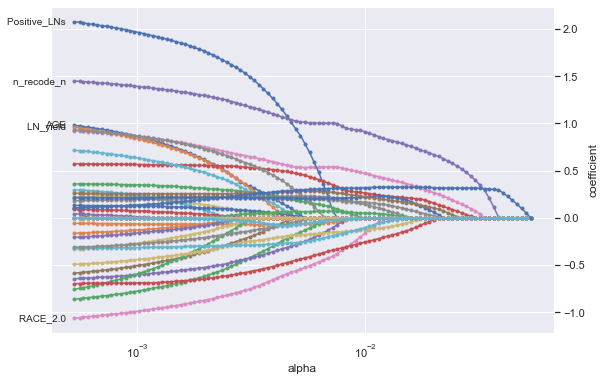

In [557]:
####### coxnet

cox_lasso = CoxnetSurvivalAnalysis(l1_ratio=1.0, alpha_min_ratio=0.01)
cox_lasso.fit(X_train, y_train)

coefficients_lasso = pd.DataFrame(
    cox_lasso.coef_,
    index=X_train.columns,
    columns=np.round(cox_lasso.alphas_, 5)
)

plot_coefficients(coefficients_lasso, n_highlight=5)

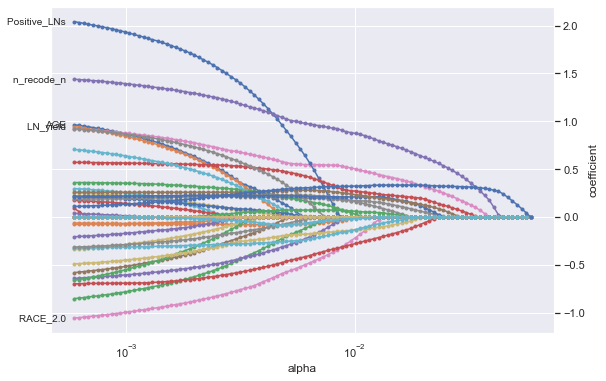

In [558]:
######### elastic net
cox_elastic_net = CoxnetSurvivalAnalysis(l1_ratio=0.9, alpha_min_ratio=0.01)
cox_elastic_net.fit(X_train, y_train)

coefficients_elastic_net = pd.DataFrame(
    cox_elastic_net.coef_,
    index=X_train.columns,
    columns=np.round(cox_elastic_net.alphas_, 5)
)

plot_coefficients(coefficients_elastic_net, n_highlight=5)

In [559]:
###### choosing alpha


import warnings
from sklearn.exceptions import ConvergenceWarning
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

coxnet_pipe = make_pipeline(
    StandardScaler(),
    CoxnetSurvivalAnalysis(l1_ratio=0.9, alpha_min_ratio=0.01, max_iter=100)
)
warnings.simplefilter("ignore", ConvergenceWarning)
coxnet_pipe.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('coxnetsurvivalanalysis',
                 CoxnetSurvivalAnalysis(alpha_min_ratio=0.01, l1_ratio=0.9,
                                        max_iter=100))])

In [560]:
estimated_alphas = coxnet_pipe.named_steps["coxnetsurvivalanalysis"].alphas_
cv = KFold(n_splits=5, shuffle=True, random_state=0)
gcv = GridSearchCV(
    make_pipeline(StandardScaler(), CoxnetSurvivalAnalysis(l1_ratio=0.9, fit_baseline_model=True)),
    param_grid={"coxnetsurvivalanalysis__alphas": [[v] for v in estimated_alphas]},
    cv=cv,
    error_score=0.5,
    n_jobs=4).fit(X_train, y_train)

cv_results = pd.DataFrame(gcv.cv_results_)

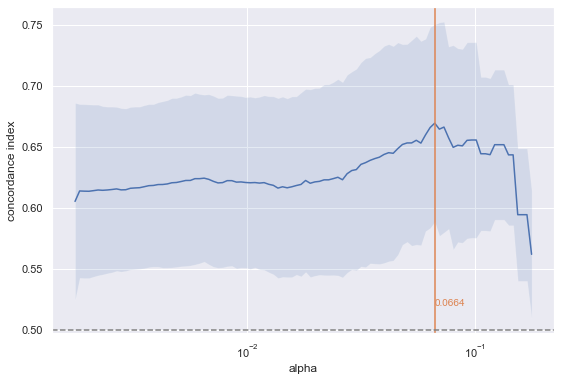

In [561]:
alphas = cv_results.param_coxnetsurvivalanalysis__alphas.map(lambda x: x[0])
mean = cv_results.mean_test_score
std = cv_results.std_test_score

fig, ax = plt.subplots(figsize=(9, 6))
ax.plot(alphas, mean)
ax.fill_between(alphas, mean - std, mean + std, alpha=.15)
ax.set_xscale("log")
ax.set_ylabel("concordance index")
ax.set_xlabel("alpha")
optimal_alpha = gcv.best_params_["coxnetsurvivalanalysis__alphas"][0]
ax.axvline(optimal_alpha, c="C1")
plt.text(optimal_alpha, 0.52, round(optimal_alpha, 4), c= "C1")
ax.axhline(0.5, color="grey", linestyle="--")
ax.grid(True)

In [562]:
gcv.best_params_["coxnetsurvivalanalysis__alphas"][0]
optimal_alpha

0.06636294211298487

Number of non-zero coefficients: 5


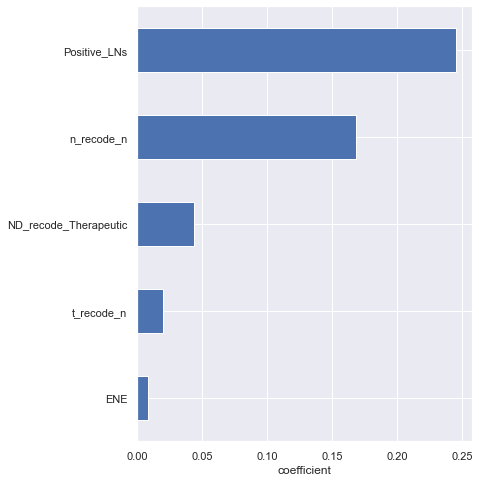

In [563]:
best_model = gcv.best_estimator_.named_steps["coxnetsurvivalanalysis"]
best_coefs = pd.DataFrame(
    best_model.coef_,
    index=X_train.columns,
    columns=["coefficient"]
)

non_zero = np.sum(best_coefs.iloc[:, 0] != 0)
print("Number of non-zero coefficients: {}".format(non_zero))

non_zero_coefs = best_coefs.query("coefficient != 0")
coef_order = non_zero_coefs.abs().sort_values("coefficient").index

_, ax = plt.subplots(figsize=(6, 8))
non_zero_coefs.loc[coef_order].plot.barh(ax=ax, legend=False)
ax.set_xlabel("coefficient")
ax.grid(True)

In [568]:
from sksurv.metrics import brier_score
from sksurv.metrics import integrated_brier_score

In [570]:
best_model

CoxnetSurvivalAnalysis(alphas=[0.06636294211298487], fit_baseline_model=True,
                       l1_ratio=0.9)

In [572]:
y_test

array([(False,  28.), (False,  61.), (False,  41.), ( True,   5.),
       (False,  45.), (False,  42.), ( True,   8.), (False,  70.),
       (False,  58.), (False,  59.), (False,  55.), ( True,   5.),
       ( True,   9.), (False,  83.), (False,  65.), ( True,  20.),
       (False,  50.), (False,  77.), ( True,   4.), (False,  70.),
       (False,  66.), (False,  87.), (False,  80.), (False,  90.),
       (False,  40.), (False,  47.), (False,  27.), ( True,   8.),
       (False,  54.), ( True,   5.), (False,  94.), (False,  55.),
       (False,  37.), (False,  23.), (False,  65.), (False,  55.),
       (False,  39.), ( True,  12.), (False,  70.), (False,  61.),
       ( True,  38.), (False, 101.), ( True,   2.), ( True,   4.),
       (False,  39.), ( True,   6.), (False,  38.), ( True,   8.),
       (False,  41.), (False,  26.), (False,  61.), ( True,  27.),
       (False,  30.), (False,  76.), (False,  46.), (False,  26.),
       (False,  54.), ( True,   6.), ( True,   8.), (False,  6

In [576]:
### test


print("Best test score: ", best_model.score(X_test, y_test))
#print("Best brier: ",  best_model.integrated_brier_score(X_test, y_test))
# best_estim = best_model.fit(X_train, y_train, fit_baseline_model = True)
# survs = best_estim.predict_survival_function(X_test) #
# #print(survs)
# preds = [fn(1) for fn in survs]
# print(preds)
# y_actual = pd.DataFrame(y_test)['event'].astype('int')
# brier_score_loss(y_actual, preds)


best_model.fit(X_train, y_train)
cph_surv_prob = np.row_stack([
    fn(times)
    for fn in best_model.predict_survival_function(X_test)
])


print(cph_surv_prob)
cph_brier_test = integrated_brier_score(y_train, y_test, cph_surv_prob, times)
print("Test brier, cph:", cph_brier_test)

cph_surv_prob = np.row_stack([
    fn(times)
    for fn in best_model.predict_survival_function(X_train)
])
cph_brier_train = integrated_brier_score(y_train, y_train, cph_surv_prob, times)
print("Train brier, cph:", cph_brier_train)

Best test score:  0.5
[[0.89683772 0.89052199 0.85938808 ... 0.73948939 0.73948939 0.73948939]
 [0.89683772 0.89052199 0.85938808 ... 0.73948939 0.73948939 0.73948939]
 [0.89683772 0.89052199 0.85938808 ... 0.73948939 0.73948939 0.73948939]
 ...
 [0.89683772 0.89052199 0.85938808 ... 0.73948939 0.73948939 0.73948939]
 [0.89683772 0.89052199 0.85938808 ... 0.73948939 0.73948939 0.73948939]
 [0.89683772 0.89052199 0.85938808 ... 0.73948939 0.73948939 0.73948939]]
Test brier, cph: 0.19630424496173113
Train brier, cph: 0.1808440278489956


<ipython-input-576-8373a3b7117f>:15: UserWarning: all coefficients are zero, consider decreasing alpha.
  best_model.fit(X_train, y_train)


In [566]:
lower, upper = np.percentile(y_format_2["time"], [10, 90])
times = np.arange(lower, upper + 1)
times

array([ 6.,  7.,  8.,  9., 10., 11., 12., 13., 14., 15., 16., 17., 18.,
       19., 20., 21., 22., 23., 24., 25., 26., 27., 28., 29., 30., 31.,
       32., 33., 34., 35., 36., 37., 38., 39., 40., 41., 42., 43., 44.,
       45., 46., 47., 48., 49., 50., 51., 52., 53., 54., 55., 56., 57.,
       58., 59., 60., 61., 62., 63., 64., 65., 66., 67., 68., 69., 70.,
       71., 72., 73., 74., 75., 76., 77., 78., 79., 80., 81., 82., 83.,
       84.])

In [565]:
#y_format_2

In [421]:
#### survival/ umulative hazard funciton
coxnet_pred = make_pipeline(
    StandardScaler(),
    CoxnetSurvivalAnalysis(l1_ratio=0.9, fit_baseline_model=True)
)
coxnet_pred.set_params(**gcv.best_params_)
coxnet_pred.fit(X_train, y_train)

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('coxnetsurvivalanalysis',
                 CoxnetSurvivalAnalysis(alphas=[0.06636294211298487],
                                        fit_baseline_model=True,
                                        l1_ratio=0.9))])

In [126]:
pd.DataFrame(y_train)
y_train


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,event,time
0,0.394,0.0,0.286,0.050,1.0,0.0,0.0,0.0,0.0,0.0,0.211,0.321,0.5,0.333,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,False,67.0
1,0.648,0.0,0.857,0.059,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,False,34.0
2,0.592,1.0,0.571,0.108,1.0,0.0,0.0,0.0,0.0,0.0,0.000,0.170,0.0,1.000,0.000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,False,53.0
3,0.493,1.0,0.000,0.056,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.045,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,True,4.0
4,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,False,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,0.718,0.0,0.286,0.045,0.0,0.0,0.0,1.0,1.0,0.0,0.000,0.116,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,False,49.0
272,0.493,1.0,0.714,0.176,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.143,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,True,2.0
273,0.479,0.0,0.143,0.025,1.0,0.0,0.0,1.0,0.0,0.0,0.000,0.438,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,False,95.0
274,0.507,0.0,0.857,0.090,1.0,1.0,0.0,0.0,0.0,0.0,0.053,1.000,0.5,0.000,0.333,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,False,30.0


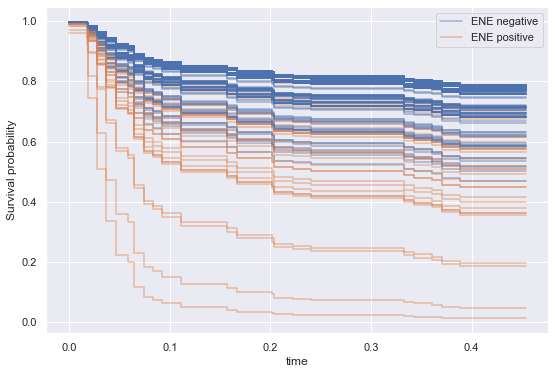

In [427]:
###### surv_fns = coxnet_pred.predict_survival_function(X_train)

time_points = np.quantile(pd.DataFrame(y_train)["time"], np.linspace(0, 0.6, 100))
legend_handles = []
legend_labels = []
_, ax = plt.subplots(figsize=(9, 6))
for fn, label in zip(surv_fns, X_train.loc[:, "ENE"].astype(int)):
    line, = ax.step(time_points, fn(time_points), where="post",
                   color="C{:d}".format(label), alpha=0.5)
    if len(legend_handles) <= label:
        name = "ENE positive" if label == 1 else "ENE negative"
        legend_labels.append(name)
        legend_handles.append(line)

ax.legend(legend_handles, legend_labels)
ax.set_xlabel("time")
ax.set_ylabel("Survival probability")
ax.grid(True)

In [138]:
# display(pd.DataFrame(results).T)
# pd.DataFrame(results).T.melt(id_vars = 'covariate')

In [276]:
cph.check_assumptions(X_hazard)

Proportional hazard assumption looks okay.


/Users/alexandrabourdillon/miniconda3/lib/python3.9/site-packages/lifelines/fitters/mixins.py:108: FutureWarning: Index.__and__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__and__.  Use index.intersection(other) instead
  for variable in self.params_.index & (columns or self.params_.index):


[]

In [225]:
#X_hazard["recurr_code"==1]

In [136]:
# ### median time to event timeline:

# kmf = KaplanMeierFitter() 

# kmf.fit(durations =  X_hazard["recurr_time_final"], event_observed = X_hazard["recurr_code"])
# display(kmf.event_table)
# display(kmf.survival_function_)

# CTE = kmf.conditional_time_to_event_
# display(CTE)
# plt.plot(CTE)

In [137]:
# coxph.check_assumptions(df)

# 3.0 DeepSurv

In [87]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn_pandas import DataFrameMapper

import torch
import torchtuples as tt

from pycox.datasets import metabric
from pycox.models import CoxPH
from pycox.evaluation import EvalSurv

In [117]:
X_hazard.columns.values
full_train_comp.dtypes
y_train_ds
y_test[1]

(False, 42.)

In [133]:
pd.DataFrame(y_train)
display(full_train)
get_target(full_train.iloc[train_idx])
#train_idx

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,event,time
0,0.394,0.0,0.286,0.050,1.0,0.0,0.0,0.0,0.0,0.0,0.211,0.321,0.5,0.333,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,False,67.0
1,0.648,0.0,0.857,0.059,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,False,34.0
2,0.592,1.0,0.571,0.108,1.0,0.0,0.0,0.0,0.0,0.0,0.000,0.170,0.0,1.000,0.000,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,False,53.0
3,0.493,1.0,0.000,0.056,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.045,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,True,4.0
4,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,False,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,0.718,0.0,0.286,0.045,0.0,0.0,0.0,1.0,1.0,0.0,0.000,0.116,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,False,49.0
272,0.493,1.0,0.714,0.176,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.143,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,True,2.0
273,0.479,0.0,0.143,0.025,1.0,0.0,0.0,1.0,0.0,0.0,0.000,0.438,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,False,95.0
274,0.507,0.0,0.857,0.090,1.0,1.0,0.0,0.0,0.0,0.0,0.053,1.000,0.5,0.000,0.333,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,False,30.0


(array([ 67.,  34.,  53.,   4.,  25.,  41.,  55.,  28.,   8.,   4.,  29.,
         50.,  22.,  87.,  60.,  55.,  44.,  41.,  32.,  28.,  74.,   5.,
         35.,  34.,  60.,  33.,  59.,  32.,  51.,  99.,  56., 109.,  61.,
         46.,  95.,  91.,  60.,  31.,   9.,  63.,  31.,  70.,  55.,  92.,
         94.,  18.,   8.,  50.,  38.,   9.,  42.,  54.,  42.,  67.,  22.,
         90.,  37.,  94.,  46.,  50.,  19.,  54.,   8.,  38.,  71.,  70.,
         69.,  31.,  25.,  28.,  45.,  55.,  54.,  42.,  49.,   4.,  65.,
          8.,  77.,  68.,   2.,  42.,  82.,  48.,  26.,  45.,  40.,  55.,
         64.,  48.,   6.,  43.,  20.,  93.,  55.,  12.,  68.,  23.,  77.,
         28.,  69.,  94.,  30.,  58.,  37.,   1.,  66.,  23.,   6.,  40.,
         24.,  28.,  59.,  76.,  87.,  49.,   8.,  65.,  37.,   8.,  19.,
         50.,  62.,  67.,  56.,  41.,  39.,  72.,  63.,  64.,   8.,  27.,
          8.,  65.,   5.,   4.,  53.,  45.,  43.,  30.,  50.,  46.,  11.,
          8.,  34.,  32.,  18.,   3., 

#-------------------------  0  ----------------------#
(276, 41)
#------- val -------#
X_train_cv:  (220, 41)
y_train_cv:  2
X_val_cv:  (56, 41)
y_val_cv:  2


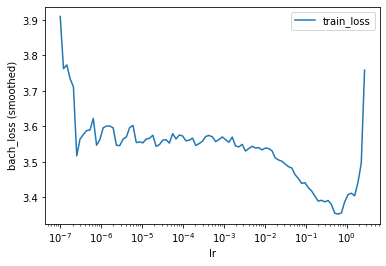

Best lr:  0.0613590727341321
0:	[0s / 0s],		train_loss: 3.5306,	val_loss: 2.9908
1:	[0s / 0s],		train_loss: 3.2244,	val_loss: 2.9017
2:	[0s / 0s],		train_loss: 3.1570,	val_loss: 2.8444
3:	[0s / 0s],		train_loss: 3.0386,	val_loss: 2.8348
4:	[0s / 0s],		train_loss: 2.8592,	val_loss: 2.8803
5:	[0s / 0s],		train_loss: 2.7687,	val_loss: 3.0169
6:	[0s / 0s],		train_loss: 2.6970,	val_loss: 3.2070
7:	[0s / 0s],		train_loss: 2.6020,	val_loss: 3.4555
8:	[0s / 0s],		train_loss: 2.5005,	val_loss: 3.5799
9:	[0s / 0s],		train_loss: 2.4081,	val_loss: 3.6140
10:	[0s / 0s],		train_loss: 2.5428,	val_loss: 3.7651
11:	[0s / 0s],		train_loss: 2.2468,	val_loss: 3.9796
12:	[0s / 0s],		train_loss: 2.3699,	val_loss: 3.9972
13:	[0s / 0s],		train_loss: 2.1333,	val_loss: 4.0660


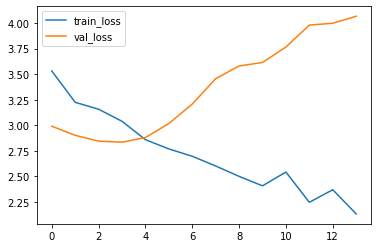

Val PLL mean:  -3.6395369
CI:  0.6761691223574632


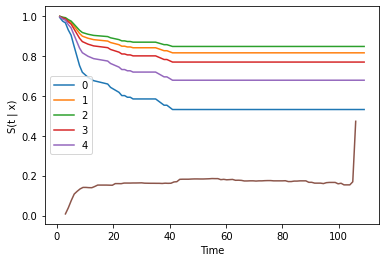

Brier score:  0.16475262854934913
NBLL score:  0.5023035616932705
#------- val -------#
X_train_cv:  (221, 41)
y_train_cv:  2
X_val_cv:  (55, 41)
y_val_cv:  2


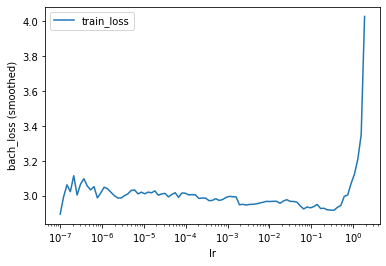

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 3.0107,	val_loss: 2.8722
1:	[0s / 0s],		train_loss: 2.9294,	val_loss: 2.9789
2:	[0s / 0s],		train_loss: 2.7817,	val_loss: 3.0590
3:	[0s / 0s],		train_loss: 2.8346,	val_loss: 3.1370
4:	[0s / 0s],		train_loss: 2.6570,	val_loss: 3.1808
5:	[0s / 0s],		train_loss: 2.6154,	val_loss: 3.1923
6:	[0s / 0s],		train_loss: 2.6057,	val_loss: 3.2029
7:	[0s / 0s],		train_loss: 2.5019,	val_loss: 3.2217
8:	[0s / 0s],		train_loss: 2.4691,	val_loss: 3.2119
9:	[0s / 0s],		train_loss: 2.4152,	val_loss: 3.2105
10:	[0s / 0s],		train_loss: 2.3887,	val_loss: 3.2165


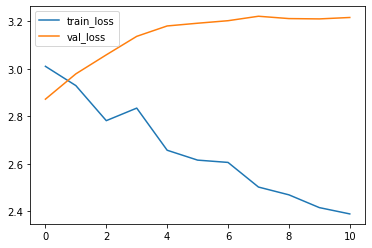

Val PLL mean:  -3.5309656
CI:  0.6713645099295323


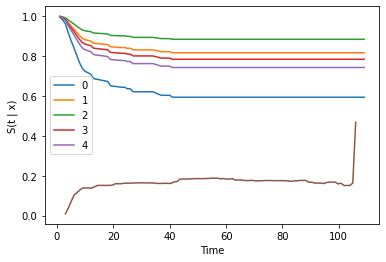

Brier score:  0.16529702112375702
NBLL score:  0.5055537593904568
#------- val -------#
X_train_cv:  (221, 41)
y_train_cv:  2
X_val_cv:  (55, 41)
y_val_cv:  2


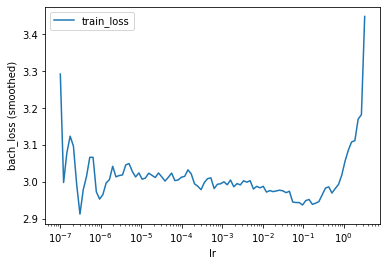

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 3.0989,	val_loss: 2.5522
1:	[0s / 0s],		train_loss: 2.9952,	val_loss: 2.5234
2:	[0s / 0s],		train_loss: 2.8848,	val_loss: 2.5662
3:	[0s / 0s],		train_loss: 2.7813,	val_loss: 2.6611
4:	[0s / 0s],		train_loss: 2.7029,	val_loss: 2.7503
5:	[0s / 0s],		train_loss: 2.8204,	val_loss: 2.7465
6:	[0s / 0s],		train_loss: 2.6672,	val_loss: 2.7431
7:	[0s / 0s],		train_loss: 2.4402,	val_loss: 2.7643
8:	[0s / 0s],		train_loss: 2.6287,	val_loss: 2.8371
9:	[0s / 0s],		train_loss: 2.5321,	val_loss: 2.8389
10:	[0s / 0s],		train_loss: 2.5461,	val_loss: 2.9172
11:	[0s / 0s],		train_loss: 2.4426,	val_loss: 2.9853


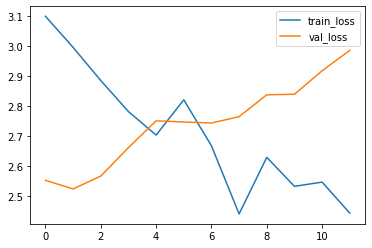

Val PLL mean:  -3.2705693
CI:  0.6931454196028187


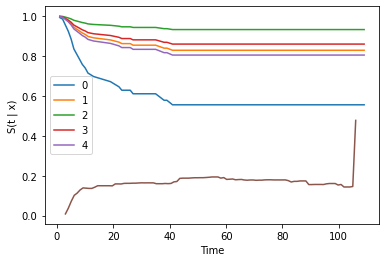

Brier score:  0.16492650530401784
NBLL score:  0.5045900741118264
#------- val -------#
X_train_cv:  (221, 41)
y_train_cv:  2
X_val_cv:  (55, 41)
y_val_cv:  2


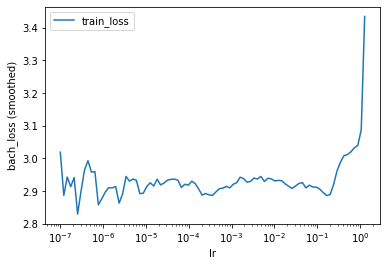

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 2.9886,	val_loss: 2.6206
1:	[0s / 0s],		train_loss: 2.8758,	val_loss: 2.7267
2:	[0s / 0s],		train_loss: 2.6343,	val_loss: 2.7095
3:	[0s / 0s],		train_loss: 2.7097,	val_loss: 2.6621
4:	[0s / 0s],		train_loss: 2.7505,	val_loss: 2.5654
5:	[0s / 0s],		train_loss: 2.5496,	val_loss: 2.5912
6:	[0s / 0s],		train_loss: 2.6733,	val_loss: 2.7271
7:	[0s / 0s],		train_loss: 2.5619,	val_loss: 2.7898
8:	[0s / 0s],		train_loss: 2.5047,	val_loss: 2.9703
9:	[0s / 0s],		train_loss: 2.4768,	val_loss: 3.0855
10:	[0s / 0s],		train_loss: 2.3570,	val_loss: 3.0475
11:	[0s / 0s],		train_loss: 2.4161,	val_loss: 3.0114
12:	[0s / 0s],		train_loss: 2.5340,	val_loss: 3.0962
13:	[0s / 0s],		train_loss: 2.2651,	val_loss: 3.0988
14:	[0s / 0s],		train_loss: 2.2784,	val_loss: 3.1550


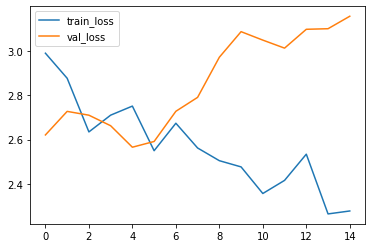

Val PLL mean:  -3.3090937
CI:  0.6771300448430493


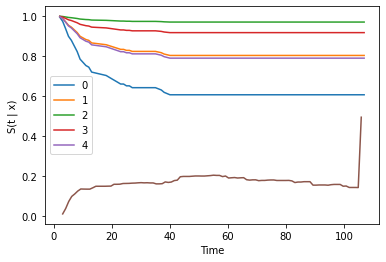

Brier score:  0.16602333163167035
NBLL score:  0.5101787854905039
#------- val -------#
X_train_cv:  (221, 41)
y_train_cv:  2
X_val_cv:  (55, 41)
y_val_cv:  2


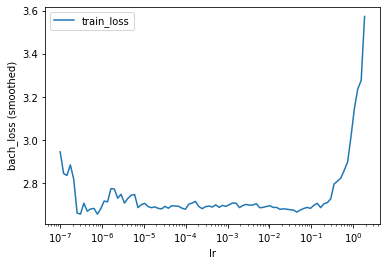

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 2.7828,	val_loss: 1.7006
1:	[0s / 0s],		train_loss: 2.7132,	val_loss: 1.8379
2:	[0s / 0s],		train_loss: 2.4762,	val_loss: 1.9290
3:	[0s / 0s],		train_loss: 2.5342,	val_loss: 2.0489
4:	[0s / 0s],		train_loss: 2.4121,	val_loss: 2.0207
5:	[0s / 0s],		train_loss: 2.4971,	val_loss: 1.8184
6:	[0s / 0s],		train_loss: 2.3275,	val_loss: 1.6490
7:	[0s / 0s],		train_loss: 2.2841,	val_loss: 1.6333
8:	[0s / 0s],		train_loss: 2.3245,	val_loss: 1.5557
9:	[0s / 0s],		train_loss: 2.3521,	val_loss: 1.5645
10:	[0s / 0s],		train_loss: 2.2174,	val_loss: 1.5202
11:	[0s / 0s],		train_loss: 2.0402,	val_loss: 1.5740
12:	[0s / 0s],		train_loss: 2.1998,	val_loss: 1.6600
13:	[0s / 0s],		train_loss: 2.1065,	val_loss: 1.9033
14:	[0s / 0s],		train_loss: 2.1913,	val_loss: 2.4450
15:	[0s / 0s],		train_loss: 2.1937,	val_loss: 2.8163
16:	[0s / 0s],		train_loss: 2.2740,	val_loss: 2.5096
17:	[0s / 0s],		train_loss: 2.1447,	val_loss: 2.5752
18:	[0s / 0s],		train_loss: 2.0339,	val

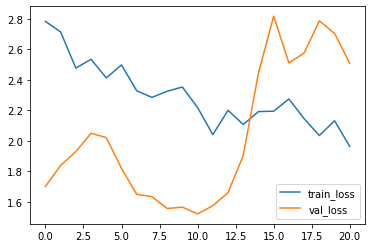

Val PLL mean:  -4.0517664
CI:  0.6627162075592569


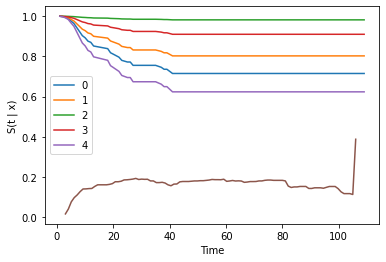

Brier score:  0.16385473671632908
NBLL score:  0.5394125124325445
#-------------------------  1  ----------------------#
(276, 22)
#------- val -------#
X_train_cv:  (220, 22)
y_train_cv:  2
X_val_cv:  (56, 22)
y_val_cv:  2


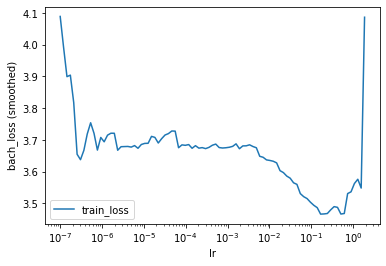

Best lr:  0.016681005372000682
0:	[0s / 0s],		train_loss: 3.5405,	val_loss: 2.9336
1:	[0s / 0s],		train_loss: 3.2741,	val_loss: 2.9132
2:	[0s / 0s],		train_loss: 3.1406,	val_loss: 2.9328
3:	[0s / 0s],		train_loss: 3.1177,	val_loss: 2.9298
4:	[0s / 0s],		train_loss: 2.9875,	val_loss: 2.9521
5:	[0s / 0s],		train_loss: 2.9582,	val_loss: 2.9749
6:	[0s / 0s],		train_loss: 2.7979,	val_loss: 2.9906
7:	[0s / 0s],		train_loss: 2.9709,	val_loss: 3.0374
8:	[0s / 0s],		train_loss: 2.8718,	val_loss: 3.0595
9:	[0s / 0s],		train_loss: 2.8995,	val_loss: 3.1484
10:	[0s / 0s],		train_loss: 2.8128,	val_loss: 3.2411
11:	[0s / 0s],		train_loss: 2.6704,	val_loss: 3.2694


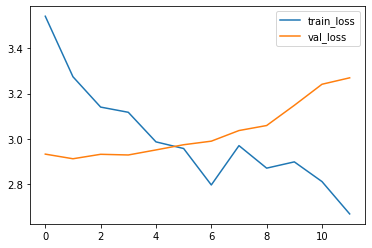

Val PLL mean:  -3.7252061
CI:  0.6265214606021781


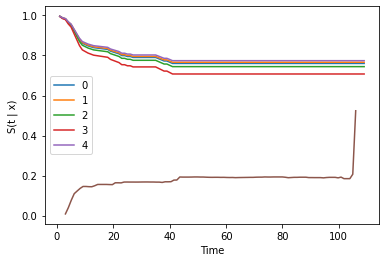

Brier score:  0.17731186426463919
NBLL score:  0.5360127468892305
#------- val -------#
X_train_cv:  (221, 22)
y_train_cv:  2
X_val_cv:  (55, 22)
y_val_cv:  2


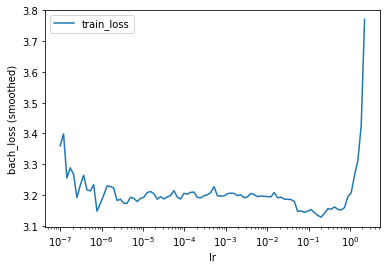

Best lr:  0.020092330025650584
0:	[0s / 0s],		train_loss: 3.2317,	val_loss: 2.9653
1:	[0s / 0s],		train_loss: 3.1794,	val_loss: 2.9604
2:	[0s / 0s],		train_loss: 2.9796,	val_loss: 2.9749
3:	[0s / 0s],		train_loss: 2.9549,	val_loss: 3.0158
4:	[0s / 0s],		train_loss: 2.7889,	val_loss: 3.1073
5:	[0s / 0s],		train_loss: 2.8383,	val_loss: 3.1987
6:	[0s / 0s],		train_loss: 2.8182,	val_loss: 3.2059
7:	[0s / 0s],		train_loss: 2.7892,	val_loss: 3.2482
8:	[0s / 0s],		train_loss: 2.7821,	val_loss: 3.2814
9:	[0s / 0s],		train_loss: 2.7606,	val_loss: 3.3537
10:	[0s / 0s],		train_loss: 2.8257,	val_loss: 3.4195
11:	[0s / 0s],		train_loss: 2.6352,	val_loss: 3.6673


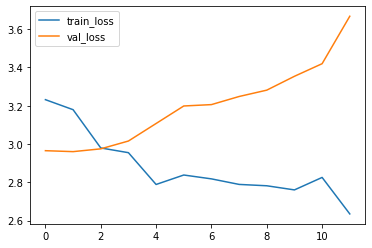

Val PLL mean:  -3.6744928
CI:  0.66944266495836


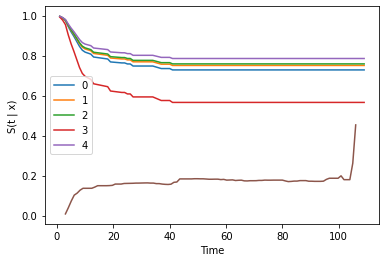

Brier score:  0.16755602739255085
NBLL score:  0.511765604273475
#------- val -------#
X_train_cv:  (221, 22)
y_train_cv:  2
X_val_cv:  (55, 22)
y_val_cv:  2


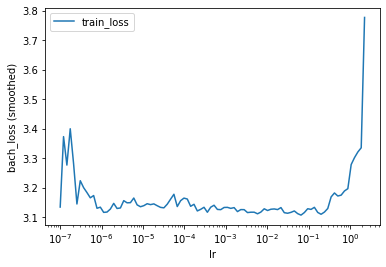

Best lr:  0.006579332246575716
0:	[0s / 0s],		train_loss: 3.2232,	val_loss: 2.5933
1:	[0s / 0s],		train_loss: 3.0318,	val_loss: 2.6057
2:	[0s / 0s],		train_loss: 2.9178,	val_loss: 2.6482
3:	[0s / 0s],		train_loss: 2.9912,	val_loss: 2.6812
4:	[0s / 0s],		train_loss: 2.9480,	val_loss: 2.7264
5:	[0s / 0s],		train_loss: 2.8799,	val_loss: 2.7476
6:	[0s / 0s],		train_loss: 2.8879,	val_loss: 2.7713
7:	[0s / 0s],		train_loss: 2.7863,	val_loss: 2.7789
8:	[0s / 0s],		train_loss: 2.8651,	val_loss: 2.7636
9:	[0s / 0s],		train_loss: 2.7668,	val_loss: 2.7693
10:	[0s / 0s],		train_loss: 2.7057,	val_loss: 2.8337


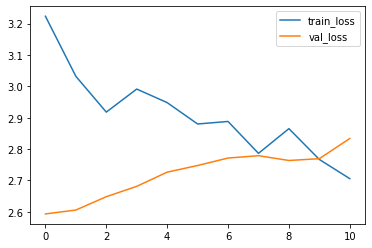

Val PLL mean:  -3.3864412
CI:  0.6860986547085202


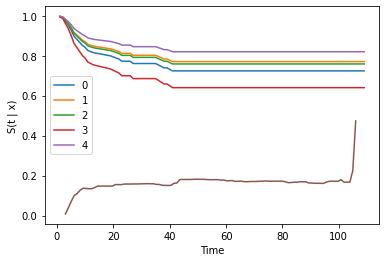

Brier score:  0.16257094282032236
NBLL score:  0.49996815020987856
#------- val -------#
X_train_cv:  (221, 22)
y_train_cv:  2
X_val_cv:  (55, 22)
y_val_cv:  2


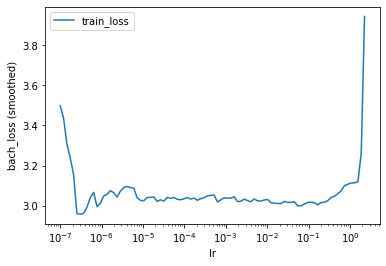

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 3.1178,	val_loss: 2.7220
1:	[0s / 0s],		train_loss: 3.0108,	val_loss: 2.9001
2:	[0s / 0s],		train_loss: 2.9188,	val_loss: 2.9947
3:	[0s / 0s],		train_loss: 2.8433,	val_loss: 3.1282
4:	[0s / 0s],		train_loss: 2.9639,	val_loss: 3.2091
5:	[0s / 0s],		train_loss: 2.8919,	val_loss: 3.2211
6:	[0s / 0s],		train_loss: 2.9322,	val_loss: 3.2530
7:	[0s / 0s],		train_loss: 2.8403,	val_loss: 3.3217
8:	[0s / 0s],		train_loss: 2.8323,	val_loss: 3.2913
9:	[0s / 0s],		train_loss: 2.6898,	val_loss: 3.4516
10:	[0s / 0s],		train_loss: 2.8203,	val_loss: 3.5276


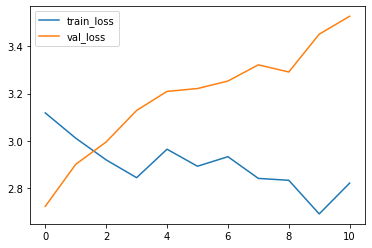

Val PLL mean:  -3.492406
CI:  0.6784112748238309


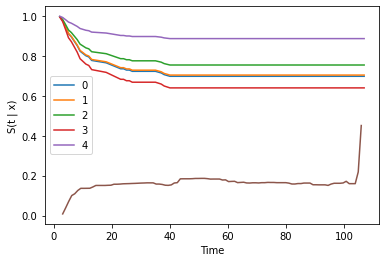

Brier score:  0.16066683857728095
NBLL score:  0.4972375375062029
#------- val -------#
X_train_cv:  (221, 22)
y_train_cv:  2
X_val_cv:  (55, 22)
y_val_cv:  2


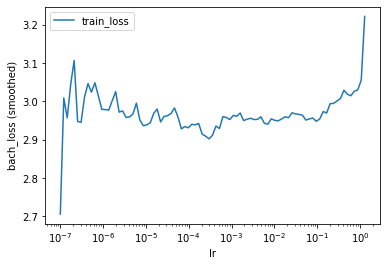

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 2.9421,	val_loss: 2.6941
1:	[0s / 0s],		train_loss: 2.9405,	val_loss: 2.7795
2:	[0s / 0s],		train_loss: 2.8258,	val_loss: 2.9584
3:	[0s / 0s],		train_loss: 2.8219,	val_loss: 3.0974
4:	[0s / 0s],		train_loss: 2.7571,	val_loss: 3.0960
5:	[0s / 0s],		train_loss: 2.7349,	val_loss: 3.0340
6:	[0s / 0s],		train_loss: 2.7893,	val_loss: 3.0321
7:	[0s / 0s],		train_loss: 2.5844,	val_loss: 3.1548
8:	[0s / 0s],		train_loss: 2.7736,	val_loss: 3.1717
9:	[0s / 0s],		train_loss: 2.6676,	val_loss: 3.2669
10:	[0s / 0s],		train_loss: 2.6949,	val_loss: 3.3588


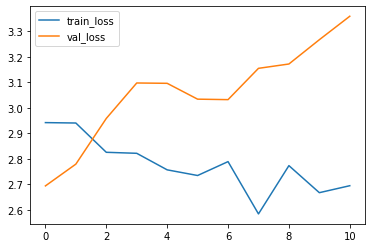

Val PLL mean:  -3.791022
CI:  0.696668802049968


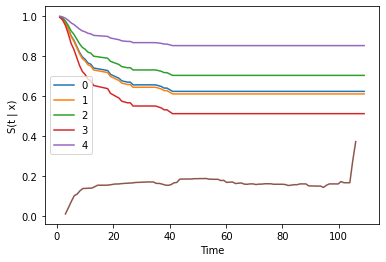

Brier score:  0.15960226780444112
NBLL score:  0.48871675823528077
#-------------------------  2  ----------------------#
(276, 13)
#------- val -------#
X_train_cv:  (220, 13)
y_train_cv:  2
X_val_cv:  (56, 13)
y_val_cv:  2


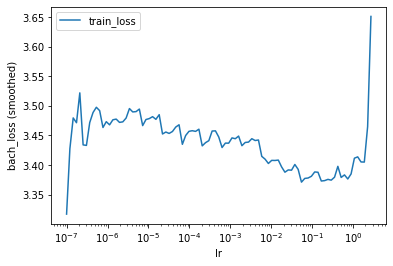

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 3.4549,	val_loss: 3.0460
1:	[0s / 0s],		train_loss: 3.3381,	val_loss: 3.0114
2:	[0s / 0s],		train_loss: 3.3129,	val_loss: 3.0032
3:	[0s / 0s],		train_loss: 3.1898,	val_loss: 2.9911
4:	[0s / 0s],		train_loss: 3.2156,	val_loss: 2.9755
5:	[0s / 0s],		train_loss: 3.2172,	val_loss: 2.9534
6:	[0s / 0s],		train_loss: 3.1520,	val_loss: 2.9360
7:	[0s / 0s],		train_loss: 3.1388,	val_loss: 2.9566
8:	[0s / 0s],		train_loss: 3.1568,	val_loss: 2.9480
9:	[0s / 0s],		train_loss: 3.1486,	val_loss: 2.9277
10:	[0s / 0s],		train_loss: 3.1447,	val_loss: 2.9175
11:	[0s / 0s],		train_loss: 3.1439,	val_loss: 2.9598
12:	[0s / 0s],		train_loss: 3.1690,	val_loss: 3.0023
13:	[0s / 0s],		train_loss: 3.1593,	val_loss: 2.9828
14:	[0s / 0s],		train_loss: 3.1485,	val_loss: 2.9796
15:	[0s / 0s],		train_loss: 2.9862,	val_loss: 2.9876
16:	[0s / 0s],		train_loss: 3.0403,	val_loss: 3.0223
17:	[0s / 0s],		train_loss: 3.0099,	val_loss: 3.0409
18:	[0s / 0s],		train_loss: 3.0274,	val

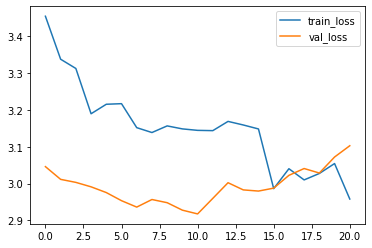

Val PLL mean:  -3.7483585
CI:  0.7506406149903908


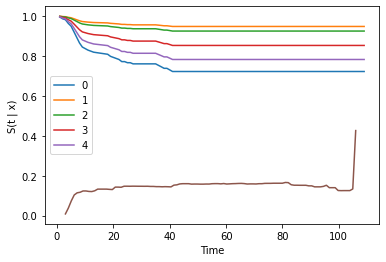

Brier score:  0.14609227350580975
NBLL score:  0.4614456942394782
#------- val -------#
X_train_cv:  (221, 13)
y_train_cv:  2
X_val_cv:  (55, 13)
y_val_cv:  2


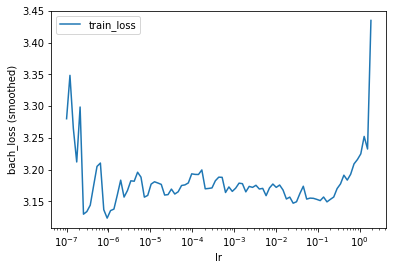

Best lr:  0.0001
0:	[0s / 0s],		train_loss: 3.2406,	val_loss: 2.8351
1:	[0s / 0s],		train_loss: 3.0731,	val_loss: 2.9668
2:	[0s / 0s],		train_loss: 3.1037,	val_loss: 2.9977
3:	[0s / 0s],		train_loss: 3.1831,	val_loss: 2.9547
4:	[0s / 0s],		train_loss: 3.1862,	val_loss: 2.8965
5:	[0s / 0s],		train_loss: 3.0116,	val_loss: 2.8990
6:	[0s / 0s],		train_loss: 3.0466,	val_loss: 2.8922
7:	[0s / 0s],		train_loss: 3.1379,	val_loss: 2.9345
8:	[0s / 0s],		train_loss: 3.0194,	val_loss: 2.9729
9:	[0s / 0s],		train_loss: 3.0685,	val_loss: 2.9553
10:	[0s / 0s],		train_loss: 3.0027,	val_loss: 2.9214


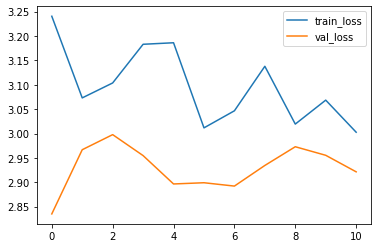

Val PLL mean:  -3.513534
CI:  0.7564061499039078


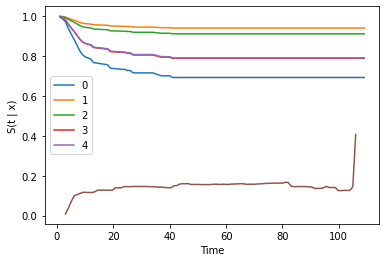

Brier score:  0.14361760752444974
NBLL score:  0.45592350931404774
#------- val -------#
X_train_cv:  (221, 13)
y_train_cv:  2
X_val_cv:  (55, 13)
y_val_cv:  2


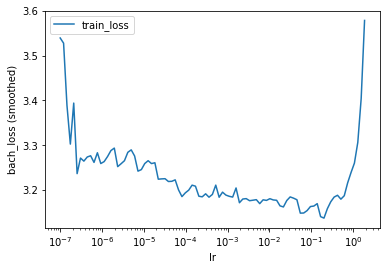

Best lr:  0.020092330025650584
0:	[0s / 0s],		train_loss: 3.2152,	val_loss: 2.7286
1:	[0s / 0s],		train_loss: 3.0949,	val_loss: 2.7838
2:	[0s / 0s],		train_loss: 3.0454,	val_loss: 2.8301
3:	[0s / 0s],		train_loss: 3.0481,	val_loss: 2.9025
4:	[0s / 0s],		train_loss: 2.9848,	val_loss: 2.9381
5:	[0s / 0s],		train_loss: 2.9887,	val_loss: 2.9532
6:	[0s / 0s],		train_loss: 3.1658,	val_loss: 3.0057
7:	[0s / 0s],		train_loss: 2.9401,	val_loss: 3.0293
8:	[0s / 0s],		train_loss: 3.0240,	val_loss: 3.0464
9:	[0s / 0s],		train_loss: 2.9969,	val_loss: 3.0958
10:	[0s / 0s],		train_loss: 2.9364,	val_loss: 3.1414


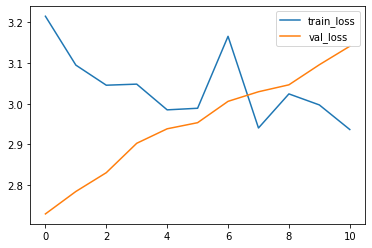

Val PLL mean:  -3.5018406
CI:  0.7535233824471492


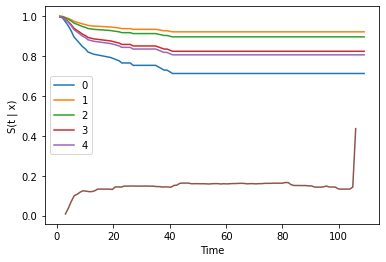

Brier score:  0.14683650675900614
NBLL score:  0.4633911537436438
#------- val -------#
X_train_cv:  (221, 13)
y_train_cv:  2
X_val_cv:  (55, 13)
y_val_cv:  2


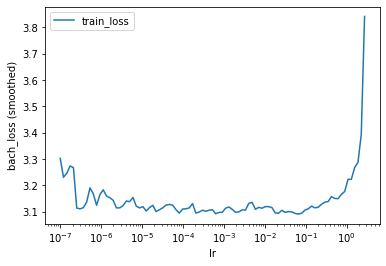

Best lr:  0.006579332246575716
0:	[0s / 0s],		train_loss: 3.2029,	val_loss: 2.7618
1:	[0s / 0s],		train_loss: 3.0145,	val_loss: 2.8485
2:	[0s / 0s],		train_loss: 3.0939,	val_loss: 2.8908
3:	[0s / 0s],		train_loss: 3.0017,	val_loss: 2.9320
4:	[0s / 0s],		train_loss: 3.0022,	val_loss: 2.9798
5:	[0s / 0s],		train_loss: 2.9763,	val_loss: 3.0171
6:	[0s / 0s],		train_loss: 2.9061,	val_loss: 3.0942
7:	[0s / 0s],		train_loss: 2.9384,	val_loss: 3.1647
8:	[0s / 0s],		train_loss: 3.1067,	val_loss: 3.1208
9:	[0s / 0s],		train_loss: 2.8922,	val_loss: 3.1647
10:	[0s / 0s],		train_loss: 2.7914,	val_loss: 3.2194


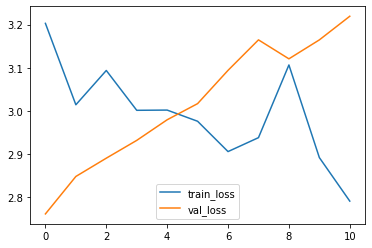

Val PLL mean:  -3.5810318
CI:  0.7448750800768738


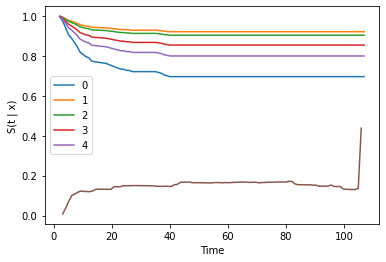

Brier score:  0.14982805648506994
NBLL score:  0.4765875585941725
#------- val -------#
X_train_cv:  (221, 13)
y_train_cv:  2
X_val_cv:  (55, 13)
y_val_cv:  2


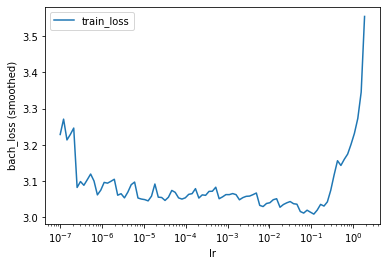

Best lr:  0.01149756995397742
0:	[0s / 0s],		train_loss: 3.0598,	val_loss: 2.7477
1:	[0s / 0s],		train_loss: 3.0825,	val_loss: 2.7470
2:	[0s / 0s],		train_loss: 2.9977,	val_loss: 2.7291
3:	[0s / 0s],		train_loss: 2.9671,	val_loss: 2.7562
4:	[0s / 0s],		train_loss: 3.0402,	val_loss: 2.8096
5:	[0s / 0s],		train_loss: 3.0273,	val_loss: 2.8050
6:	[0s / 0s],		train_loss: 2.9421,	val_loss: 2.7848
7:	[0s / 0s],		train_loss: 3.0157,	val_loss: 2.7632
8:	[0s / 0s],		train_loss: 2.9747,	val_loss: 2.7658
9:	[0s / 0s],		train_loss: 2.9853,	val_loss: 2.7355
10:	[0s / 0s],		train_loss: 2.9530,	val_loss: 2.7293
11:	[0s / 0s],		train_loss: 2.9731,	val_loss: 2.7311
12:	[0s / 0s],		train_loss: 2.9774,	val_loss: 2.7489


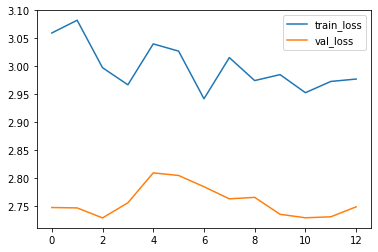

Val PLL mean:  -3.752251
CI:  0.7432735426008968


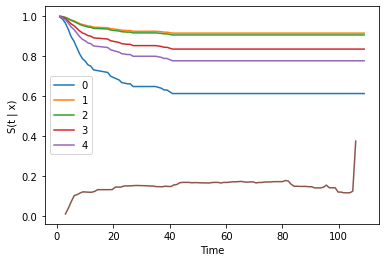

Brier score:  0.14808805965649272
NBLL score:  0.4787560873668333


In [141]:

num_nodes = [16]
out_features = 1
batch_norm = True
dropout = 0.1
output_bias = False


get_target_ds = lambda df: (df['time'].values, df['event'].values)

y_train_ds = get_target_ds(full_train_comp)
y_test_ds = get_target_ds(full_test_comp)

durations_test, events_test = get_target(full_test)

for i in range(3):
    print("#------------------------- ", i, " ----------------------#" )
    X_input_train = []
    X_input_test = []
    if (i==0):
        X_input_train = X_train_comp
        X_input_test = X_test_comp
    elif (i==1):
        X_input_train = X_train_select
        X_input_test = X_test_select
    elif (i==2):
        X_input_train = X_train_nomo
        X_input_test = X_test_nomo
        

    print(X_input_train.shape)
    in_features = X_input_train.shape[1]


    net = tt.practical.MLPVanilla(in_features, num_nodes, 
                                  out_features, batch_norm,
                                  dropout, output_bias=output_bias)
    model = CoxPH(net, tt.optim.Adam)
    
    for train_idx, val_idx in cv.split(X_input_train):
        print("#------- val -------#" )
        X_train_cv= X_input_train[train_idx]
        y_train_cv = get_target_ds(full_train.iloc[train_idx])
        #display(train_cv)

        X_val_cv= X_input_train[val_idx]
        y_val_cv = get_target_ds(full_train.iloc[val_idx])
        #display(val_cv)
        
        val_cv = X_val_cv, y_val_cv

        print("X_train_cv: ", X_train_cv.shape)
        print("y_train_cv: ", len(y_train_cv))
        print("X_val_cv: ", X_val_cv.shape)
        print("y_val_cv: ", len(y_val_cv))
        
        

        batch_size = 40
        lrfinder = model.lr_finder(X_train_cv, y_train_cv, batch_size, tolerance=10)
        lrfinder.plot()
        plt.show()

        print("Best lr: ", lrfinder.get_best_lr())

        model.optimizer.set_lr(0.01)
        epochs = 100
        callbacks = [tt.callbacks.EarlyStopping()]
        verbose = True


        log = model.fit(X_train_cv, y_train_cv, batch_size, 
                        epochs, callbacks, verbose,
                        val_data=val_cv, val_batch_size=batch_size)
        
        log.plot()
        plt.show()
        print("Val PLL mean: ", model.partial_log_likelihood(*val_cv).mean())
        
        _ = model.compute_baseline_hazards()
        
        surv = model.predict_surv_df(X_input_test)
        surv.iloc[:, :5].plot()
        plt.ylabel('S(t | x)')
        _ = plt.xlabel('Time')
        
        
        ev = EvalSurv(surv, durations_test, events_test, censor_surv='km')
        print("CI: ", ev.concordance_td())
        
        time_grid = np.linspace(durations_test.min(), durations_test.max(), 100)
        _ = ev.brier_score(time_grid).plot()
        plt.show()
        
        print("Brier score: ", ev.integrated_brier_score(time_grid))
        print("NBLL score: ", ev.integrated_nbll(time_grid))
        
        

In [135]:
# # input settings for DeepSurv
# import torchtuples as tt
# from pycox.models import CoxPH

# n_nodes = 112
# in_features = x_train.shape[1]
# num_nodes = [n_nodes, n_nodes, n_nodes, n_nodes]
# out_features = 1
# batch_norm = True

# dropout = 0.1
# output_bias = False

# net_ds = tt.practical.MLPVanilla(in_features, num_nodes, out_features, batch_norm, dropout, output_bias=output_bias)

# model_ = CoxPH(net_ds, tt.optim.Adam)

-0.95592964


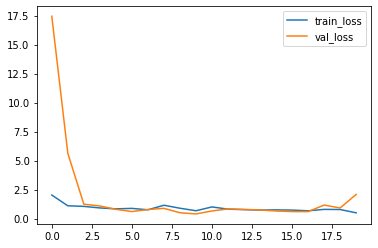

In [139]:
_ = log_0.plot()
# for i in range(2):
#     log_0.plot()
print(model_.partial_log_likelihood(*val).mean())

In [91]:
_ = model_.compute_baseline_hazards()
surv = model_.predict_surv_df(x_test)
surv

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
duration,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,1.000,0.994,1.0,1.0,1.000,1.000,1.0,1.000e+00,1.000,1.000e+00,1.000,1.000,1.0,1.0,1.0,1.000,1.000,1.0,1.0,0.999,1.000,1.0,0.994,0.999,1.0,1.0,1.000,1.0,1.000,1.000,0.998,1.000e+00,1.000,1.00,1.000,1.000,1.0,1.0,1.0,1.000,1.0,1.000,1.0,1.0,1.000,1.0,1.000,1.0,1.000e+00,1.000,1.000,1.0,1.00,0.986,1.000,1.0,1.0,1.000e+00,1.000,1.000,1.0,0.999,1.000,1.000,1.000,1.000,1.000,0.997,1.000,1.0,1.0,1.000,1.0,1.000,1.0,1.0,1.000,1.0,1.000e+00
2.0,1.000,0.953,1.0,1.0,1.000,1.000,1.0,1.000e+00,1.000,1.000e+00,1.000,1.000,1.0,1.0,1.0,1.000,1.000,1.0,1.0,0.995,1.000,1.0,0.954,0.990,1.0,1.0,1.000,1.0,1.000,1.000,0.987,1.000e+00,1.000,1.00,1.000,1.000,1.0,1.0,1.0,1.000,1.0,1.000,1.0,1.0,1.000,1.0,1.000,1.0,1.000e+00,1.000,0.998,1.0,1.00,0.902,1.000,1.0,1.0,1.000e+00,0.999,1.000,1.0,0.995,1.000,1.000,1.000,1.000,1.000,0.980,1.000,1.0,1.0,0.999,1.0,1.000,1.0,1.0,1.000,1.0,1.000e+00
3.0,1.000,0.873,1.0,1.0,0.999,1.000,1.0,1.000e+00,1.000,1.000e+00,1.000,1.000,1.0,1.0,1.0,1.000,1.000,1.0,1.0,0.985,1.000,1.0,0.875,0.971,1.0,1.0,1.000,1.0,0.999,1.000,0.965,1.000e+00,1.000,1.00,1.000,1.000,1.0,1.0,1.0,1.000,1.0,0.999,1.0,1.0,0.999,1.0,1.000,1.0,1.000e+00,1.000,0.994,1.0,1.00,0.747,1.000,1.0,1.0,1.000e+00,0.998,1.000,1.0,0.985,1.000,1.000,1.000,1.000,1.000,0.945,1.000,1.0,1.0,0.996,1.0,1.000,1.0,1.0,1.000,1.0,1.000e+00
4.0,1.000,0.461,1.0,1.0,0.997,1.000,1.0,1.000e+00,1.000,1.000e+00,1.000,1.000,1.0,1.0,1.0,0.998,1.000,1.0,1.0,0.920,1.000,1.0,0.468,0.846,1.0,1.0,1.000,1.0,0.993,1.000,0.815,1.000e+00,1.000,1.00,1.000,1.000,1.0,1.0,1.0,1.000,1.0,0.997,1.0,1.0,0.997,1.0,1.000,1.0,1.000e+00,1.000,0.969,1.0,1.00,0.191,1.000,1.0,1.0,1.000e+00,0.989,1.000,1.0,0.920,1.000,1.000,1.000,0.998,1.000,0.726,1.000,1.0,1.0,0.979,1.0,1.000,1.0,1.0,1.000,1.0,1.000e+00
5.0,1.000,0.136,1.0,1.0,0.991,1.000,1.0,1.000e+00,1.000,1.000e+00,1.000,1.000,1.0,1.0,1.0,0.994,1.000,1.0,1.0,0.806,1.000,1.0,0.142,0.651,1.0,1.0,1.000,1.0,0.982,1.000,0.590,1.000e+00,1.000,1.00,1.000,1.000,1.0,1.0,1.0,1.000,1.0,0.992,1.0,1.0,0.992,1.0,1.000,1.0,1.000e+00,1.000,0.921,1.0,1.00,0.014,1.000,1.0,1.0,1.000e+00,0.973,1.000,1.0,0.806,1.000,1.000,1.000,0.996,1.000,0.439,1.000,1.0,1.0,0.947,1.0,1.000,1.0,1.0,1.000,1.0,1.000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
102.0,0.999,0.000,1.0,1.0,0.000,0.471,1.0,1.364e-05,0.041,7.685e-13,0.071,0.275,1.0,1.0,1.0,0.000,0.922,1.0,1.0,0.000,0.116,1.0,0.000,0.000,1.0,1.0,0.016,1.0,0.000,0.899,0.000,4.251e-58,0.068,0.98,0.123,0.726,1.0,1.0,1.0,0.916,1.0,0.000,1.0,1.0,0.000,1.0,0.996,0.0,3.574e-06,0.897,0.000,1.0,0.99,0.000,0.082,1.0,1.0,2.035e-05,0.000,0.999,1.0,0.000,0.946,0.007,0.839,0.000,0.999,0.000,0.511,1.0,1.0,0.000,1.0,0.992,1.0,1.0,0.648,1.0,5.284e-171
103.0,0.999,0.000,1.0,1.0,0.000,0.471,1.0,1.364e-05,0.041,7.685e-13,0.071,0.275,1.0,1.0,1.0,0.000,0.922,1.0,1.0,0.000,0.116,1.0,0.000,0.000,1.0,1.0,0.016,1.0,0.000,0.899,0.000,4.251e-58,0.068,0.98,0.123,0.726,1.0,1.0,1.0,0.916,1.0,0.000,1.0,1.0,0.000,1.0,0.996,0.0,3.574e-06,0.897,0.000,1.0,0.99,0.000,0.082,1.0,1.0,2.035e-05,0.000,0.999,1.0,0.000,0.946,0.007,0.839,0.000,0.999,0.000,0.511,1.0,1.0,0.000,1.0,0.992,1.0,1.0,0.648,1.0,5.284e-171
104.0,0.999,0.000,1.0,1.0,0.000,0.471,1.0,1.364e-05,0.041,7.685e-13,0.071,0.275,1.0,1.0,1.0,0.000,0.922,1.0,1.0,0.000,0.116,1.0,0.000,0.000,1.0,1.0,0.016,1.0,0.000,0.899,0.000,4.251e-58,0.068,0.98,0.123,0.726,1.0,1.0,1.0,0.916,1.0,0.000,1.0,1.0,0.000,1.0,0.996,0.0,3.574e-06,0.8

In [92]:
ev = EvalSurv(surv, durations_test, events_test, censor_surv='km')
ev.concordance_td()

0.9850543478260869

In [190]:
####### deep surv

get_target = lambda df: (df['recurr_time_final'].values, df['recurr_code'].values)
y_train = get_target(df_train)
y_val = get_target(df_val)
durations_test, events_test = get_target(df_test)
val = x_val, y_val

In [148]:
in_features = x_train.shape[1]
num_nodes = [64, 64]
out_features = 1
batch_norm = True
dropout = 0.2
output_bias = False

net = tt.practical.MLPVanilla(in_features, num_nodes, out_features, batch_norm,
                              dropout, output_bias=output_bias)
                        
optimizer = tt.optim.AdamWR(decoupled_weight_decay=0.01, cycle_eta_multiplier=0.8,
                            cycle_multiplier=2)

model = CoxPH(net, optimizer ) 

epochs = 100
callbacks = [tt.callbacks.EarlyStopping()]
verbose = True

log = model.fit(x_train, y_train, batch_size, epochs, callbacks, verbose,
                val_data=val, val_batch_size=batch_size)

/Users/alexandrabourdillon/miniconda3/lib/python3.9/site-packages/torchtuples/callbacks.py:607: UserWarning: This overload of add is deprecated:
	add(Number alpha, Tensor other)
Consider using one of the following signatures instead:
	add(Tensor other, *, Number alpha) (Triggered internally at  ../torch/csrc/utils/python_arg_parser.cpp:1025.)
  p.data = p.data.add(-weight_decay * eta, p.data)


0:	[0s / 0s],		train_loss: 3.8010,	val_loss: 3.7030
1:	[0s / 0s],		train_loss: 3.4020,	val_loss: 3.1935
2:	[0s / 0s],		train_loss: 3.1513,	val_loss: 3.1190
3:	[0s / 0s],		train_loss: 2.9939,	val_loss: 2.8042
4:	[0s / 0s],		train_loss: 2.8946,	val_loss: 2.7011
5:	[0s / 0s],		train_loss: 2.6823,	val_loss: 2.5451
6:	[0s / 0s],		train_loss: 2.5977,	val_loss: 2.4504
7:	[0s / 0s],		train_loss: 2.5814,	val_loss: 2.3038
8:	[0s / 0s],		train_loss: 2.4654,	val_loss: 2.1949
9:	[0s / 0s],		train_loss: 2.4652,	val_loss: 2.0769
10:	[0s / 0s],		train_loss: 2.2411,	val_loss: 2.0084
11:	[0s / 0s],		train_loss: 2.3045,	val_loss: 1.9548
12:	[0s / 0s],		train_loss: 2.2218,	val_loss: 1.9313
13:	[0s / 0s],		train_loss: 2.2485,	val_loss: 1.9246
14:	[0s / 0s],		train_loss: 2.2320,	val_loss: 1.9025
15:	[0s / 0s],		train_loss: 2.1293,	val_loss: 1.8116
16:	[0s / 0s],		train_loss: 2.0151,	val_loss: 1.7191
17:	[0s / 0s],		train_loss: 1.9852,	val_loss: 1.7146
18:	[0s / 0s],		train_loss: 2.1100,	val_loss: 1.6921
19:

## DeepSurv take 2 with crossval

In [53]:
# display(X_train.reset_index())
# display(pd.DataFrame(y_train).reset_index())

In [54]:
# print(X_train_transform.dtypes)
# print(X_test_transform.dtypes)

# print(pd.DataFrame(y_train).dtypes)
# print(pd.DataFrame(y_test).dtypes)

In [205]:
df_train_2

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
6,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,0.521,0.0,0.571,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,45.0
389,0.859,0.0,0.714,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,34.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,66.0


In [33]:
data_ds = X_hazard.copy()
df_train_2 = data_ds.copy()

random.seed(10)
df_test_2 = df_train_2.sample(frac=0.2)
df_train_2 = df_train_2.drop(df_test_2.index)

cols_stand = [] 

cols_leave = [ 
    'AGE', 'SEX', 'YEAR_OF_DIAGNOSIS', 'DX_DEFSURG_STARTED_DAYS',
       'RT_Y_N', 'chemo_binary', 'ENE', 'PNI', 'LVI', 'POS_SURG_MARGINS',
       'Positive_LNs', 'LN_yield', 'GRADE_recode', 't_recode_n',
       'n_recode_n', 'RACE_1.0', 'RACE_2.0', 'RACE_3.0', 'RACE_4.0',
       'RACE_5.0', 'Insurance_Status_Descrip_Medicaid',
       'Insurance_Status_Descrip_Medicare',
       'Insurance_Status_Descrip_Not Insured',
       'Insurance_Status_Descrip_Private/Managed',
       'PRIMARY_SITE_CONSOLIDATED_FOM', 'PRIMARY_SITE_CONSOLIDATED_Gum',
       'PRIMARY_SITE_CONSOLIDATED_Hard Palate',
       'PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth',
       'PRIMARY_SITE_CONSOLIDATED_Tongue', 'CC_SCORE_REGROUPED_0.0',
       'CC_SCORE_REGROUPED_1.0', 'CC_SCORE_REGROUPED_2.0',
       'Tobacco_History_0.0', 'Tobacco_History_1.0',
       'Tobacco_History_2.0', 'Alcohol_History_0.0',
       'Alcohol_History_1.0', 'Alcohol_History_2.0', 'ND_recode_Elective',
       'ND_recode_No Neck Dissection', 'ND_recode_Therapeutic',
       #'recurr_code', 'recurr_time_final'
    ]
    
    
#     'SEX', 
#     'YEAR_OF_DIAGNOSIS', 
#     'DX_DEFSURG_STARTED_DAYS', 
#     'RT_Y_N', 'chemo_binary', 
#     'ENE', 'PNI',
#     'GRADE_recode',
#     'LVI', 'POS_SURG_MARGINS',
#     't_recode_n', 'n_recode_n', 
#     #'recurr_code',
#     #'recurr_time_final'
#     ]

standardize = [([col], None) for col in cols_stand]
leave = [(col, None) for col in cols_leave]

x_mapper_2 = DataFrameMapper(standardize + leave)



In [34]:
get_target = lambda df: (df['recurr_time_final'].values, df['recurr_code'].values)

#y_train_2 = get_target(df_train_2)
durations_test_2, events_test_2 = get_target(df_test_2)

In [35]:
df_train_2.shape[1]

43

In [208]:
# input settings for DeepSurv
import torchtuples as tt
from pycox.models import CoxPH

n_nodes = 112
in_features = len(cols_leave)
num_nodes = [n_nodes, n_nodes, n_nodes, n_nodes]
out_features = 1
batch_norm = True
dropout = 0.1
output_bias = False

net_ds = tt.practical.MLPVanilla(in_features, num_nodes, out_features,
                                 batch_norm, dropout, output_bias=output_bias)

model_2 = CoxPH(net_ds, tt.optim.Adam)



In [209]:
len(df_train_cv.columns.values)
len(cols_leave)

41

df_train_2.shape:  (316, 43)
df_test_2.shape:  (79, 43)
df_val_cv:  (64, 43)
df_train_cv:  (252, 43)
x_train_cv:  (252, 41)
x_val_cv:  (64, 41)
LR: 


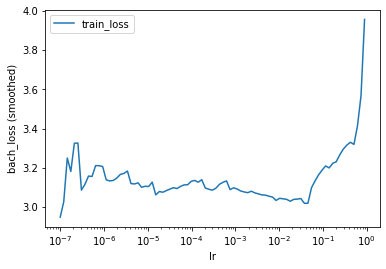

0.0001
0:	[0s / 0s],		train_loss: 3.1004,	val_loss: 2.6573
1:	[0s / 0s],		train_loss: 3.0405,	val_loss: 2.6567
2:	[0s / 0s],		train_loss: 3.0574,	val_loss: 2.6632
3:	[0s / 0s],		train_loss: 3.0466,	val_loss: 2.6584
4:	[0s / 0s],		train_loss: 3.0102,	val_loss: 2.6530
5:	[0s / 0s],		train_loss: 2.9496,	val_loss: 2.6339
6:	[0s / 0s],		train_loss: 2.9538,	val_loss: 2.6316
7:	[0s / 0s],		train_loss: 2.9150,	val_loss: 2.6501
8:	[0s / 0s],		train_loss: 3.0021,	val_loss: 2.6476
9:	[0s / 0s],		train_loss: 3.0023,	val_loss: 2.6429
10:	[0s / 0s],		train_loss: 2.9682,	val_loss: 2.6746
11:	[0s / 0s],		train_loss: 3.0435,	val_loss: 2.6592
12:	[0s / 0s],		train_loss: 2.9141,	val_loss: 2.6627
13:	[0s / 0s],		train_loss: 2.9504,	val_loss: 2.6645
14:	[0s / 0s],	
15:	[0s / 0s],	
16:	[0s / 0s],	
17:	[0s / 0s],	
18:	[0s / 0s],	
19:	[0s / 0s],	
20:	[0s / 0s],	
21:	[0s / 0s],	
22:	[0s / 0s],	
23:	[0s / 0s],	
24:	[0s / 0s],	
25:	[0s / 0s],	
26:	[0s / 0s],	
27:	[0s / 0s],	
28:	[0s / 0s],	
29:	[0s / 0s],	
30:	[

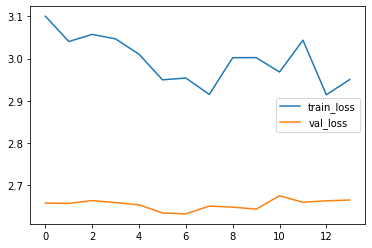

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
duration,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,0.995,0.998,0.996,0.996,0.999,0.995,0.997,0.994,0.998,0.995,0.999,0.996,0.995,0.998,0.998,0.995,0.998,0.998,0.998,0.997,0.997,0.998,0.998,0.997,0.997,0.998,0.998,0.997,0.996,0.995,0.995,0.998,0.998,0.993,0.997,0.996,0.999,0.997,0.996,0.997,0.996,0.997,0.982,0.998,0.998,0.996,0.999,0.998,0.999,0.999,0.993,0.997,0.998,0.999,0.998,0.994,0.998,0.997,0.993,0.991,0.996,0.997,0.993,0.996,0.997,1.000,0.996,0.998,0.994,0.994,0.999,0.998,0.998,0.996,0.997,0.998,0.999,0.998,0.998
2.0,0.985,0.995,0.987,0.988,0.997,0.986,0.990,0.983,0.993,0.986,0.996,0.987,0.984,0.994,0.995,0.984,0.993,0.995,0.993,0.991,0.990,0.993,0.993,0.991,0.990,0.993,0.994,0.991,0.987,0.984,0.986,0.995,0.993,0.978,0.992,0.988,0.996,0.991,0.988,0.991,0.988,0.989,0.948,0.995,0.995,0.988,0.997,0.995,0.997,0.997,0.979,0.991,0.995,0.997,0.995,0.982,0.994,0.990,0.980,0.973,0.989,0.990,0.980,0.987,0.992,0.999,0.988,0.993,0.983,0.982,0.996,0.995,0.993,0.988,0.990,0.994,0.997,0.995,0.995
3.0,0.970,0.991,0.975,0.975,0.995,0.971,0.980,0.967,0.987,0.972,0.993,0.974,0.968,0.989,0.990,0.968,0.986,0.990,0.987,0.983,0.979,0.985,0.986,0.982,0.981,0.986,0.989,0.981,0.974,0.967,0.971,0.990,0.986,0.956,0.983,0.975,0.992,0.983,0.976,0.981,0.975,0.979,0.897,0.990,0.990,0.975,0.993,0.990,0.994,0.995,0.959,0.983,0.989,0.995,0.990,0.963,0.988,0.980,0.961,0.945,0.979,0.980,0.961,0.974,0.985,0.997,0.975,0.986,0.966,0.963,0.992,0.990,0.986,0.976,0.979,0.989,0.994,0.990,0.990
4.0,0.939,0.981,0.949,0.950,0.989,0.942,0.960,0.934,0.974,0.943,0.985,0.948,0.936,0.977,0.979,0.935,0.972,0.979,0.973,0.965,0.958,0.970,0.971,0.964,0.961,0.972,0.978,0.962,0.948,0.934,0.942,0.980,0.971,0.913,0.966,0.951,0.984,0.965,0.952,0.963,0.950,0.958,0.802,0.980,0.980,0.950,0.986,0.980,0.988,0.989,0.918,0.965,0.979,0.989,0.979,0.927,0.976,0.960,0.922,0.892,0.957,0.960,0.922,0.949,0.969,0.994,0.950,0.972,0.933,0.927,0.983,0.980,0.971,0.951,0.959,0.977,0.988,0.980,0.979
5.0,0.887,0.964,0.905,0.907,0.979,0.892,0.925,0.878,0.950,0.894,0.972,0.903,0.881,0.957,0.960,0.879,0.947,0.961,0.950,0.934,0.921,0.943,0.946,0.932,0.927,0.948,0.957,0.929,0.902,0.878,0.892,0.963,0.946,0.841,0.936,0.908,0.970,0.934,0.911,0.930,0.907,0.920,0.656,0.961,0.962,0.907,0.974,0.961,0.978,0.980,0.848,0.934,0.959,0.979,0.960,0.865,0.954,0.925,0.857,0.804,0.920,0.925,0.856,0.904,0.942,0.989,0.907,0.946,0.875,0.864,0.967,0.962,0.945,0.909,0.922,0.957,0.977,0.962,0.960
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101.0,0.617,0.861,0.669,0.675,0.919,0.631,0.731,0.591,0.814,0.636,0.892,0.663,0.599,0.837,0.848,0.596,0.803,0.852,0.813,0.760,0.716,0.790,0.798,0.753,0.735,0.805,0.839,0.743,0.661,0.592,0.632,0.858,0.798,0.497,0.765,0.676,0.885,0.758,0.685,0.746,0.673,0.715,0.183,0.852,0.855,0.674,0.900,0.853,0.913,0.920,0.515,0.761,0.846,0.918,0.849,0.558,0.828,0.731,0.535,0.415,0.713,0.730,0.533,0.665,0.785,0.957,0.673,0.800,0.584,0.555,0.875,0.857,0.797,0.681,0.722,0.838,0.912,0.854,0.848
102.0,0.617,0.861,0.669,0.675,0.919,0.631,0.731,0.591,0.814,0.636,0.892,0.663,0.599,0.837,0.848,0.596,0.803,0.852,0.813,0.760,0.716,0.790,0.798,0.753,0.735,0.805,0.839,0.743,0.661,0.592,0.632,0.858,0.798,0.497,0.765,0.676,0.885,0.758,0.685,0.746,0.673,0.715,0.183,0.852,0.855,0.674,0.900,0.853,0.913,0.920,0.515,0.761,0.846,0.918,0.849,0.558,0.828,0.731,0.535,0.415,0.713,0.730,0.533,0.665,0.785,0.957,0.673,0.800,0.584,0.555,0.875,0.857,0.797,0.681,0.722,0.838,0.912,0.854,0.848
104.0,0.617,0.

concordance:  0.6916118421052632
df_val_cv:  (63, 43)
df_train_cv:  (253, 43)
x_train_cv:  (253, 41)
x_val_cv:  (63, 41)
LR: 


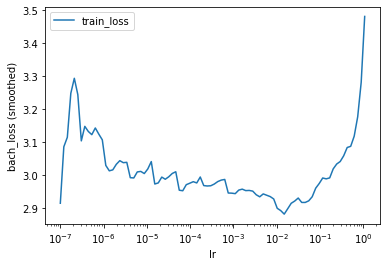

0.001484968262254472
0:	[0s / 0s],		train_loss: 3.0452,	val_loss: 2.9986
1:	[0s / 0s],		train_loss: 3.0209,	val_loss: 2.9984
2:	[0s / 0s],		train_loss: 3.0254,	val_loss: 2.9979
3:	[0s / 0s],		train_loss: 2.9137,	val_loss: 3.0157
4:	[0s / 0s],		train_loss: 2.9517,	val_loss: 3.0419
5:	[0s / 0s],		train_loss: 2.8919,	val_loss: 3.0536
6:	[0s / 0s],		train_loss: 3.0610,	val_loss: 3.0433
7:	[0s / 0s],		train_loss: 2.7339,	val_loss: 3.0136
8:	[0s / 0s],		train_loss: 2.9032,	val_loss: 3.0023
9:	[0s / 0s],		train_loss: 2.8921,	val_loss: 3.0550
10:	[0s / 0s],		train_loss: 2.8167,	val_loss: 3.0928
11:	[0s / 0s],		train_loss: 2.8753,	val_loss: 3.0754
12:	[0s / 0s],		train_loss: 2.8401,	val_loss: 3.0781
13:	[0s / 0s],		train_loss: 2.7698,	val_loss: 3.1156
14:	[0s / 0s],		train_loss: 2.8636,	val_loss: 3.1164
15:	[0s / 0s],		train_loss: 2.8914,	val_loss: 3.1205
16:	[0s / 0s],		train_loss: 2.7827,	val_loss: 3.1043
17:	[0s / 0s],		train_loss: 2.6174,	val_loss: 3.0754
18:	[0s / 0s],		train_loss: 2.8833,

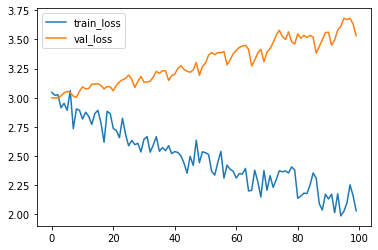

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
duration,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,0.994,0.998,0.997,0.996,0.999,0.995,0.997,0.995,0.998,0.995,0.999,0.995,0.995,0.998,0.998,0.995,0.998,0.999,0.998,0.997,0.996,0.997,0.998,0.998,0.997,0.997,0.998,0.997,0.996,0.994,0.994,0.998,0.998,0.993,0.997,0.996,0.999,0.997,0.996,0.997,0.996,0.997,0.982,0.998,0.999,0.996,0.999,0.999,0.999,0.999,0.993,0.997,0.998,0.999,0.999,0.994,0.998,0.997,0.994,0.991,0.997,0.997,0.994,0.996,0.998,1.000,0.995,0.998,0.994,0.995,0.999,0.998,0.997,0.996,0.997,0.998,0.999,0.998,0.998
2.0,0.983,0.995,0.990,0.988,0.998,0.985,0.990,0.984,0.994,0.984,0.996,0.985,0.985,0.994,0.995,0.985,0.993,0.995,0.995,0.992,0.989,0.992,0.994,0.993,0.990,0.992,0.994,0.991,0.989,0.983,0.983,0.995,0.994,0.978,0.992,0.988,0.997,0.992,0.988,0.992,0.988,0.990,0.946,0.995,0.996,0.989,0.996,0.996,0.997,0.998,0.979,0.992,0.995,0.998,0.996,0.981,0.994,0.991,0.981,0.974,0.990,0.991,0.983,0.988,0.993,0.999,0.986,0.993,0.983,0.985,0.996,0.995,0.991,0.988,0.991,0.995,0.997,0.994,0.994
3.0,0.967,0.990,0.980,0.976,0.995,0.970,0.981,0.968,0.988,0.968,0.993,0.970,0.970,0.988,0.991,0.969,0.985,0.991,0.989,0.984,0.977,0.984,0.987,0.986,0.981,0.985,0.989,0.981,0.977,0.966,0.966,0.991,0.988,0.956,0.985,0.976,0.993,0.983,0.976,0.983,0.976,0.981,0.894,0.991,0.991,0.978,0.992,0.991,0.995,0.995,0.959,0.984,0.989,0.995,0.992,0.963,0.989,0.982,0.962,0.949,0.980,0.981,0.967,0.976,0.986,0.998,0.973,0.987,0.967,0.971,0.992,0.989,0.981,0.976,0.981,0.991,0.995,0.989,0.987
4.0,0.922,0.976,0.953,0.943,0.989,0.929,0.955,0.926,0.972,0.926,0.982,0.931,0.930,0.972,0.978,0.928,0.965,0.978,0.974,0.962,0.946,0.962,0.970,0.966,0.955,0.964,0.973,0.955,0.947,0.921,0.921,0.978,0.971,0.898,0.964,0.943,0.984,0.960,0.944,0.960,0.945,0.954,0.765,0.978,0.979,0.949,0.981,0.979,0.988,0.989,0.905,0.963,0.975,0.989,0.980,0.913,0.974,0.958,0.911,0.882,0.952,0.956,0.922,0.944,0.967,0.994,0.936,0.969,0.922,0.932,0.981,0.975,0.955,0.944,0.956,0.978,0.988,0.974,0.970
5.0,0.865,0.958,0.918,0.899,0.980,0.876,0.921,0.871,0.951,0.872,0.968,0.880,0.878,0.951,0.960,0.874,0.939,0.962,0.954,0.933,0.905,0.933,0.946,0.941,0.920,0.936,0.953,0.921,0.907,0.863,0.862,0.961,0.949,0.825,0.936,0.900,0.972,0.929,0.901,0.930,0.903,0.919,0.618,0.961,0.962,0.910,0.966,0.962,0.978,0.980,0.836,0.934,0.955,0.980,0.965,0.850,0.954,0.927,0.847,0.799,0.916,0.922,0.865,0.902,0.942,0.990,0.888,0.945,0.865,0.881,0.966,0.956,0.922,0.903,0.923,0.961,0.979,0.953,0.946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99.0,0.567,0.846,0.716,0.661,0.924,0.598,0.725,0.583,0.822,0.586,0.882,0.607,0.603,0.822,0.853,0.592,0.782,0.859,0.833,0.763,0.679,0.764,0.806,0.788,0.723,0.773,0.828,0.727,0.683,0.563,0.562,0.855,0.815,0.473,0.771,0.662,0.896,0.751,0.667,0.753,0.672,0.721,0.154,0.857,0.861,0.693,0.875,0.861,0.917,0.925,0.498,0.767,0.837,0.923,0.871,0.532,0.831,0.743,0.522,0.417,0.711,0.730,0.568,0.669,0.792,0.962,0.630,0.801,0.567,0.611,0.874,0.838,0.727,0.671,0.730,0.855,0.919,0.829,0.806
101.0,0.567,0.846,0.716,0.661,0.924,0.598,0.725,0.583,0.822,0.586,0.882,0.607,0.603,0.822,0.853,0.592,0.782,0.859,0.833,0.763,0.679,0.764,0.806,0.788,0.723,0.773,0.828,0.727,0.683,0.563,0.562,0.855,0.815,0.473,0.771,0.662,0.896,0.751,0.667,0.753,0.672,0.721,0.154,0.857,0.861,0.693,0.875,0.861,0.917,0.925,0.498,0.767,0.837,0.923,0.871,0.532,0.831,0.743,0.522,0.417,0.711,0.730,0.568,0.669,0.792,0.962,0.630,0.801,0.567,0.611,0.874,0.838,0.727,0.671,0.730,0.855,0.919,0.829,0.806
102.0,0.567,0.8

concordance:  0.6924342105263158
df_val_cv:  (63, 43)
df_train_cv:  (253, 43)
x_train_cv:  (253, 41)
x_val_cv:  (63, 41)
LR: 


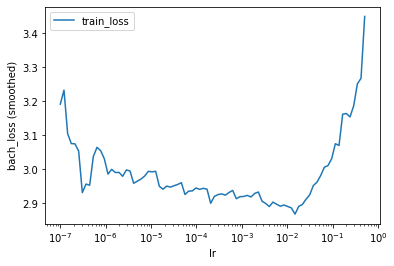

0.001484968262254472
0:	[0s / 0s],		train_loss: 3.0262,	val_loss: 2.6651
1:	[0s / 0s],		train_loss: 2.8585,	val_loss: 2.6749
2:	[0s / 0s],		train_loss: 2.9203,	val_loss: 2.6835
3:	[0s / 0s],		train_loss: 2.8281,	val_loss: 2.6741
4:	[0s / 0s],		train_loss: 3.0660,	val_loss: 2.6456
5:	[0s / 0s],		train_loss: 2.8716,	val_loss: 2.6649
6:	[0s / 0s],		train_loss: 2.8582,	val_loss: 2.6734
7:	[0s / 0s],		train_loss: 2.9450,	val_loss: 2.6739
8:	[0s / 0s],		train_loss: 2.9031,	val_loss: 2.6793
9:	[0s / 0s],		train_loss: 2.8834,	val_loss: 2.6670
10:	[0s / 0s],		train_loss: 2.9182,	val_loss: 2.6560
11:	[0s / 0s],		train_loss: 2.8356,	val_loss: 2.6444
12:	[0s / 0s],		train_loss: 2.8069,	val_loss: 2.6578
13:	[0s / 0s],		train_loss: 2.8803,	val_loss: 2.6674
14:	[0s / 0s],		train_loss: 2.6751,	val_loss: 2.6825
15:	[0s / 0s],		train_loss: 2.9163,	val_loss: 2.6985
16:	[0s / 0s],		train_loss: 2.7186,	val_loss: 2.6811
17:	[0s / 0s],		train_loss: 2.6936,	val_loss: 2.6636
18:	[0s / 0s],		train_loss: 2.8430,

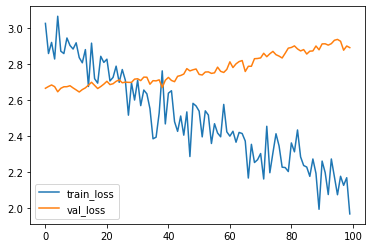

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
duration,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
2.0,0.989,0.998,0.992,0.992,0.999,0.992,0.994,0.990,0.997,0.992,0.998,0.993,0.990,0.997,0.998,0.992,0.996,0.997,0.997,0.996,0.993,0.994,0.997,0.995,0.994,0.996,0.998,0.994,0.994,0.990,0.989,0.997,0.996,0.985,0.995,0.993,0.998,0.995,0.993,0.995,0.992,0.995,0.966,0.998,0.998,0.995,0.999,0.998,0.998,0.999,0.988,0.995,0.998,0.999,0.998,0.985,0.997,0.995,0.985,0.979,0.994,0.994,0.992,0.993,0.997,1.000,0.993,0.996,0.991,0.989,0.999,0.998,0.997,0.993,0.994,0.998,0.999,0.997,0.996
3.0,0.968,0.995,0.976,0.976,0.997,0.975,0.981,0.971,0.990,0.977,0.994,0.979,0.970,0.991,0.993,0.975,0.989,0.992,0.992,0.987,0.978,0.982,0.990,0.984,0.981,0.988,0.994,0.981,0.981,0.970,0.967,0.992,0.988,0.955,0.984,0.980,0.994,0.984,0.978,0.985,0.976,0.984,0.900,0.994,0.994,0.986,0.998,0.994,0.993,0.997,0.963,0.984,0.995,0.997,0.993,0.954,0.992,0.984,0.957,0.937,0.982,0.983,0.974,0.980,0.989,0.999,0.978,0.988,0.973,0.967,0.996,0.993,0.992,0.979,0.982,0.993,0.996,0.991,0.987
4.0,0.925,0.988,0.944,0.943,0.992,0.941,0.956,0.931,0.976,0.946,0.985,0.950,0.929,0.978,0.983,0.942,0.974,0.981,0.980,0.968,0.949,0.957,0.975,0.961,0.955,0.972,0.985,0.956,0.954,0.930,0.923,0.982,0.971,0.895,0.963,0.953,0.986,0.962,0.947,0.964,0.943,0.961,0.776,0.985,0.985,0.966,0.995,0.985,0.984,0.993,0.914,0.963,0.987,0.992,0.983,0.893,0.980,0.961,0.899,0.856,0.958,0.959,0.940,0.952,0.975,0.997,0.949,0.973,0.936,0.922,0.989,0.983,0.980,0.951,0.957,0.983,0.992,0.980,0.969
5.0,0.880,0.981,0.910,0.908,0.987,0.905,0.929,0.889,0.961,0.913,0.975,0.919,0.887,0.964,0.972,0.906,0.957,0.968,0.968,0.949,0.917,0.930,0.960,0.937,0.927,0.954,0.975,0.929,0.926,0.888,0.876,0.970,0.953,0.833,0.940,0.924,0.977,0.939,0.914,0.942,0.909,0.937,0.660,0.976,0.976,0.945,0.992,0.975,0.974,0.988,0.863,0.940,0.979,0.987,0.973,0.830,0.968,0.938,0.840,0.775,0.932,0.934,0.903,0.923,0.959,0.995,0.917,0.955,0.898,0.875,0.982,0.972,0.968,0.920,0.931,0.971,0.986,0.967,0.949
6.0,0.832,0.972,0.873,0.870,0.981,0.865,0.899,0.845,0.944,0.878,0.965,0.885,0.841,0.948,0.960,0.867,0.939,0.955,0.954,0.927,0.883,0.901,0.942,0.911,0.897,0.934,0.964,0.899,0.895,0.843,0.827,0.957,0.933,0.769,0.915,0.893,0.967,0.914,0.879,0.918,0.871,0.911,0.549,0.966,0.966,0.922,0.989,0.964,0.962,0.983,0.809,0.915,0.970,0.981,0.961,0.765,0.954,0.911,0.777,0.693,0.904,0.906,0.864,0.891,0.942,0.992,0.883,0.936,0.856,0.825,0.975,0.959,0.954,0.887,0.902,0.959,0.980,0.952,0.928
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98.0,0.567,0.917,0.658,0.650,0.942,0.640,0.721,0.594,0.838,0.669,0.895,0.687,0.586,0.848,0.882,0.645,0.824,0.867,0.865,0.791,0.681,0.725,0.832,0.750,0.715,0.811,0.893,0.721,0.710,0.591,0.556,0.874,0.808,0.445,0.760,0.705,0.900,0.757,0.672,0.768,0.654,0.750,0.157,0.898,0.899,0.779,0.965,0.893,0.888,0.948,0.520,0.759,0.910,0.944,0.885,0.438,0.865,0.751,0.460,0.323,0.732,0.737,0.637,0.700,0.831,0.976,0.680,0.816,0.619,0.552,0.924,0.880,0.863,0.692,0.729,0.879,0.940,0.860,0.793
99.0,0.567,0.917,0.658,0.650,0.942,0.640,0.721,0.594,0.838,0.669,0.895,0.687,0.586,0.848,0.882,0.645,0.824,0.867,0.865,0.791,0.681,0.725,0.832,0.750,0.715,0.811,0.893,0.721,0.710,0.591,0.556,0.874,0.808,0.445,0.760,0.705,0.900,0.757,0.672,0.768,0.654,0.750,0.157,0.898,0.899,0.779,0.965,0.893,0.888,0.948,0.520,0.759,0.910,0.944,0.885,0.438,0.865,0.751,0.460,0.323,0.732,0.737,0.637,0.700,0.831,0.976,0.680,0.816,0.619,0.552,0.924,0.880,0.863,0.692,0.729,0.879,0.940,0.860,0.793
104.0,0.567,0.91

concordance:  0.6875
df_val_cv:  (63, 43)
df_train_cv:  (253, 43)
x_train_cv:  (253, 41)
x_val_cv:  (63, 41)
LR: 


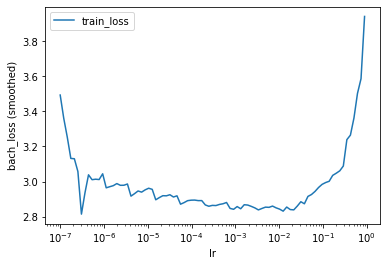

0.0001
0:	[0s / 0s],		train_loss: 2.8341,	val_loss: 2.3556
1:	[0s / 0s],		train_loss: 2.7359,	val_loss: 2.3748
2:	[0s / 0s],		train_loss: 2.8298,	val_loss: 2.3700
3:	[0s / 0s],		train_loss: 2.6580,	val_loss: 2.3588
4:	[0s / 0s],		train_loss: 2.7914,	val_loss: 2.3494
5:	[0s / 0s],		train_loss: 2.8258,	val_loss: 2.3574
6:	[0s / 0s],		train_loss: 2.7010,	val_loss: 2.3709
7:	[0s / 0s],		train_loss: 2.8824,	val_loss: 2.3685
8:	[0s / 0s],		train_loss: 2.7936,	val_loss: 2.3623
9:	[0s / 0s],		train_loss: 2.7430,	val_loss: 2.3871
10:	[0s / 0s],		train_loss: 2.8153,	val_loss: 2.3804
11:	[0s / 0s],		train_loss: 2.7200,	val_loss: 2.3948
12:	[0s / 0s],		train_loss: 2.5533,	val_loss: 2.3839
13:	[0s / 0s],		train_loss: 2.7972,	val_loss: 2.3706
14:	[0s / 0s],		train_loss: 2.6557,	val_loss: 2.3790
15:	[0s / 0s],	
16:	[0s / 0s],	
17:	[0s / 0s],	
18:	[0s / 0s],	
19:	[0s / 0s],	
20:	[0s / 0s],	
21:	[0s / 0s],	
22:	[0s / 0s],	
23:	[0s / 0s],	
24:	[0s / 0s],	
25:	[0s / 0s],	
26:	[0s / 0s],	
27:	[0s / 0s],	


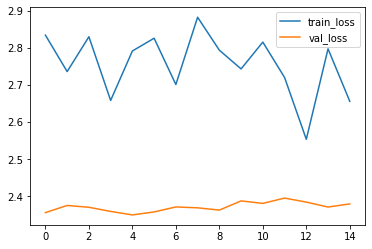

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
duration,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,0.994,0.999,0.995,0.994,1.000,0.996,0.997,0.992,0.998,0.996,0.999,0.996,0.994,0.998,0.999,0.995,0.998,0.999,0.999,0.998,0.996,0.998,0.998,0.998,0.997,0.998,0.998,0.997,0.996,0.994,0.994,0.999,0.998,0.993,0.998,0.996,0.999,0.998,0.996,0.998,0.996,0.998,0.982,0.999,0.999,0.997,1.000,0.999,0.999,1.000,0.993,0.998,0.999,1.000,0.999,0.993,0.999,0.997,0.992,0.987,0.997,0.997,0.995,0.997,0.998,1.000,0.996,0.998,0.996,0.993,0.999,0.999,0.998,0.997,0.997,0.999,0.999,0.999,0.998
2.0,0.989,0.998,0.991,0.989,0.999,0.991,0.994,0.985,0.996,0.992,0.998,0.992,0.988,0.996,0.997,0.990,0.996,0.998,0.997,0.996,0.992,0.995,0.996,0.995,0.994,0.996,0.997,0.994,0.993,0.988,0.989,0.997,0.996,0.985,0.996,0.993,0.998,0.995,0.992,0.995,0.992,0.996,0.964,0.998,0.998,0.995,0.999,0.998,0.999,0.999,0.985,0.995,0.998,0.999,0.998,0.986,0.997,0.995,0.984,0.975,0.994,0.994,0.990,0.994,0.996,1.000,0.992,0.996,0.991,0.986,0.998,0.997,0.996,0.993,0.994,0.998,0.999,0.997,0.996
3.0,0.972,0.996,0.976,0.972,0.998,0.978,0.986,0.962,0.991,0.981,0.995,0.981,0.970,0.991,0.993,0.975,0.989,0.994,0.993,0.990,0.981,0.988,0.991,0.987,0.985,0.990,0.991,0.984,0.981,0.969,0.972,0.993,0.991,0.963,0.989,0.982,0.996,0.988,0.981,0.988,0.981,0.989,0.911,0.995,0.995,0.987,0.998,0.996,0.997,0.998,0.964,0.988,0.994,0.997,0.995,0.965,0.993,0.987,0.960,0.937,0.985,0.984,0.975,0.984,0.991,0.999,0.979,0.990,0.978,0.966,0.996,0.994,0.990,0.984,0.984,0.994,0.997,0.994,0.990
4.0,0.922,0.988,0.934,0.921,0.995,0.938,0.960,0.896,0.975,0.945,0.987,0.947,0.916,0.973,0.980,0.931,0.969,0.983,0.979,0.971,0.946,0.966,0.975,0.965,0.957,0.972,0.976,0.955,0.947,0.914,0.922,0.981,0.974,0.898,0.969,0.950,0.988,0.967,0.946,0.967,0.946,0.969,0.767,0.987,0.987,0.963,0.995,0.988,0.991,0.993,0.899,0.965,0.983,0.993,0.985,0.902,0.979,0.962,0.890,0.831,0.959,0.956,0.930,0.955,0.975,0.997,0.942,0.971,0.938,0.905,0.989,0.982,0.971,0.954,0.955,0.983,0.991,0.982,0.971
5.0,0.880,0.981,0.898,0.878,0.992,0.904,0.937,0.841,0.961,0.915,0.980,0.918,0.871,0.958,0.969,0.893,0.952,0.974,0.968,0.955,0.916,0.946,0.960,0.945,0.932,0.956,0.962,0.930,0.918,0.868,0.880,0.971,0.959,0.843,0.952,0.922,0.981,0.948,0.917,0.949,0.916,0.952,0.658,0.979,0.979,0.942,0.992,0.981,0.987,0.989,0.846,0.945,0.973,0.989,0.976,0.851,0.967,0.941,0.832,0.747,0.936,0.932,0.891,0.930,0.960,0.995,0.910,0.955,0.904,0.854,0.983,0.972,0.955,0.928,0.930,0.973,0.986,0.971,0.954
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98.0,0.548,0.913,0.602,0.540,0.962,0.621,0.736,0.442,0.828,0.658,0.908,0.668,0.521,0.816,0.862,0.586,0.793,0.881,0.856,0.803,0.660,0.770,0.826,0.764,0.718,0.809,0.831,0.708,0.668,0.512,0.547,0.868,0.821,0.447,0.793,0.682,0.913,0.777,0.663,0.780,0.662,0.791,0.138,0.905,0.904,0.755,0.963,0.911,0.938,0.950,0.453,0.765,0.877,0.948,0.892,0.466,0.852,0.749,0.419,0.251,0.730,0.716,0.580,0.708,0.825,0.977,0.639,0.805,0.619,0.475,0.922,0.873,0.805,0.704,0.709,0.879,0.936,0.871,0.800
99.0,0.548,0.913,0.602,0.540,0.962,0.621,0.736,0.442,0.828,0.658,0.908,0.668,0.521,0.816,0.862,0.586,0.793,0.881,0.856,0.803,0.660,0.770,0.826,0.764,0.718,0.809,0.831,0.708,0.668,0.512,0.547,0.868,0.821,0.447,0.793,0.682,0.913,0.777,0.663,0.780,0.662,0.791,0.138,0.905,0.904,0.755,0.963,0.911,0.938,0.950,0.453,0.765,0.877,0.948,0.892,0.466,0.852,0.749,0.419,0.251,0.730,0.716,0.580,0.708,0.825,0.977,0.639,0.805,0.619,0.475,0.922,0.873,0.805,0.704,0.709,0.879,0.936,0.871,0.800
101.0,0.548,0.91

concordance:  0.7055921052631579
df_val_cv:  (63, 43)
df_train_cv:  (253, 43)
x_train_cv:  (253, 41)
x_val_cv:  (63, 41)
LR: 


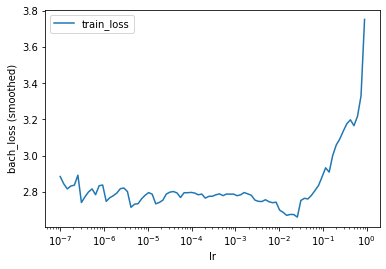

0.002595024211399749
0:	[0s / 0s],		train_loss: 3.0224,	val_loss: 2.5044
1:	[0s / 0s],		train_loss: 2.8939,	val_loss: 2.4976
2:	[0s / 0s],		train_loss: 2.7600,	val_loss: 2.4962
3:	[0s / 0s],		train_loss: 2.8701,	val_loss: 2.4984
4:	[0s / 0s],		train_loss: 2.7222,	val_loss: 2.4928
5:	[0s / 0s],		train_loss: 2.8185,	val_loss: 2.4787
6:	[0s / 0s],		train_loss: 2.8304,	val_loss: 2.4804
7:	[0s / 0s],		train_loss: 2.6643,	val_loss: 2.4937
8:	[0s / 0s],		train_loss: 2.7388,	val_loss: 2.4905
9:	[0s / 0s],		train_loss: 2.5886,	val_loss: 2.4940
10:	[0s / 0s],		train_loss: 2.6280,	val_loss: 2.4883
11:	[0s / 0s],		train_loss: 2.6736,	val_loss: 2.5042
12:	[0s / 0s],		train_loss: 2.7653,	val_loss: 2.4981
13:	[0s / 0s],		train_loss: 2.6896,	val_loss: 2.4924
14:	[0s / 0s],		train_loss: 2.7537,	val_loss: 2.5033
15:	[0s / 0s],		train_loss: 2.6865,	val_loss: 2.5053
16:	[0s / 0s],		train_loss: 2.6422,	val_loss: 2.5114
17:	[0s / 0s],		train_loss: 2.6031,	val_loss: 2.5006
18:	[0s / 0s],		train_loss: 2.5082,

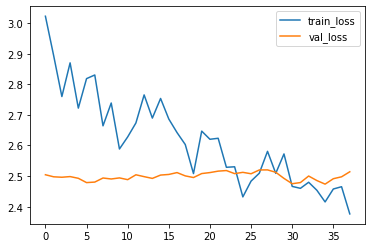

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78
duration,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1.0,0.996,1.000,0.995,0.991,0.999,0.996,0.998,0.996,0.999,0.997,0.999,0.998,0.995,0.998,1.000,0.995,0.999,0.999,0.999,0.999,0.998,0.998,0.999,0.998,0.998,0.999,0.999,0.997,0.997,0.995,0.996,0.999,0.999,0.992,0.999,0.998,1.000,0.998,0.997,0.999,0.997,0.999,0.986,1.000,1.000,0.999,1.000,0.999,0.998,1.000,0.994,0.998,0.999,1.000,0.999,0.995,0.999,0.999,0.993,0.981,0.998,0.998,0.996,0.998,0.999,1.000,0.997,0.999,0.997,0.995,1.000,0.999,0.998,0.998,0.997,0.999,1.000,0.999,0.998
2.0,0.992,0.999,0.990,0.982,0.998,0.993,0.996,0.992,0.998,0.994,0.999,0.995,0.989,0.997,0.999,0.990,0.998,0.999,0.999,0.998,0.996,0.997,0.998,0.995,0.995,0.998,0.998,0.994,0.995,0.990,0.993,0.999,0.997,0.984,0.998,0.995,0.999,0.995,0.993,0.997,0.994,0.998,0.973,0.999,0.999,0.997,1.000,0.998,0.995,1.000,0.988,0.997,0.999,1.000,0.999,0.989,0.999,0.997,0.986,0.962,0.996,0.996,0.992,0.997,0.998,1.000,0.994,0.998,0.995,0.991,0.999,0.999,0.996,0.995,0.995,0.999,1.000,0.998,0.996
3.0,0.980,0.998,0.975,0.955,0.996,0.981,0.991,0.980,0.995,0.985,0.997,0.988,0.972,0.992,0.998,0.974,0.994,0.997,0.996,0.995,0.989,0.991,0.996,0.988,0.988,0.995,0.996,0.984,0.987,0.974,0.981,0.997,0.994,0.959,0.994,0.988,0.998,0.988,0.983,0.993,0.984,0.994,0.932,0.998,0.998,0.993,0.999,0.995,0.988,0.999,0.970,0.991,0.997,0.999,0.997,0.973,0.997,0.993,0.964,0.905,0.989,0.989,0.979,0.992,0.996,0.999,0.984,0.994,0.987,0.976,0.998,0.997,0.989,0.988,0.986,0.997,0.999,0.996,0.989
4.0,0.960,0.996,0.949,0.909,0.991,0.961,0.981,0.959,0.989,0.969,0.994,0.975,0.943,0.984,0.996,0.947,0.988,0.995,0.993,0.991,0.978,0.982,0.992,0.976,0.974,0.990,0.991,0.968,0.973,0.947,0.962,0.994,0.987,0.917,0.987,0.976,0.995,0.976,0.964,0.986,0.966,0.988,0.865,0.995,0.995,0.985,0.998,0.990,0.976,0.998,0.940,0.982,0.993,0.998,0.993,0.944,0.995,0.986,0.926,0.813,0.977,0.978,0.956,0.983,0.991,0.999,0.968,0.988,0.973,0.951,0.996,0.995,0.977,0.976,0.972,0.994,0.998,0.991,0.978
5.0,0.920,0.993,0.901,0.826,0.982,0.923,0.962,0.919,0.978,0.938,0.988,0.951,0.888,0.967,0.992,0.897,0.976,0.989,0.985,0.981,0.956,0.964,0.984,0.952,0.949,0.980,0.981,0.937,0.946,0.896,0.924,0.987,0.974,0.840,0.974,0.951,0.990,0.951,0.929,0.972,0.933,0.975,0.746,0.990,0.990,0.970,0.996,0.981,0.952,0.996,0.882,0.963,0.987,0.995,0.986,0.891,0.989,0.973,0.857,0.659,0.954,0.956,0.914,0.965,0.982,0.998,0.937,0.977,0.947,0.903,0.992,0.989,0.954,0.952,0.944,0.988,0.996,0.983,0.956
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101.0,0.564,0.951,0.485,0.266,0.884,0.574,0.768,0.558,0.859,0.643,0.920,0.707,0.441,0.795,0.945,0.471,0.848,0.927,0.901,0.876,0.733,0.777,0.892,0.712,0.697,0.867,0.878,0.636,0.679,0.468,0.581,0.916,0.831,0.301,0.833,0.709,0.931,0.708,0.602,0.824,0.620,0.840,0.132,0.934,0.934,0.811,0.972,0.874,0.712,0.972,0.420,0.773,0.911,0.967,0.910,0.450,0.927,0.826,0.343,0.056,0.720,0.734,0.536,0.784,0.884,0.984,0.637,0.851,0.686,0.495,0.946,0.928,0.722,0.714,0.672,0.922,0.970,0.888,0.735
102.0,0.564,0.951,0.485,0.266,0.884,0.574,0.768,0.558,0.859,0.643,0.920,0.707,0.441,0.795,0.945,0.471,0.848,0.927,0.901,0.876,0.733,0.777,0.892,0.712,0.697,0.867,0.878,0.636,0.679,0.468,0.581,0.916,0.831,0.301,0.833,0.709,0.931,0.708,0.602,0.824,0.620,0.840,0.132,0.934,0.934,0.811,0.972,0.874,0.712,0.972,0.420,0.773,0.911,0.967,0.910,0.450,0.927,0.826,0.343,0.056,0.720,0.734,0.536,0.784,0.884,0.984,0.637,0.851,0.686,0.495,0.946,0.928,0.722,0.714,0.672,0.922,0.970,0.888,0.735
104.0,0.564,0.

concordance:  0.7220394736842105


In [233]:
print("df_train_2.shape: " , df_train_2.shape)
print("df_test_2.shape: " , df_test_2.shape)

# for i in range(5):
#     print("######### CV number: ", i, "############ ")
#     random.seed(10*(i+1))
    
for train_idx, val_idx in cv.split(df_train_2):
#     print(train_idx)
#     print(val_idx)
#     df_val_cv = df_train_2.sample(frac=0.2)
#     df_train_cv = df_train_2.drop(df_val_cv.index)

    df_train_cv= df_train_2.iloc[train_idx]
    #display(train_cv)
    
    df_val_cv= df_train_2.iloc[val_idx]
    #display(val_cv)
      
    
    print("df_val_cv: ", df_val_cv.shape)
    print("df_train_cv: ", df_train_cv.shape)

    x_mapper_2 = DataFrameMapper(standardize + leave)

    x_train_cv = x_mapper_2.fit_transform(df_train_cv).astype('float32')
    x_val_cv = x_mapper_2.transform(df_val_cv).astype('float32')
    x_test_2 = x_mapper_2.transform(df_test_2).astype('float32')
    
    y_train_cv = get_target(df_train_cv)
    y_val_cv = get_target(df_val_cv)
    durations_test_2, events_test_2 = get_target(df_test_2)
    
    val_cv = x_val_cv, y_val_cv
    
    batch_size = 40

    print("x_train_cv: ", x_train_cv.shape)
    #print("y_train_cv: ", y_train_cv.shape)
    print("x_val_cv: ", x_val_cv.shape)
    
    # finding the best learning rate from this model
    model_2 = CoxPH(net_ds, tt.optim.Adam)
    lrfinder = model_2.lr_finder(x_train_cv, y_train_cv, 
                                batch_size, tolerance=10)
    
    print("LR: ")
    #fig, ax = plt.subplots()
    #ax = lrfinder.plot()
    lrfinder.plot()
    plt.show()

    print(lrfinder.get_best_lr())
    
    
    # setting the new number
    model_2.optimizer.set_lr(0.0001)
    model_2.optimizer.param_groups[0]['lr']


    epochs = 100
    
#     print("Displays: ")
#     display(x_train_cv)
#     display(y_train_cv)
    
    callbacks = [tt.callbacks.EarlyStopping(patience = 100)]
    #callbacks = []
    verbose = True

    #%%time
    
    
    
    log = model_2.fit(x_train_cv, y_train_cv,
                     batch_size, epochs, 
                     callbacks, verbose,
                     val_data=val_cv, 
                     val_batch_size=batch_size)

    print("Log: ")
    #fig, ax = plt.subplots()
    #ax = 
    log.plot()
    plt.show()
    
    
    #print(model.partial_log_likelihood(*val).mean())


    #print("xtest2")
    #display(x_test_2)
    
    model_2.compute_baseline_hazards()
    surv = model_2.predict_surv_df(x_test_2)
    display(surv)


    ev = EvalSurv(surv, durations_test_2, events_test_2, censor_surv='km')
    print("concordance: " , ev.concordance_td())


    

In [230]:
print(df_train_2.shape)
df_train_2

(316, 43)


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,66.0


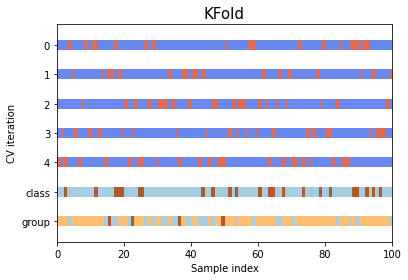

[  0   1   2   3   5   6   7   8  10  13  14  15  16  17  19  20  21  22
  23  24  25  26  28  30  31  32  33  34  35  36  37  38  39  40  41  42
  43  44  45  46  47  48  49  50  52  53  54  55  56  57  60  61  62  63
  64  65  66  67  68  69  70  71  72  74  75  76  77  78  79  81  82  83
  84  86  87  91  94  95  96  97  98  99 100 101 103 104 105 106 107 108
 109 113 114 115 116 118 120 121 122 123 124 125 126 127 128 129 130 131
 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149
 150 151 152 153 154 155 156 160 162 164 166 168 169 170 171 173 176 178
 181 182 183 184 185 189 190 191 193 194 195 196 198 199 200 202 203 204
 205 207 208 209 210 211 212 213 215 216 217 219 220 222 223 224 225 226
 227 228 229 231 232 233 234 235 236 237 238 239 240 241 243 244 245 247
 248 250 252 253 254 255 256 258 260 262 263 264 265 266 267 268 270 272
 273 274 275 276 277 278 279 280 281 283 284 285 286 287 288 289 292 293
 294 295 296 298 299 300 302 303 304 305 306 307 30

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
6,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
389,0.859,0.0,0.714,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,34.0
390,0.380,0.0,0.143,0.079,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,19.0
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
10,0.451,1.0,0.000,0.090,1.0,1.0,0.0,1.0,1.0,1.0,0.053,0.054,0.5,0.333,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,50.0
12,0.465,0.0,0.286,0.086,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.348,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,77.0
14,0.042,0.0,0.286,0.070,1.0,1.0,1.0,1.0,1.0,0.0,0.368,0.330,0.5,0.667,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,8.0
23,0.592,1.0,0.857,0.126,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.241,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
365,0.493,1.0,0.000,0.056,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.045,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,4.0
373,0.099,1.0,0.714,0.047,1.0,1.0,1.0,0.0,0.0,0.0,0.053,0.295,0.5,0.333,0.333,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,42.0
377,0.549,0.0,0.857,0.059,1.0,0.0,0.0,1.0,0.0,0.0,0.000,0.732,0.5,0.667,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,35.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0


[  1   2   3   4   6   7   8   9  10  11  12  13  15  18  20  21  22  23
  24  25  26  27  28  29  30  31  32  33  35  36  37  40  43  45  46  47
  48  49  50  51  52  53  54  55  56  57  58  59  60  61  63  64  65  66
  68  69  71  72  73  74  75  76  77  79  80  81  82  83  84  85  86  87
  88  89  90  92  93  94  96  97  98  99 101 102 103 104 109 110 111 112
 113 114 115 116 117 118 119 121 124 126 128 129 130 133 134 135 136 137
 138 140 141 142 143 144 145 148 149 151 152 153 154 155 156 157 158 159
 160 161 163 165 166 167 168 170 172 174 175 176 177 178 179 180 181 182
 183 186 187 188 190 191 192 193 194 195 196 197 198 199 200 201 202 203
 205 206 209 210 211 213 214 215 216 217 218 219 220 221 222 223 225 226
 228 229 230 231 232 233 234 235 236 237 238 239 241 242 243 245 246 247
 248 249 250 251 252 253 254 255 256 257 258 259 260 261 263 264 265 268
 269 271 272 273 275 276 278 279 280 281 282 283 284 285 286 287 288 290
 291 292 293 294 297 299 301 302 303 304 305 306 30

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
7,0.676,1.0,0.857,0.065,0.0,0.0,0.0,0.0,0.0,0.0,0.053,0.482,0.5,0.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,0.380,0.0,0.143,0.079,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,19.0
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
6,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,23.0
16,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.170,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,80.0
19,0.507,0.0,0.857,0.149,1.0,0.0,0.0,1.0,0.0,0.0,0.000,0.286,1.0,0.667,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,32.0
22,0.352,0.0,0.286,0.034,1.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.667,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,83.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
370,0.352,1.0,0.571,0.072,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,49.0
374,0.873,1.0,0.143,0.208,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,54.0
376,0.606,0.0,0.714,0.045,1.0,0.0,0.0,0.0,0.0,0.0,0.000,0.625,0.0,1.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,3.0
388,0.521,0.0,0.571,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,45.0


[  0   1   2   3   4   5   6   7   9  10  11  12  13  14  15  16  17  18
  19  20  22  23  25  26  27  29  30  34  36  37  38  39  41  42  43  44
  45  46  49  50  51  52  54  57  58  59  60  62  64  65  67  68  70  71
  72  73  74  75  76  77  78  80  81  82  83  85  86  87  88  89  90  91
  92  93  94  95  96  97  98 100 102 103 104 105 106 107 108 109 110 111
 112 113 115 117 119 120 121 122 123 124 125 126 127 128 129 130 131 132
 133 135 136 139 140 141 143 144 146 147 148 149 150 151 152 153 155 156
 157 158 159 160 161 162 163 164 165 166 167 169 171 172 173 174 175 176
 177 178 179 180 182 183 184 185 186 187 188 189 190 192 193 195 196 197
 198 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216
 217 218 219 220 221 224 225 226 227 230 234 235 237 238 239 240 241 242
 243 244 246 247 249 251 252 253 254 255 257 259 261 262 264 265 266 267
 269 270 271 273 274 276 277 278 279 280 281 282 283 284 285 286 288 289
 290 291 292 293 294 295 296 297 298 300 301 305 30

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
388,0.521,0.0,0.571,0.000,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,45.0
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,66.0


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
9,0.662,0.0,0.000,0.077,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.304,0.5,1.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,99.0
27,0.310,1.0,0.857,0.077,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.741,0.5,0.667,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,30.0
30,0.592,1.0,0.571,0.120,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.304,0.5,0.333,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,50.0
34,0.423,0.0,0.714,0.113,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.464,0.5,0.667,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,42.0
37,0.042,1.0,0.286,0.093,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.5,0.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,80.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,0.690,1.0,0.714,0.348,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.5,0.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,5.0
383,0.535,0.0,0.857,0.079,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.000,1.0,1.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,32.0
389,0.859,0.0,0.714,0.025,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.5,0.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,34.0
390,0.380,0.0,0.143,0.079,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.5,0.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,19.0


[  0   1   3   4   5   7   8   9  11  12  14  15  16  17  18  19  21  22
  24  25  26  27  28  29  30  31  32  33  34  35  37  38  39  40  41  42
  43  44  46  47  48  49  50  51  53  55  56  58  59  61  62  63  64  66
  67  68  69  70  71  72  73  74  76  78  79  80  83  84  85  86  87  88
  89  90  91  92  93  95  99 100 101 102 104 105 106 107 108 109 110 111
 112 114 115 116 117 118 119 120 121 122 123 125 126 127 129 131 132 133
 134 136 137 138 139 141 142 143 144 145 146 147 150 153 154 155 156 157
 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175
 177 178 179 180 181 184 185 186 187 188 189 190 191 192 194 195 196 197
 199 201 203 204 206 207 208 209 212 214 215 216 218 221 222 223 224 226
 227 228 229 230 231 232 233 235 236 237 239 240 241 242 243 244 245 246
 248 249 250 251 252 254 255 256 257 258 259 260 261 262 263 264 265 266
 267 268 269 270 271 272 274 275 276 277 280 281 282 287 289 290 291 292
 294 295 296 297 298 299 300 301 302 303 304 307 30

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
6,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,23.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,0.380,0.0,0.143,0.079,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,19.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,66.0


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
7,0.676,1.0,0.857,0.065,0.0,0.0,0.0,0.0,0.0,0.0,0.053,0.482,0.5,0.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,26.0
11,0.380,1.0,0.143,0.065,1.0,0.0,0.0,1.0,0.0,0.0,0.105,0.277,0.5,0.667,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,84.0
15,0.732,0.0,0.286,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,1.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,82.0
25,0.465,1.0,0.857,0.074,1.0,1.0,1.0,1.0,0.0,1.0,0.789,0.804,0.5,0.667,1.000,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
362,0.620,0.0,0.571,0.052,1.0,0.0,0.0,0.0,1.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,59.0
367,0.620,0.0,0.714,0.084,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.393,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,38.0
385,0.437,1.0,0.429,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.107,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,8.0
386,0.437,0.0,0.429,0.027,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,48.0


[  0   2   4   5   6   8   9  10  11  12  13  14  16  17  18  19  20  21
  23  24  27  28  29  31  32  33  34  35  36  38  39  40  41  42  44  45
  47  48  51  52  53  54  55  56  57  58  59  60  61  62  63  65  66  67
  69  70  73  75  77  78  79  80  81  82  84  85  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 105 106 107 108 110 111 112 113
 114 116 117 118 119 120 122 123 124 125 127 128 130 131 132 134 135 137
 138 139 140 142 145 146 147 148 149 150 151 152 154 157 158 159 161 162
 163 164 165 167 168 169 170 171 172 173 174 175 176 177 179 180 181 182
 183 184 185 186 187 188 189 191 192 193 194 197 198 199 200 201 202 204
 205 206 207 208 210 211 212 213 214 217 218 219 220 221 222 223 224 225
 227 228 229 230 231 232 233 234 236 238 240 242 244 245 246 247 248 249
 250 251 253 256 257 258 259 260 261 262 263 266 267 268 269 270 271 272
 273 274 275 277 278 279 282 283 284 285 286 287 288 289 290 291 293 295
 296 297 298 299 300 301 302 303 304 305 306 308 30

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
1,0.577,0.0,0.714,0.086,1.0,0.0,0.0,1.0,0.0,0.0,0.053,0.375,0.5,0.333,0.333,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,38.0
3,0.634,0.0,0.714,0.061,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
5,0.676,0.0,0.714,0.050,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.268,0.0,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,41.0
6,0.465,0.0,0.857,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.375,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,23.0
7,0.676,1.0,0.857,0.065,0.0,0.0,0.0,0.0,0.0,0.0,0.053,0.482,0.5,0.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,26.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
391,0.761,0.0,0.143,0.029,0.0,0.0,1.0,0.0,0.0,0.0,0.053,0.036,1.0,1.000,0.333,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,2.0
392,0.507,0.0,0.571,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,40.0
393,0.380,0.0,0.429,0.086,1.0,1.0,0.0,0.0,0.0,0.0,0.158,0.366,1.0,1.000,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,70.0
394,0.592,1.0,0.286,0.068,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.134,1.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,66.0


,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic,recurr_code,recurr_time_final
2,0.225,1.0,0.714,0.074,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.152,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,44.0
4,0.563,1.0,0.714,0.020,1.0,1.0,1.0,0.0,1.0,0.0,0.211,0.259,0.5,0.000,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,6.0
8,0.451,0.0,0.857,0.074,1.0,1.0,0.0,1.0,1.0,1.0,0.053,0.804,0.5,1.000,0.333,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,32.0
18,0.225,1.0,0.571,0.111,1.0,0.0,0.0,0.0,0.0,0.0,0.000,0.518,0.0,0.667,0.000,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,50.0
28,0.549,0.0,0.286,0.086,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.384,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,76.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
350,0.521,0.0,0.714,0.095,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.250,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,23.0
353,0.676,1.0,0.571,0.140,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,53.0
366,0.732,1.0,0.143,0.065,0.0,0.0,0.0,0.0,0.0,0.0,0.053,0.134,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,3.0
368,0.465,1.0,0.714,0.086,1.0,1.0,1.0,0.0,0.0,0.0,1.000,0.429,0.5,0.333,0.667,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,4.0


In [232]:
fig, ax = plt.subplots()

cv = KFold(n_splits=5, random_state=1, shuffle=True)
cmap_data = plt.cm.Paired
cmap_cv = plt.cm.coolwarm


plot_cv_indices(cv, df_train_2, df_train_2['recurr_code'], df_train_2['GRADE_recode'], ax, 5)
plt.show()

for train_idx, val_idx in cv.split(df_train_2):
    print(train_idx)
    print(val_idx)
    
    train_cv= df_train_2.iloc[train_idx]
    display(train_cv)
    
    val_cv= df_train_2.iloc[val_idx]
    display(val_cv)
    
    

In [190]:
### deepsurv
# link: https://towardsdatascience.com/how-to-implement-deep-neural-networks-for-time-to-event-analyses-9aa0aeac4717

# x_mapper = DataFrameMapper(leave)

X_train_transform = X_train.astype('float32')
X_test_transform = X_test.astype('float32')

get_target = lambda df: (df['time'].values, df['event'].values)

# y_train_transform = get_target(pd.DataFrame(y_train))
# y_test_transform = get_target(pd.DataFrame(y_test))
# durations_test, events_test = get_target(pd.DataFrame(y_test))

y_train_transform = pd.DataFrame(y_train)
y_test_transform = pd.DataFrame(y_test)
val = X_test_transform.to_numpy(), y_test_transform.to_numpy()


n_nodes = 112
in_features = x_train.shape[1]
num_nodes = [n_nodes, n_nodes, n_nodes, n_nodes]
out_features = 1
batch_norm = True
dropout = 0.1
output_bias = False

net_ds = tt.practical.MLPVanilla(
    in_features, num_nodes, out_features, 
    batch_norm, dropout, 
    output_bias=output_bias)

model_ = CoxPH(net_ds, tt.optim.Adam)


# setting the new number
model_.optimizer.set_lr(0.06)
model_.optimizer.param_groups[0]['lr']

epochs = 1000

callbacks = [tt.callbacks.EarlyStopping()]
verbose = True

#%%time
# log = model_.fit(X_train_transform.to_numpy(), y_train_transform.to_numpy(), batch_size, epochs, callbacks, verbose,
#                 val_data=val, val_batch_size=batch_size)


In [52]:
# kf = KFold(n_splits=5, random_state=1, shuffle=True)
# kf.get_n_splits(X)

# X_train_reset = X_train.reset_index(drop = True).copy()
# display(X_train_reset)
# #display(X_train_pd)
# y_train_reset = pd.DataFrame(y_train) 
# display(y_train_reset)

# for train_index, test_index in kf.split(X_train_reset):
#     #print("TRAIN:", train_index, "TEST:", test_index)
#     #print(test_index)
#     X_train_k, X_val_k = X_train_reset.iloc[train_index], X_train_reset.iloc[test_index]
#     y_train_k, y_val_k = y_train_reset.iloc[train_index], y_train_reset.iloc[test_index]
#     print(np.shape(X_train_k))
#     print(np.shape(X_val_k))
    
#     val_k = X_val_k, y_val_k
    
#     in_features = x_train.shape[1]
#     num_nodes = [64, 64]
#     out_features = 1
#     batch_norm = True
#     dropout = 0.2
#     output_bias = False
#     batch_size = 30

#     net = tt.practical.MLPVanilla(in_features, num_nodes, out_features, batch_norm,
#                                   dropout, output_bias=output_bias)

#     model = CoxPH(net, optimizer ) 

#     epochs = 100
#     callbacks = [tt.callbacks.EarlyStopping()]
#     verbose = True

#     log = model.fit(X_train_k.to_numpy(), y_train_k.to_numpy(), batch_size, epochs, callbacks, verbose,
#                     val_data=val_k, val_batch_size=batch_size)
    
    

In [651]:
X_train_k.to_numpy()
y_train_k.to_numpy()

array([[True, 4.0],
       [False, 38.0],
       [True, 11.0],
       [True, 7.0],
       [False, 40.0],
       [True, 9.0],
       [False, 62.0],
       [False, 46.0],
       [True, 5.0],
       [False, 54.0],
       [False, 107.0],
       [True, 5.0],
       [False, 68.0],
       [True, 5.0],
       [True, 25.0],
       [False, 82.0],
       [False, 32.0],
       [False, 69.0],
       [True, 4.0],
       [True, 9.0],
       [False, 74.0],
       [False, 42.0],
       [False, 86.0],
       [False, 65.0],
       [False, 29.0],
       [False, 28.0],
       [False, 93.0],
       [False, 24.0],
       [True, 4.0],
       [False, 55.0],
       [False, 31.0],
       [False, 47.0],
       [False, 71.0],
       [False, 55.0],
       [True, 22.0],
       [True, 4.0],
       [False, 38.0],
       [False, 37.0],
       [False, 65.0],
       [False, 28.0],
       [True, 3.0],
       [True, 6.0],
       [False, 53.0],
       [True, 5.0],
       [False, 64.0],
       [False, 28.0],
       [True, 11

In [622]:
X_train

,AGE,SEX,YEAR_OF_DIAGNOSIS,DX_DEFSURG_STARTED_DAYS,RT_Y_N,chemo_binary,ENE,PNI,LVI,POS_SURG_MARGINS,Positive_LNs,LN_yield,GRADE_recode,t_recode_n,n_recode_n,RACE_1.0,RACE_2.0,RACE_3.0,RACE_4.0,RACE_5.0,Insurance_Status_Descrip_Medicaid,Insurance_Status_Descrip_Medicare,Insurance_Status_Descrip_Not Insured,Insurance_Status_Descrip_Private/Managed,PRIMARY_SITE_CONSOLIDATED_FOM,PRIMARY_SITE_CONSOLIDATED_Gum,PRIMARY_SITE_CONSOLIDATED_Hard Palate,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth,PRIMARY_SITE_CONSOLIDATED_Tongue,CC_SCORE_REGROUPED_0.0,CC_SCORE_REGROUPED_1.0,CC_SCORE_REGROUPED_2.0,Tobacco_History_0.0,Tobacco_History_1.0,Tobacco_History_2.0,Alcohol_History_0.0,Alcohol_History_1.0,Alcohol_History_2.0,ND_recode_Elective,ND_recode_No Neck Dissection,ND_recode_Therapeutic
269,0.310,0.0,0.000,0.000,1.0,1.0,0.0,1.0,0.0,0.0,0.211,0.125,0.5,0.667,0.333,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
237,0.620,0.0,0.714,0.115,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.411,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0
24,0.352,1.0,0.143,0.020,1.0,1.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
248,0.549,0.0,0.143,0.061,1.0,1.0,1.0,1.0,0.0,0.0,0.368,0.259,0.5,0.667,0.667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
113,0.958,1.0,0.429,0.047,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.259,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
257,0.479,1.0,0.429,0.063,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.5,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
132,0.690,1.0,0.143,0.016,0.0,0.0,0.0,0.0,0.0,0.0,0.000,0.000,0.0,0.000,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
250,0.817,1.0,0.429,0.043,1.0,0.0,0.0,1.0,1.0,0.0,0.000,0.304,0.5,0.667,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
153,0.620,1.0,0.143,0.063,1.0,0.0,0.0,0.0,1.0,0.0,0.000,0.268,0.5,0.333,0.000,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0


In [37]:
df_train_2
y_train

array([(False,  67.), (False,  34.), (False,  53.), ( True,   4.),
       (False,  23.), (False,  78.), (False,  25.), (False,  41.),
       (False,  55.), (False,  28.), ( True,   8.), (False,  74.),
       (False,  37.), ( True,   4.), (False,  29.), (False,  50.),
       ( True,  22.), (False,  46.), (False,  93.), (False,  87.),
       (False,  60.), (False,  55.), (False,  44.), ( True,  41.),
       (False,  32.), (False,  28.), (False,  74.), (False,  33.),
       ( True,   5.), (False,  35.), (False,  34.), (False,  60.),
       (False,  33.), (False,  59.), ( True,   4.), (False,  32.),
       (False,  51.), (False,  99.), (False, 103.), ( True,   4.),
       (False,  56.), (False, 109.), (False,  61.), (False,  46.),
       (False,  95.), (False,  91.), (False,  60.), (False,  31.),
       ( True,   9.), (False,  63.), (False,  31.), (False,  29.),
       (False,  70.), (False,  55.), (False,  92.), (False,  94.),
       ( True,  18.), ( True,   8.), (False,  64.), (False,  5

In [32]:
# link: https://towardsdatascience.com/how-to-implement-deep-neural-networks-for-time-to-event-analyses-9aa0aeac4717

get_target = lambda df: (df['duration'].values, df['event'].values)
y_train = get_target(df_train_2)
y_val = get_target(df_val)
durations_test, events_test = get_target(df_test)
val = x_val, y_val



NameError: name 'df_train' is not defined

# 4.0 DeepHit

In [145]:
# # link: https://towardsdatascience.com/how-to-implement-deep-neural-networks-for-time-to-event-analyses-9aa0aeac4717

# import deephit

# num_durations = 10
# scheme = 'equidistant' # or quantiles
# labtrans = DeepHitSingle.label_transform(num_durations, scheme)
# get_target = lambda df: (df['duration'].values, df['event'].values)
# y_train = labtrans.fit_transform(*get_target(df_train))
# y_val = labtrans.transform(*get_target(df_val))

# train = (x_train, y_train)
# val = (x_val, y_val)

# # We don't need to transform the test labels
# durations_test, events_test = get_target(df_test)

# # Plotting discrete intervals
# from pycox.utils import kaplan_meier
# plt.vlines(labtrans.cuts, 0, 1, colors='black', linestyles="--", label='Discretization Grid')
# kaplan_meier(*get_target(df_train)).plot(label='Kaplan-Meier')
# plt.ylabel('S(t)')
# plt.legend()
# _ = plt.xlabel('Time')

ModuleNotFoundError: No module named 'deephit'

# 5.0 RSF

In [30]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler

cat_cols = []
scaling_cols = []

preprocessor = ColumnTransformer(
    [('cat-preprocessor', OrdinalEncoder(), cat_cols),
    ('standard-scaler', StandardScaler(), scaling_cols)],
    remainder='passthrough', sparse_threshold=0)



## x mapper
# standardize = [([col], None) for col in cols_stand]
# leave_comp = [(col, None) for col in cols_leave_comp]
# leave_select = [(col, None) for col in cols_leave_select]
# leave_nomo = [(col, None) for col in cols_leave_nomo]

# x_mapper_comp = DataFrameMapper(standardize + leave_comp)
# x_mapper_select = DataFrameMapper(standardize + leave_select)
# x_mapper_nomo = DataFrameMapper(standardize + leave_nomo)


In [56]:
print(X_input_train.shape)
print(y_train_comp.shape)
print(type(y_train_comp))

tmp = y_train_comp[['event', 'time']]
tmp
y_test

(276, 41)
(276, 2)
<class 'pandas.core.frame.DataFrame'>


array([(False,  31.), (False,  42.), (False,  59.), (False, 106.),
       (False,  65.), (False,  59.), ( True,   3.), (False,  84.),
       (False,  50.), ( True,   6.), ( True,   7.), (False,  95.),
       ( True,  20.), (False,  33.), (False, 104.), (False,  54.),
       ( True,   8.), (False,  35.), (False,  29.), (False,  31.),
       (False,  44.), ( True,   4.), (False,  81.), (False,  38.),
       (False,  28.), (False,  40.), (False,  31.), (False,  43.),
       ( True,   9.), (False,  59.), ( True,  23.), (False,  71.),
       (False,  42.), ( True,   4.), (False, 104.), ( True,  14.),
       (False,  70.), (False,  32.), (False,  38.), (False,  68.),
       (False,  86.), (False,  94.), (False,  83.), (False,  44.),
       ( True,   8.), (False, 101.), (False,  53.), ( True,   6.),
       (False,  70.), (False,  66.), (False,  39.), (False,  80.),
       ( True,   8.), (False,  28.), (False,  38.), (False, 100.),
       ( True,   7.), ( True,  41.), ( True,   5.), ( True,   

#-------------------------  0  ----------------------#
########################### Grid search
Best parameters set found on development set:

{'coxphsurvivalanalysis__alpha': 3.8000000000000003}

Grid scores on train set:
Mean:  0.7818748394368726
Stdev:  0.015453201390326549

Grid scores on val set:
Mean:  0.6644450312622963
Stdev:  0.03461484022472012

TRAIN: The c-index of Cox using a GridSearchCV is 0.777
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
TEST: The c-index of Cox using a GridSearchCV is 0.725
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
CI-IPCW
(0.7105602413040938, 2210, 837, 0, 9)
CIC
(0.7253035772891369, 2210, 837, 0, 9)
CD-AUC
Brier Score
[0.97820012]
(array([0.78623853, 0.78141026, 0.79815456, 0.78181818, 0.77038425,
       0.77038425, 0.77038425, 0.77038425, 0.76856884, 0.73464912,
       0.73464912, 0.73464912, 0.73464912, 0.73464912, 0.73464912,
       0.74443314, 0.74443314, 0.74443314,

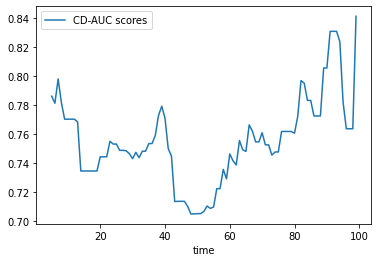

#-------------------------  1  ----------------------#
########################### Grid search
Best parameters set found on development set:

{'coxphsurvivalanalysis__alpha': 3.8000000000000003}

Grid scores on train set:
Mean:  0.7618625912706705
Stdev:  0.009421826657063936

Grid scores on val set:
Mean:  0.6743097213583785
Stdev:  0.035054909337007244

TRAIN: The c-index of Cox using a GridSearchCV is 0.756
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
TEST: The c-index of Cox using a GridSearchCV is 0.693
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
CI-IPCW
(0.6757642066663558, 2111, 936, 0, 9)
CIC
(0.692812602559895, 2111, 936, 0, 9)
CD-AUC
Brier Score
[0.65459209]
(array([0.76513761, 0.75897436, 0.78835063, 0.76414141, 0.7502343 ,
       0.7502343 , 0.7502343 , 0.7502343 , 0.73550725, 0.70263158,
       0.70263158, 0.70263158, 0.70263158, 0.70263158, 0.70263158,
       0.70553752, 0.70553752, 0.70553752,

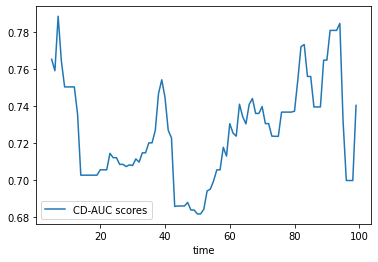

#-------------------------  2  ----------------------#
########################### Grid search
Best parameters set found on development set:

{'coxphsurvivalanalysis__alpha': 3.8000000000000003}

Grid scores on train set:
Mean:  0.7082110608054976
Stdev:  0.012535980394969323

Grid scores on val set:
Mean:  0.6459632988402516
Stdev:  0.03059461408718631

TRAIN: The c-index of Cox using a GridSearchCV is 0.706
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
TEST: The c-index of Cox using a GridSearchCV is 0.761
The best set of parameters is: {'coxphsurvivalanalysis__alpha': 3.8000000000000003}
CI-IPCW
(0.7542533776595148, 2318, 728, 1, 9)
CIC
(0.7609123728257302, 2318, 728, 1, 9)
CD-AUC
Brier Score
[1.54844593]
(array([0.84266055, 0.85128205, 0.85986159, 0.85707071, 0.86644799,
       0.86644799, 0.86644799, 0.86644799, 0.86684783, 0.82982456,
       0.82982456, 0.82982456, 0.82982456, 0.82982456, 0.82982456,
       0.79473301, 0.79473301, 0.79473301,

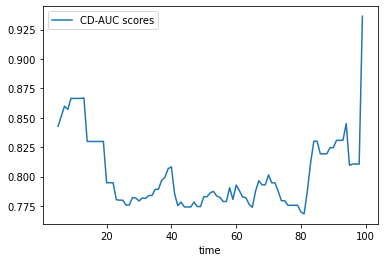

In [67]:
from sksurv.ensemble import RandomSurvivalForest

rsf = make_pipeline(preprocessor, RandomSurvivalForest(random_state=42))
# rsf.fit(X_trn, y_trn)
# ci_rsf = concordance_index_censored(y_test["cens"], y_test["time"], rsf.predict(X_test))
# print(f'The c-index of Random Survival Forest is given by {ci_rsf[0]:.3f}')

from scipy.stats import reciprocal
from sklearn.model_selection import RandomizedSearchCV

class reciprocal_int:
    def __init__(self, a, b):
        self._distribution = reciprocal(a, b)

    def rvs(self, *args, **kwargs):
        return self._distribution.rvs(*args, **kwargs).astype(int)

    
cv = KFold(n_splits=5, random_state=1, shuffle=True)

param_distributions1 = {
    'randomsurvivalforest__max_features': reciprocal_int(3, 8),
    'randomsurvivalforest__max_depth': reciprocal_int(5, 50),
    'randomsurvivalforest__min_samples_leaf': reciprocal_int(1, 40),
}

model_random_search = RandomizedSearchCV(
    rsf, 
    param_distributions=param_distributions1,
    n_iter=50, n_jobs=-1, cv=cv, 
    return_train_score=True,
    random_state=0)



#model_random_search.fit(X_trn, y_trn)

# print(
#     f"The c-index of random survival forest using a {model_random_search.__class__.__name__} is "
#     f"{model_random_search.score(X_test, y_test):.3f}")
# print(
#     f"The best set of parameters is: {model_random_search.best_params_}"
# )

# max_depth = model_random_search.best_params_['randomsurvivalforest__max_depth']
# max_features = model_random_search.best_params_['randomsurvivalforest__max_features']
# min_samples_leaf = model_random_search.best_params_['randomsurvivalforest__min_samples_leaf']

# rsf_best = make_pipeline(preprocessor, RandomSurvivalForest(
#     random_state=42, max_depth=max_depth, max_features=max_features, min_samples_leaf=min_samples_leaf))
# rsf_best.fit(X_trn, y_trn)
# ci_rsf = concordance_index_censored(y_test["cens"], y_test["time"], rsf_best.predict(X_test))
# print(f'The c-index of Random Survival Forest is given by {ci_rsf[0]:.3f}')



import warnings
#warnings.filterwarnings(action='once')
warnings.filterwarnings('ignore')


#get_target = lambda df: (df['duration'].values, df['event'].values)
get_target = lambda df: (df['recurr_time_final'].values, df['recurr_code'].values)

#y_train = get_target(df_train_2)
#y_train = y_train_comp[['event', 'time']]
# y_train = labtrans.fit_transform(*get_target(df_train))
# y_val = labtrans.transform(*get_target(df_val))


for i in range(3):
    print("#------------------------- ", i, " ----------------------#" )
    X_input_train = []
    X_input_test = []
    if (i==0):
        X_input_train = X_train_comp
        X_input_test = X_test_comp
    elif (i==1):
        X_input_train = X_train_select
        X_input_test = X_test_select
    elif (i==2):
        X_input_train = X_train_nomo
        X_input_test = X_test_nomo
        
   
#     print("########################### Random search")
#     model_random_search.fit(X_input_train, y_train)
    
#     print("Best parameters set found on development set:")
#     print()
#     print(model_random_search.best_params_)
#     print()
#     print("Grid scores on train set:")
#     print("Mean: ", model_random_search.cv_results_['mean_train_score'][model_random_search.best_index_])
#     print("Stdev: ", model_random_search.cv_results_['std_train_score'][model_random_search.best_index_])
#     print()
#     print("Grid scores on validation set:")
#     print("Mean: ", model_random_search.cv_results_['mean_test_score'][model_random_search.best_index_])
#     print("Stdev: ", model_random_search.cv_results_['std_test_score'][model_random_search.best_index_])
#     print()
    
#     print(
#         f"TRAIN: The c-index of Cox using a {model_random_search.__class__.__name__} is "
#         f"{model_random_search.score(X_input_train, y_train):.3f}")
#     print(
#         f"The best set of parameters is: {model_random_search.best_params_}"
#     )

#     print(
#         f"TEST: The c-index of Cox using a {model_random_search.__class__.__name__} is "
#         f"{model_random_search.score(X_input_test, y_test):.3f}")
#     print(
#         f"The best set of parameters is: {model_random_search.best_params_}"
#     )
    
#     max_depth = model_random_search.best_params_['randomsurvivalforest__max_depth']
#     max_features = model_random_search.best_params_['randomsurvivalforest__max_features']
#     min_samples_leaf = model_random_search.best_params_['randomsurvivalforest__min_samples_leaf']

#     rsf_best = make_pipeline(preprocessor, RandomSurvivalForest(
#         random_state=42, max_depth=max_depth, max_features=max_features, min_samples_leaf=min_samples_leaf))
#     rsf_best.fit(X_input_train, y_train)
#     ci_rsf = concordance_index_censored(y_test["event"], y_test["time"], rsf_best.predict(X_input_test))
#     print(f'The c-index of Random Survival Forest is given by {ci_rsf[0]:.3f}')

    
    
    print("########################### Grid search")

    
    model_grid_search.fit(X_input_train, y_train)
    print("Best parameters set found on development set:")
    print()
    print(model_grid_search.best_params_)
    print()
    print("Grid scores on train set:")
    print("Mean: ", model_grid_search.cv_results_['mean_train_score'][model_grid_search.best_index_])
    print("Stdev: ", model_grid_search.cv_results_['std_train_score'][model_grid_search.best_index_])
    print()
    print("Grid scores on val set:")
    print("Mean: ", model_grid_search.cv_results_['mean_test_score'][model_grid_search.best_index_])
    print("Stdev: ", model_grid_search.cv_results_['std_test_score'][model_grid_search.best_index_])
    print()

    print(
        f"TRAIN: The c-index of Cox using a {model_grid_search.__class__.__name__} is "
        f"{model_grid_search.score(X_input_train, y_train):.3f}")
    print(
        f"The best set of parameters is: {model_grid_search.best_params_}"
    )

    print(
        f"TEST: The c-index of Cox using a {model_grid_search.__class__.__name__} is "
        f"{model_grid_search.score(X_input_test, y_test):.3f}")
    print(
        f"The best set of parameters is: {model_grid_search.best_params_}"
    )
    
    
    preds = model_grid_search.best_estimator_.predict(X_input_test)
    #preds = rsf_best(X_input_test)
    #print(preds)

    print("CI-IPCW")
    print(
        sksurv.metrics.concordance_index_ipcw(
           y_train,
           y_test,
          preds,
            tau=100 # within 100 days
        )
    )

    print("CIC")
    print(
        sksurv.metrics.concordance_index_censored(
            y_test['event'],
            y_test['time'],
          preds,
        )
    )


    print("CD-AUC")
    auc_scores = sksurv.metrics.cumulative_dynamic_auc(
           y_train,
            y_test,
          preds,
            np.arange(5,100)
        )


    print("Brier Score")

    times, score = sksurv.metrics.brier_score(
        y_train, y_test, preds, y_test['time'].max() - 1
    )
    print(score)


    print(auc_scores)
    auc_df = pd.concat([
        pd.DataFrame(np.arange(5,100)),
        pd.DataFrame(auc_scores[0] )
    ], axis = 1)
    auc_df.columns=['time', 'CD-AUC scores']
    #display(auc_df)
    auc_df.plot('time', 'CD-AUC scores')
    plt.show()
    
    

## permutation importance

In [84]:
from eli5.sklearn import PermutationImportance

X_input_train = X_train_comp
X_input_test = X_test_comp
    
rsf.fit(X_input_train, y_train)
perm = PermutationImportance(
    rsf.steps[-1][1], n_iter=100, random_state=42).fit(preprocessor.fit_transform(X_input_train),y_train)

In [78]:
len(cols_leave_nomo )

13

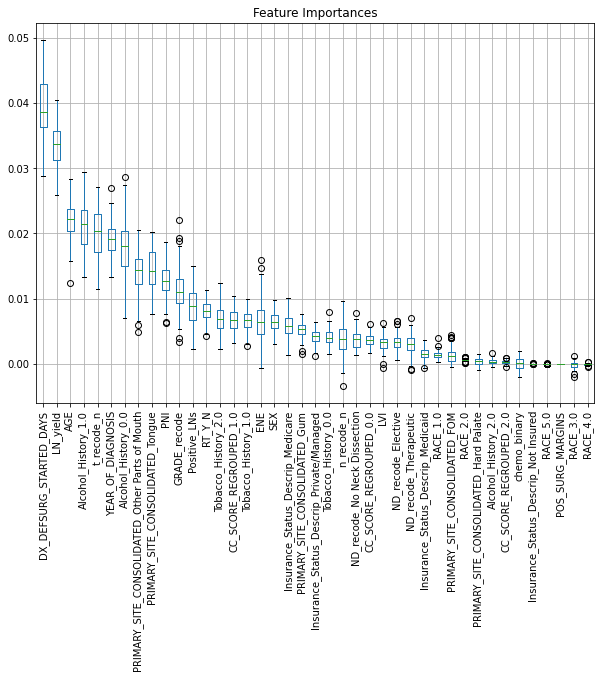

Weight,Feature
0.0391 ± 0.0086,DX_DEFSURG_STARTED_DAYS
0.0335 ± 0.0068,LN_yield
0.0220 ± 0.0060,AGE
0.0211 ± 0.0073,Alcohol_History_1.0
0.0201 ± 0.0075,t_recode_n
0.0191 ± 0.0052,YEAR_OF_DIAGNOSIS
0.0177 ± 0.0089,Alcohol_History_0.0
0.0144 ± 0.0060,PRIMARY_SITE_CONSOLIDATED_Tongue
0.0139 ± 0.0060,PRIMARY_SITE_CONSOLIDATED_Other Parts of Mouth
0.0126 ± 0.0052,PNI


In [86]:
import eli5

data = perm.results_
data = pd.DataFrame(data, columns=cols_leave_comp)
meds = data.median()
meds = meds.sort_values(ascending=False)
data = data[meds.index]

fig, ax = plt.subplots(figsize=(10,7))
data.boxplot(ax=ax)
ax.set_title('Feature Importances')
plt.xticks(rotation=90)
plt.show()

eli5.show_weights(perm, feature_names = cols_leave_comp)